In [9]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Patch
import seaborn as sns
from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorNeuropixelsProjectCache
import psytrack as psy
import os

sns.set_style('ticks')

import src_local.utils as utils
import src_local.get_metrics as get_metrics
import src_local.format_Xy as format_Xy
import src_local.psy_funcs as psy_funcs

In [10]:
drive_dir = "/Volumes/Brain2024"
cache = VisualBehaviorNeuropixelsProjectCache.from_local_cache(cache_dir=drive_dir, use_static_cache=True)

behavior_sessions = cache.get_behavior_session_table()

In [11]:
behavior_sessions = cache.get_behavior_session_table()
subset_sessions = behavior_sessions[
    (behavior_sessions.session_type.str.contains('EPHYS')) & 
    (behavior_sessions.genotype == 'wt/wt')
]

In [12]:
example_dir = 'local_modelfit/example/geom'
example_plot_dir = 'plots/modelfit/example/geom'

/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


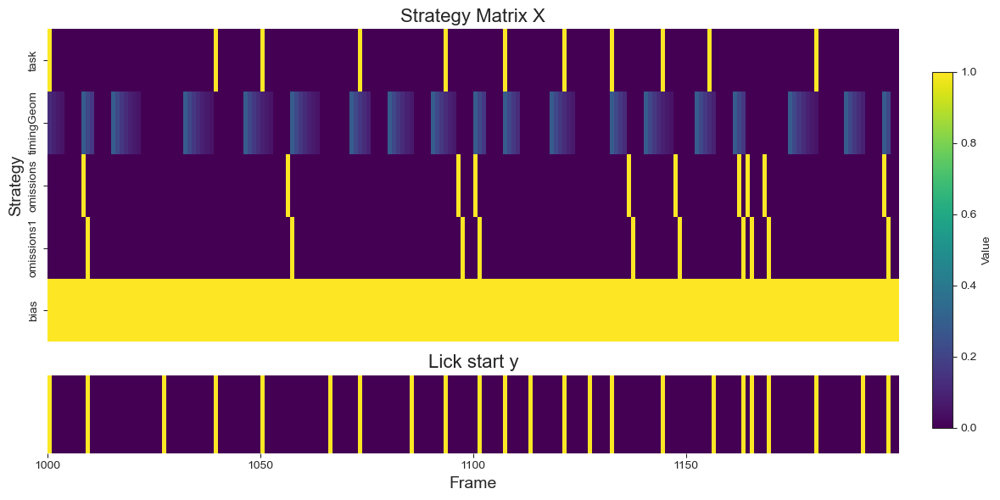

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1590.1510759298835
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 17.22%
Timing Index: 0.02%
Omission Index: 0.01%
Post-Omission Index: 2.87%
Overall Strategy Index: 17.20
Dominant Strategy: Visual


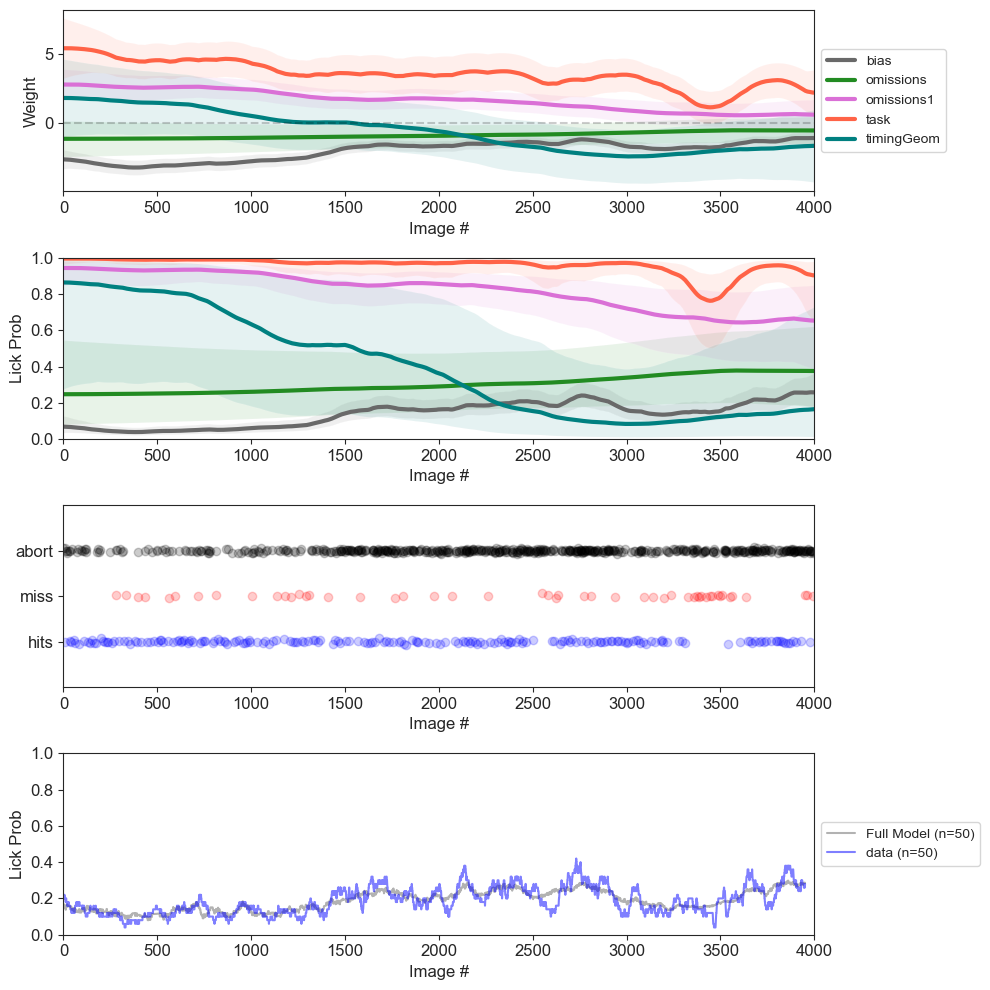

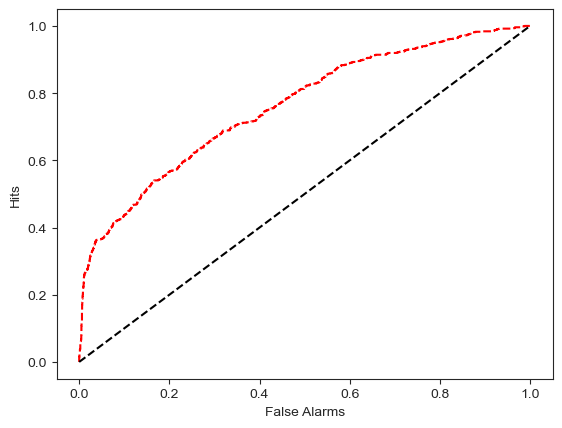

In [13]:
bsid = subset_sessions.index[0]
behavior_session = cache.get_behavior_session(bsid)
licks = behavior_session.licks
licks_annot = get_metrics.annotate_licks(licks, behavior_session)
stimulus_presentations = behavior_session.stimulus_presentations
stimulus_presentations = stimulus_presentations[stimulus_presentations['active']]
stim_table = get_metrics.annotate_bouts(licks_annot, stimulus_presentations)

format_options = {
                  'preprocess': 2, 
                  'timing_params': [-5,4],
                  'num_cv_folds': 10}

psydata = format_Xy.build_regressor(stim_table, format_options, behavior_session)

strategy_list = ['task', 'timingGeom', 'omissions','omissions1', 'bias']


format_Xy.visualize_design(psydata['full_df'], strategy_list, f'{example_plot_dir}/weight_mat', t_start = 1000)

# For other non-recording sessions
if np.sum(stimulus_presentations.omitted) == 0:
    strategy_list.remove('omissions')
    strategy_list.remove('omissions1')
hyp, evd, wMode, credibleInt,weights = psy_funcs.fit_weights(psydata,strategy_list)
# Save to .npy file
np.save(f'{example_dir}/wMode.npy', wMode)
ypred,ypred_each = psy_funcs.compute_ypred(psydata, wMode,weights)
psy_funcs.plot_weights(wMode, weights,psydata,errorbar=credibleInt, ypred=ypred,
    filename=f"{example_plot_dir}/fit")
print('Model Evidence:', evd)

print("Cross Validation Analysis")
cross_psydata = psy.trim(psydata, 
END=int(np.floor(len(psydata['y'])/format_options['num_cv_folds'])\
*format_options['num_cv_folds'])) 
cross_results = psy_funcs.compute_cross_validation(cross_psydata, hyp, weights,
folds=format_options['num_cv_folds'])
cv_pred = psy_funcs.compute_cross_validation_ypred(cross_psydata, cross_results,ypred)
auc = psy_funcs.compute_model_roc(psydata['y'],cv_pred,plot_this=True)

print("Lesion Analysis")
minus_task = strategy_list.copy()
minus_task.remove('task')
_, evd_minus_task, _, _, _ = psy_funcs.fit_weights(psydata,minus_task)
minus_timing =  [s for s in strategy_list if 'timing' not in s]
_, evd_minus_timing, _, _, _ = psy_funcs.fit_weights(psydata,minus_timing)
minus_omit = strategy_list.copy()
minus_omit.remove('omissions')
_, evd_minus_omit, _, _, _ = psy_funcs.fit_weights(psydata,minus_omit)
minus_omit1 = strategy_list.copy()
minus_omit1.remove('omissions1')
_, evd_minus_omit1, _, _, _ = psy_funcs.fit_weights(psydata,minus_omit1)

# Calculate indices
visual_index = utils.calculate_index(evd, evd_minus_task)
timing_index = utils.calculate_index(evd, evd_minus_timing)
omission_index = utils.calculate_index(evd, evd_minus_omit)
post_omission_index = utils.calculate_index(evd, evd_minus_omit1)

# Calculate overall strategy index
strategy_index = visual_index - timing_index

print(f"Visual Index: {visual_index:.2f}%")
print(f"Timing Index: {timing_index:.2f}%")
print(f"Omission Index: {omission_index:.2f}%")
print(f"Post-Omission Index: {post_omission_index:.2f}%")
print(f"Overall Strategy Index: {strategy_index:.2f}")

# Determine dominant strategy
dominant_strategy = "Visual" if strategy_index > 0 else "Timing"
print(f"Dominant Strategy: {dominant_strategy}")

In [39]:
len(subset_sessions)

54

In [17]:
session_df = pd.DataFrame(columns = ['auc', 'evd', 'visual_index', 'timing_index', 'omission_index', 'post_omission_index','strategy_index'])


 Processing 1050987699


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


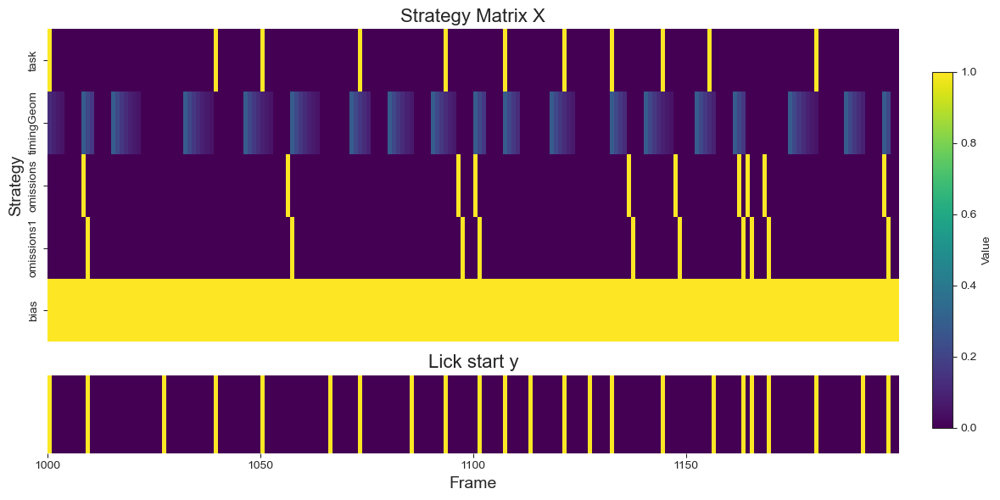

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1590.1510759298835
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 17.22%
Timing Index: 0.02%
Omission Index: 0.01%
Post-Omission Index: 2.87%
Overall Strategy Index: 17.20
Dominant Strategy: Visual

 Processing 1071409009


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


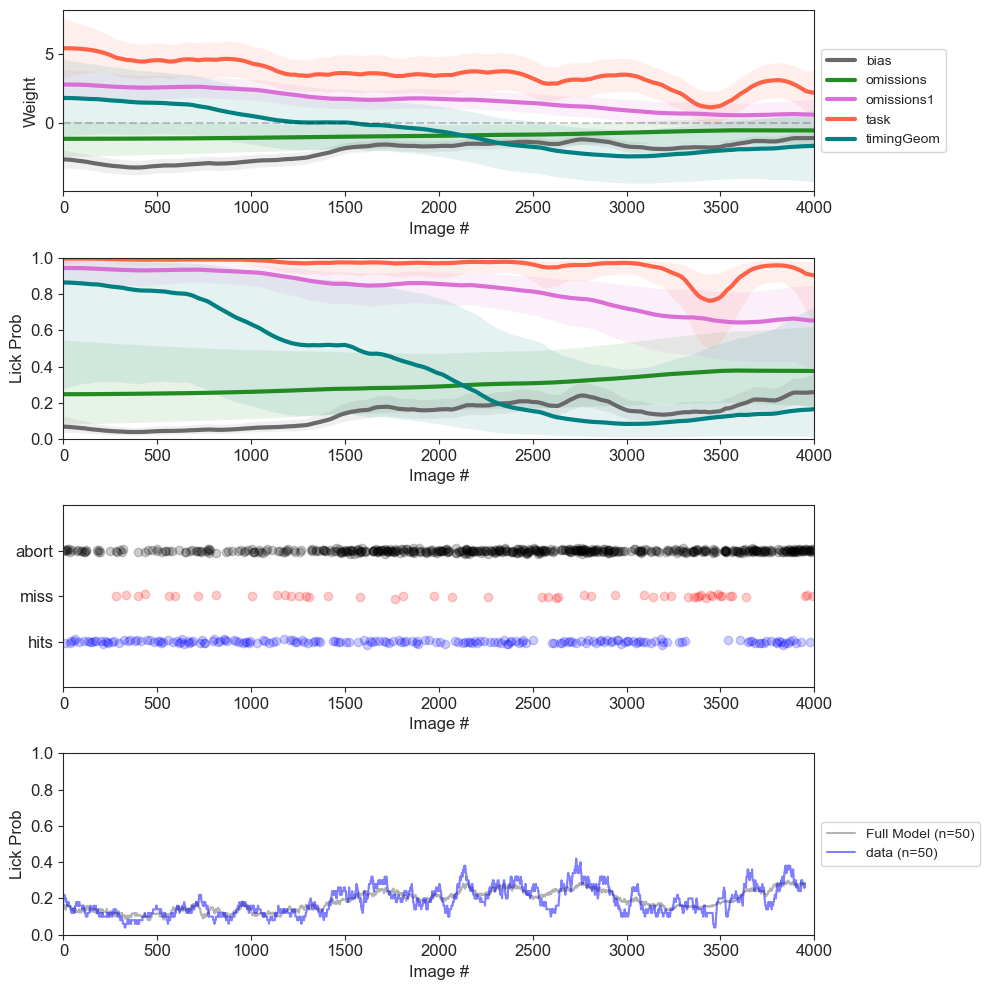

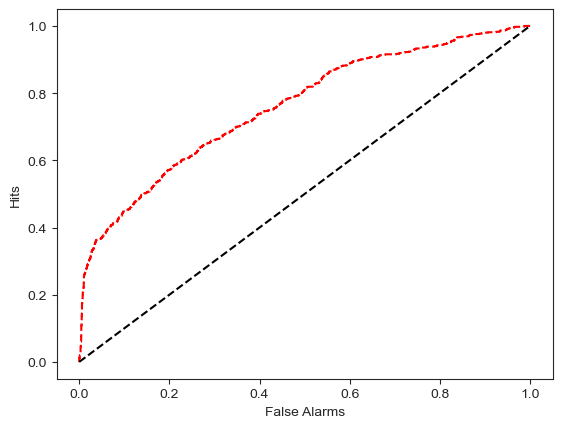

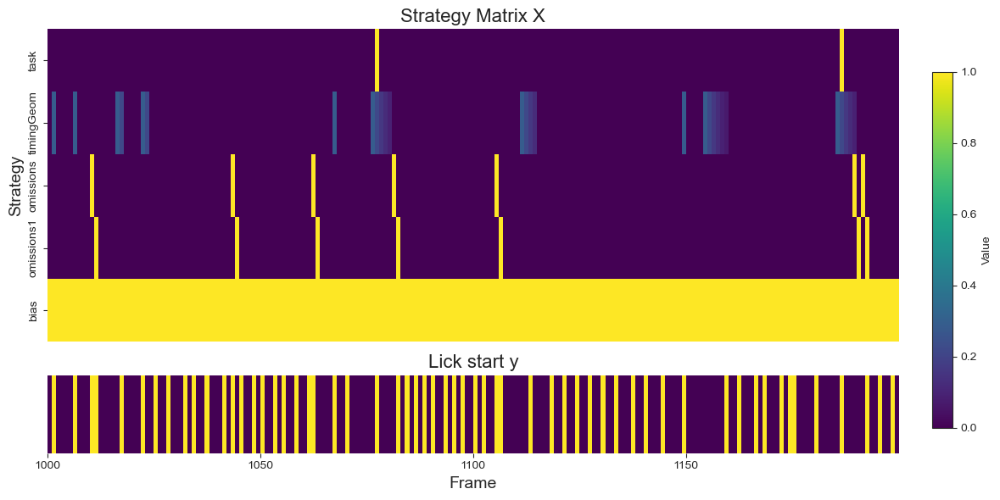

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1980.2085575939127
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 3.71%
Timing Index: 4.96%
Omission Index: 0.19%
Post-Omission Index: 0.29%
Overall Strategy Index: -1.25
Dominant Strategy: Timing

 Processing 1071005395


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


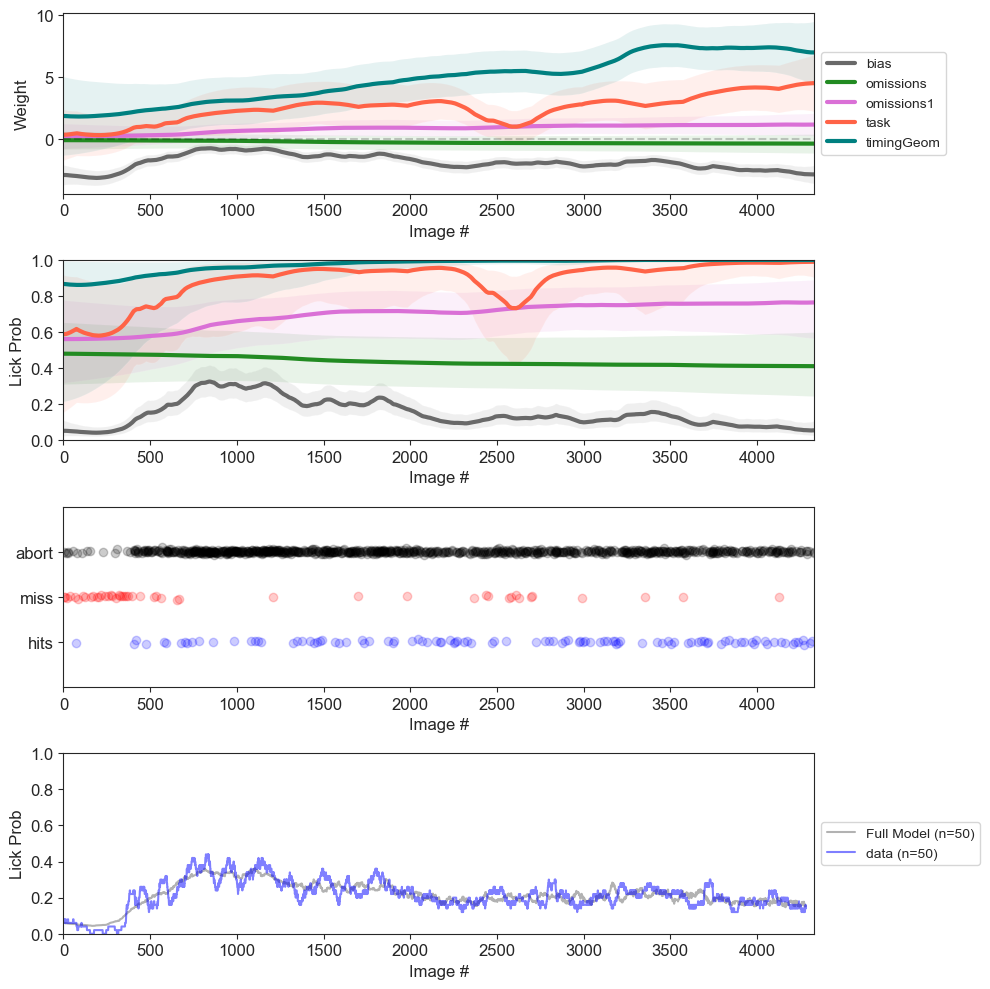

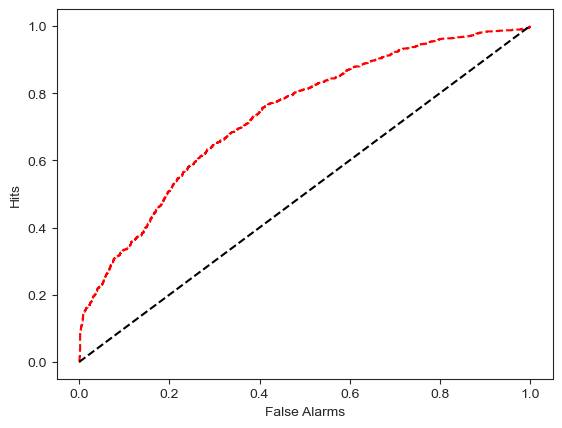

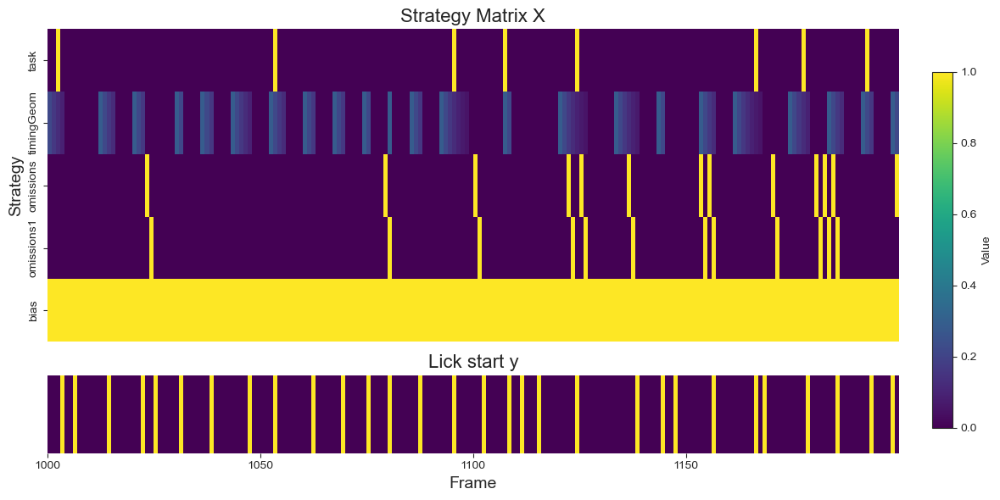

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1409.956487995296
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 19.33%
Timing Index: 3.36%
Omission Index: 0.25%
Post-Omission Index: 1.52%
Overall Strategy Index: 15.97
Dominant Strategy: Visual

 Processing 1077916733


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


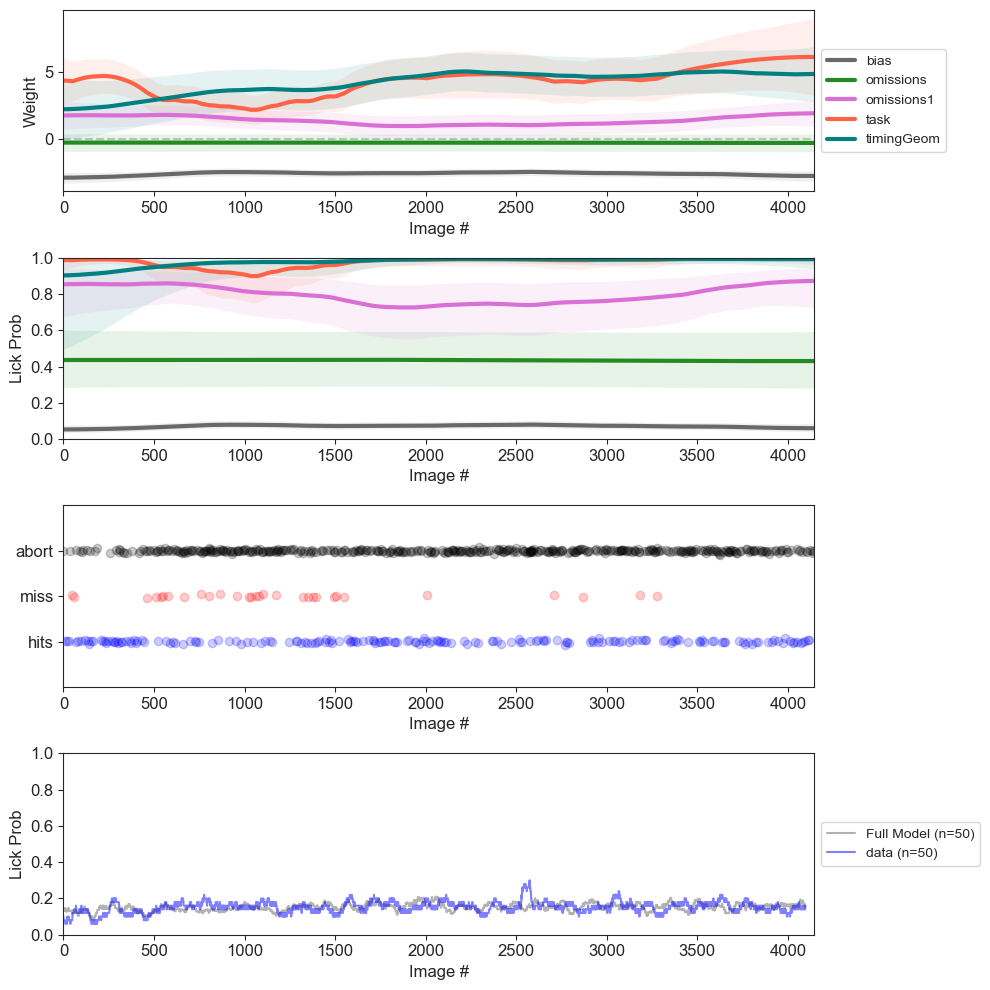

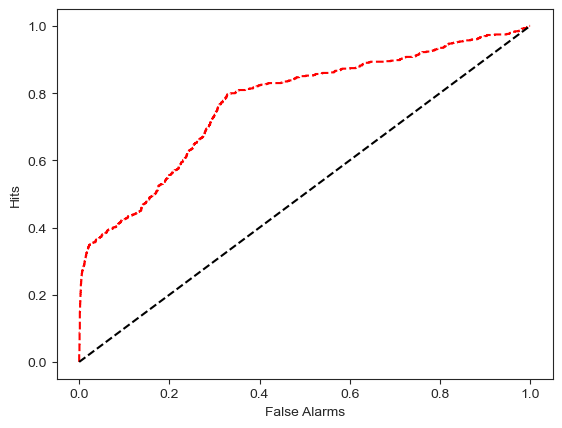

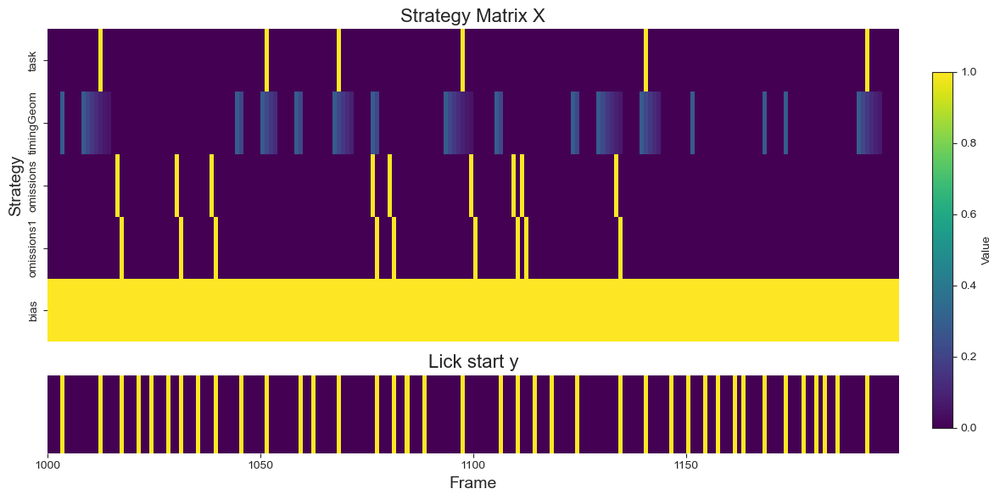

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1454.8107856225542
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 16.16%
Timing Index: 3.16%
Omission Index: 0.02%
Post-Omission Index: 4.05%
Overall Strategy Index: 13.00
Dominant Strategy: Visual

 Processing 1084963019


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


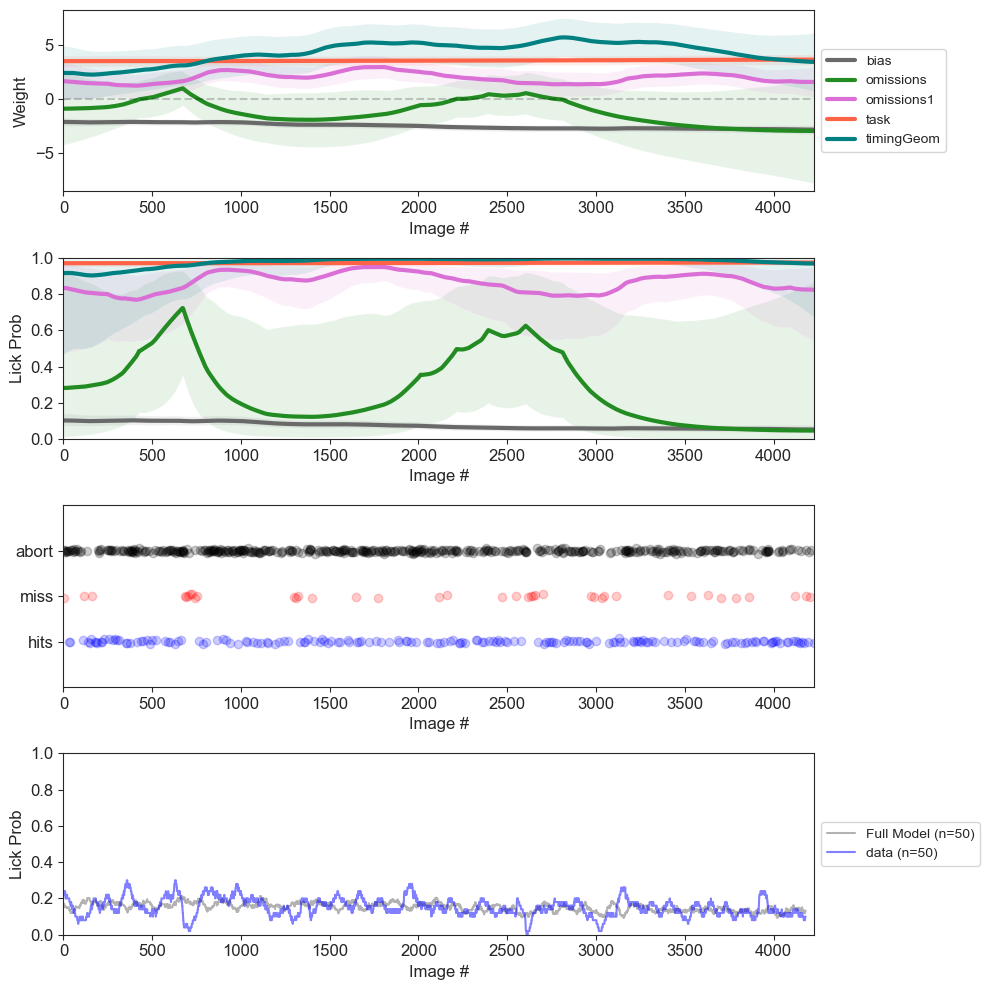

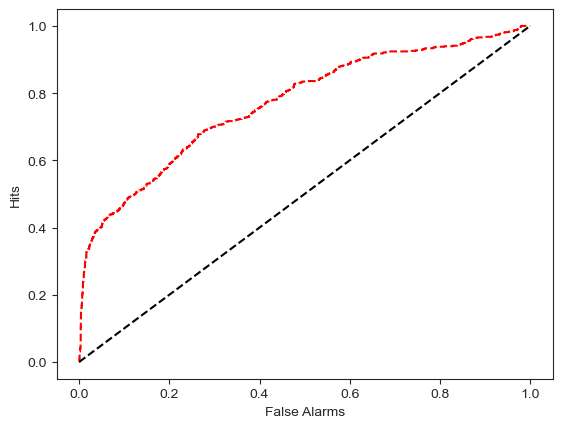

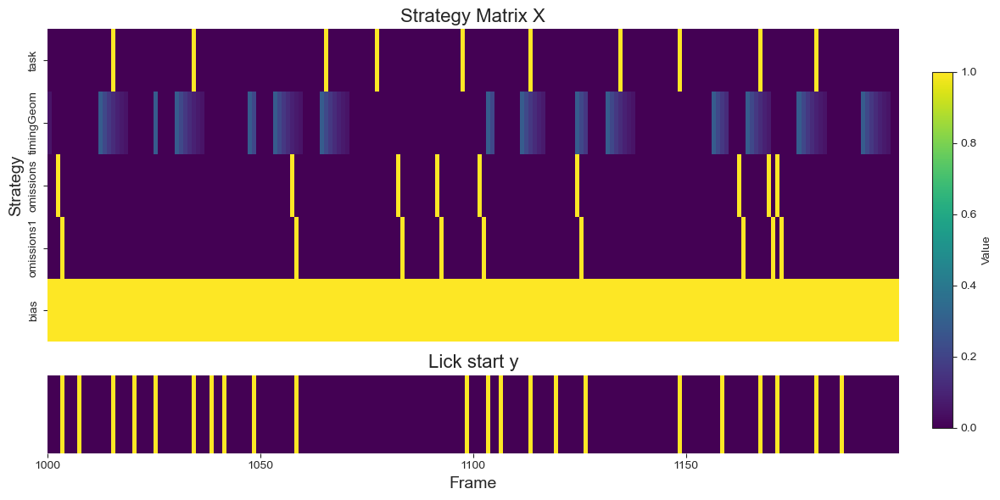

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1377.8610876859311
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 12.78%
Timing Index: 0.22%
Omission Index: 0.14%
Post-Omission Index: 2.04%
Overall Strategy Index: 12.56
Dominant Strategy: Visual

 Processing 1044408432


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


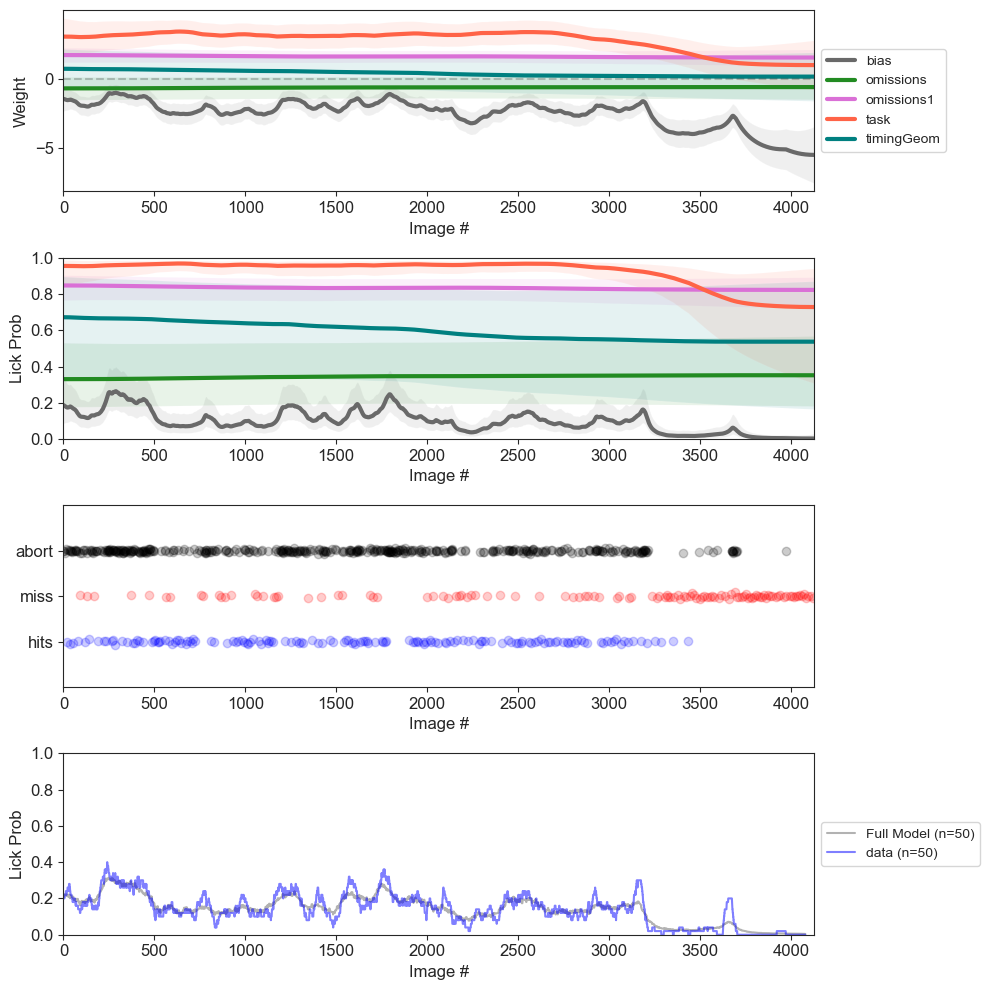

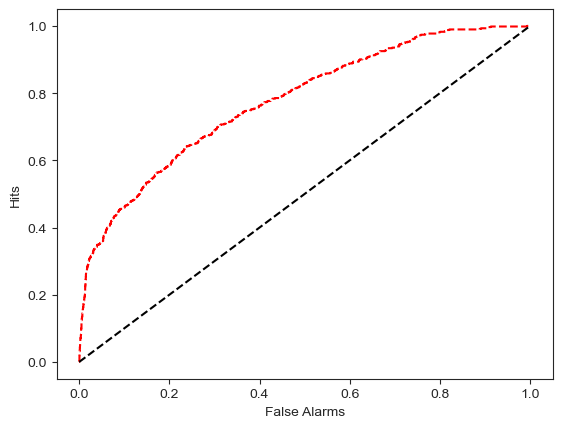

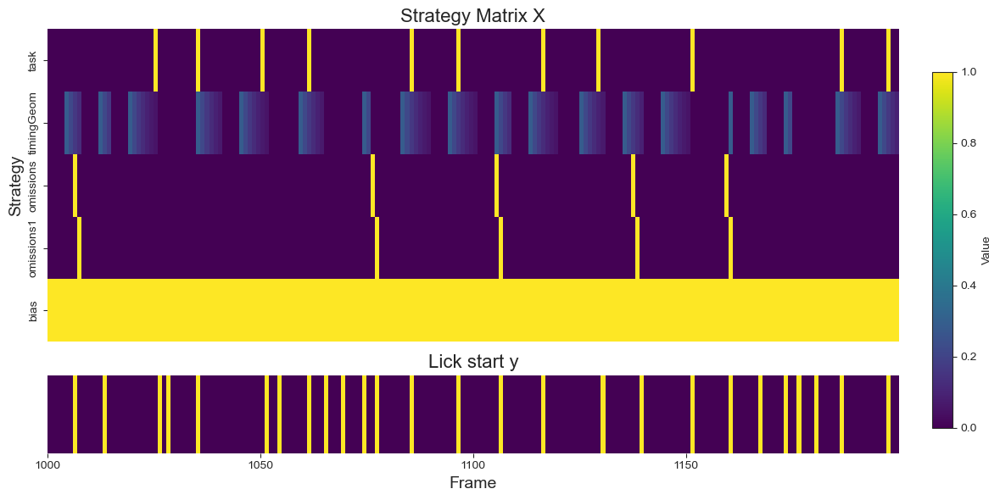

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1474.3343940840277
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 9.26%
Timing Index: 0.45%
Omission Index: 0.20%
Post-Omission Index: 0.54%
Overall Strategy Index: 8.81
Dominant Strategy: Visual

 Processing 1044624428


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


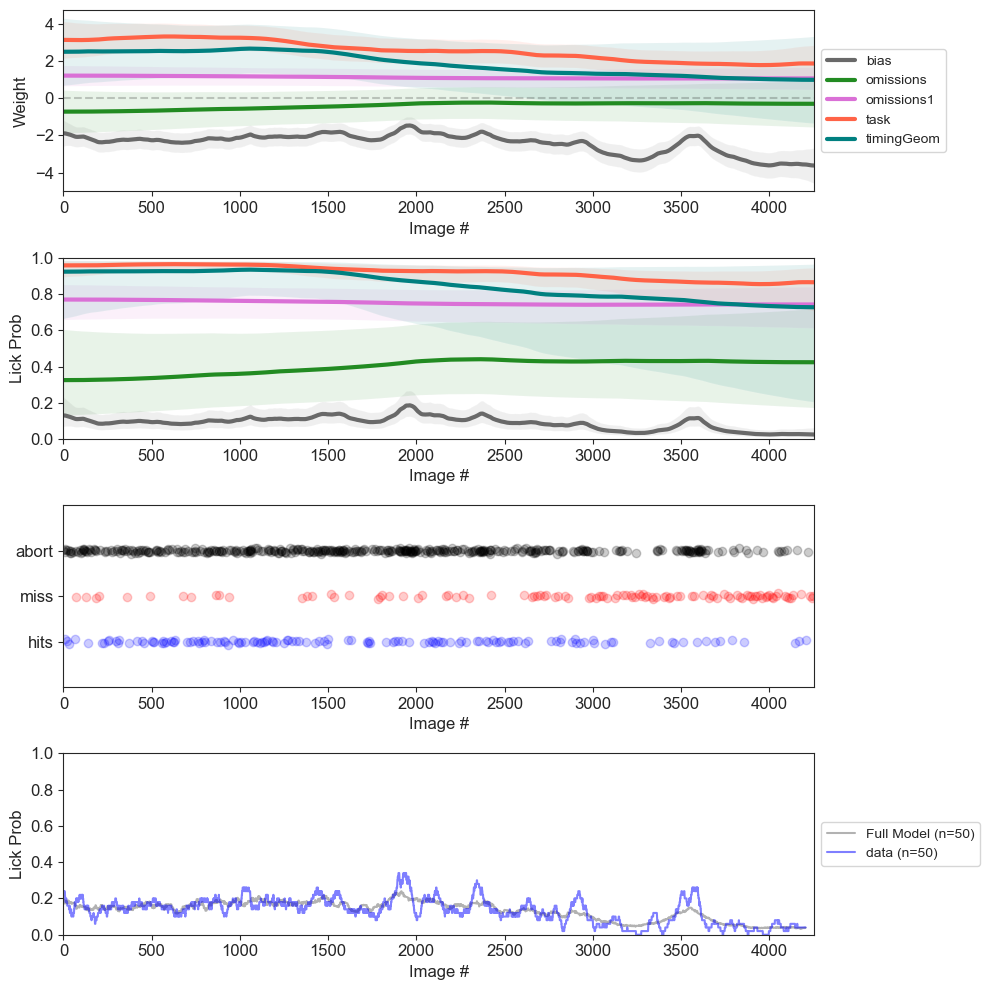

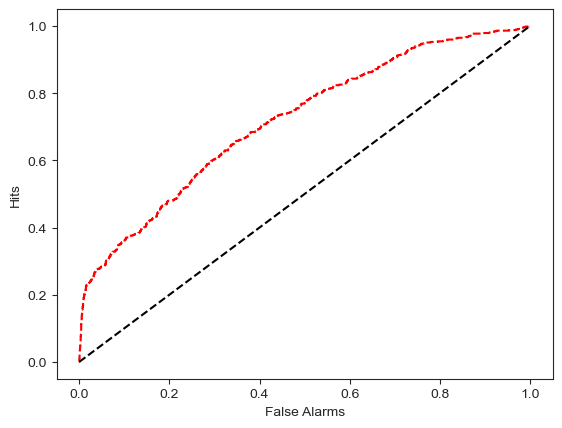

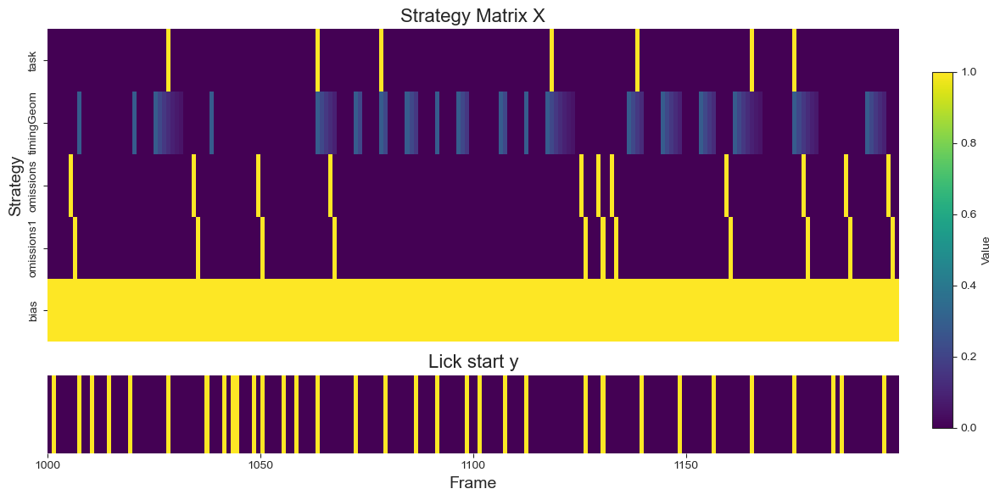

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1709.2616820137628
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 2.08%
Timing Index: 1.11%
Omission Index: 0.02%
Post-Omission Index: 0.87%
Overall Strategy Index: 0.97
Dominant Strategy: Visual

 Processing 1052162536


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


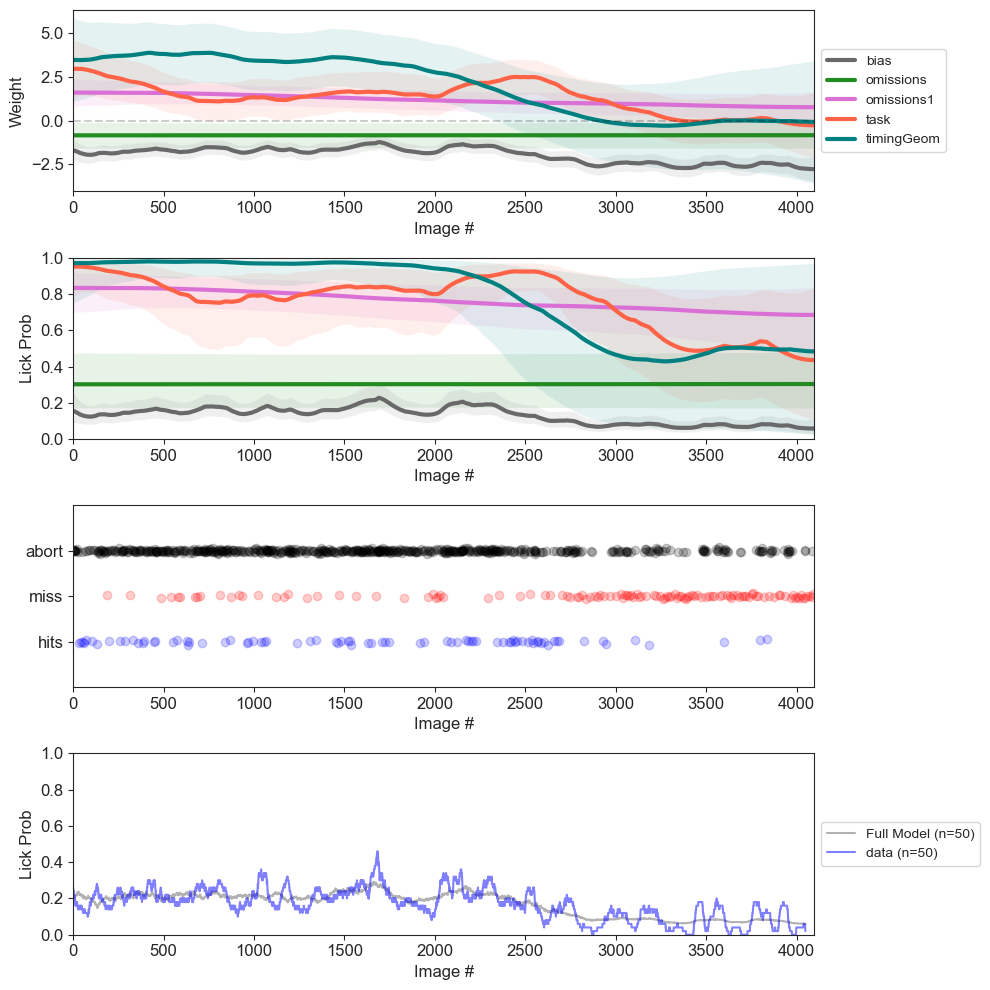

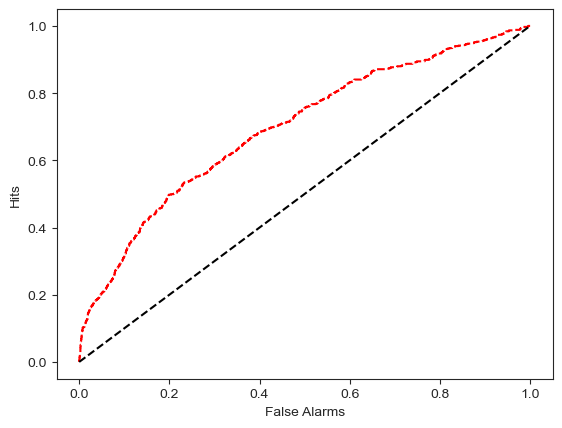

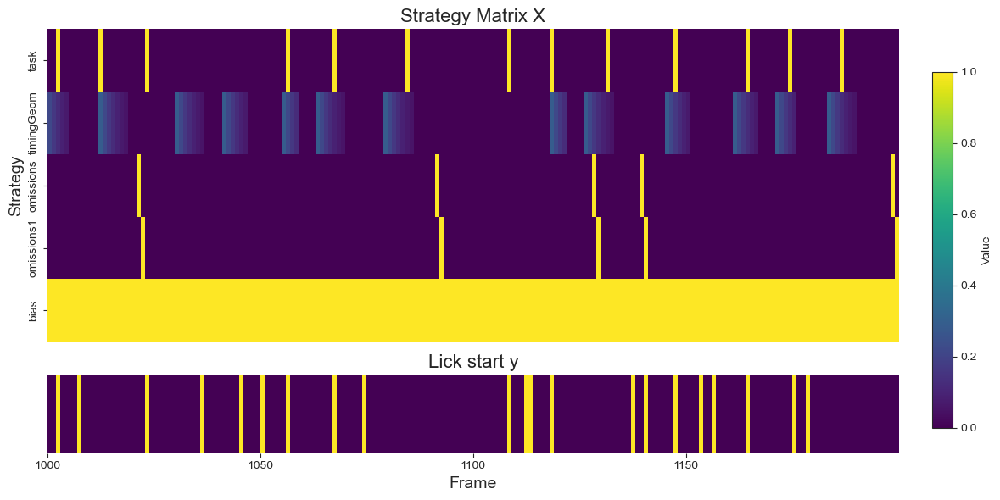

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1685.152096834412
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 7.91%
Timing Index: 0.19%
Omission Index: 0.08%
Post-Omission Index: 0.90%
Overall Strategy Index: 7.72
Dominant Strategy: Visual

 Processing 1056528863


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


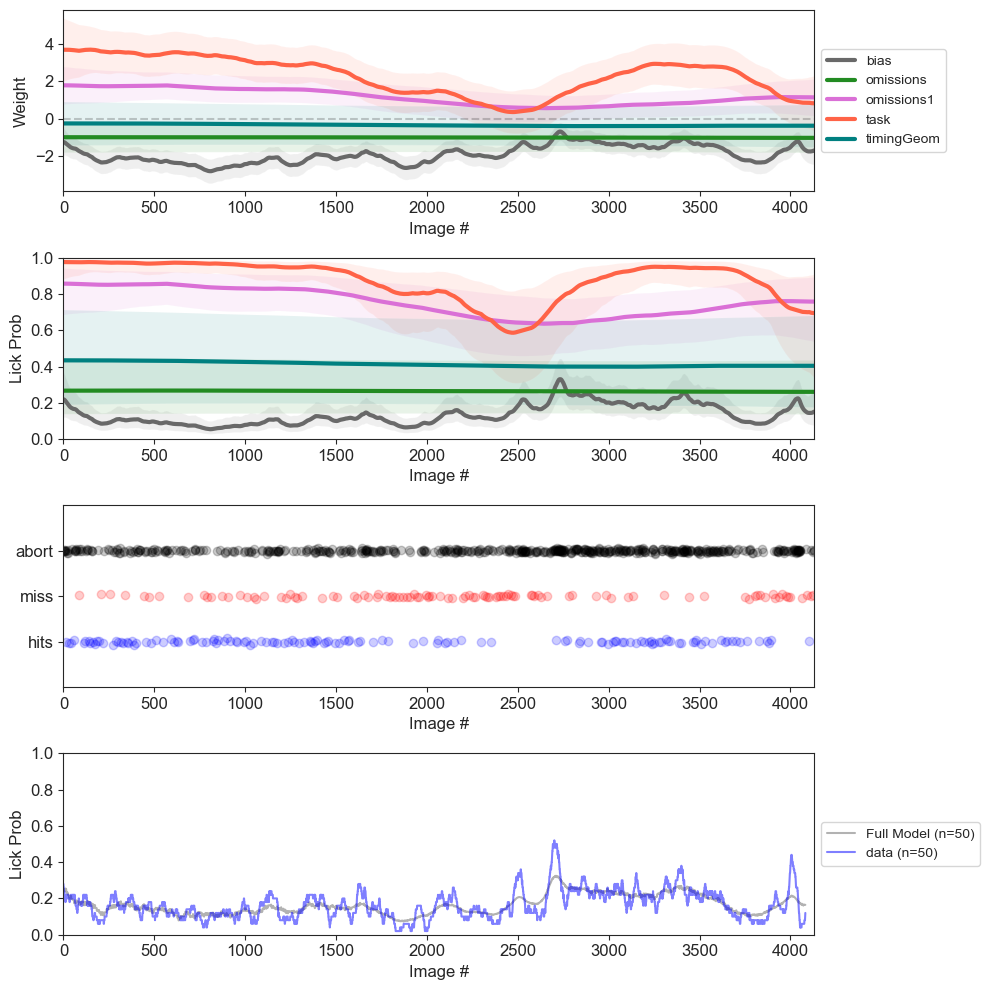

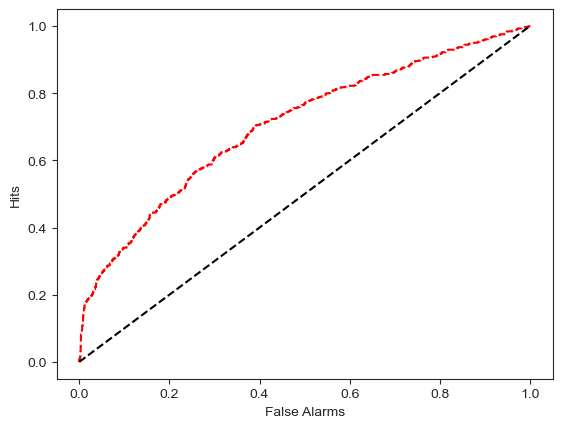

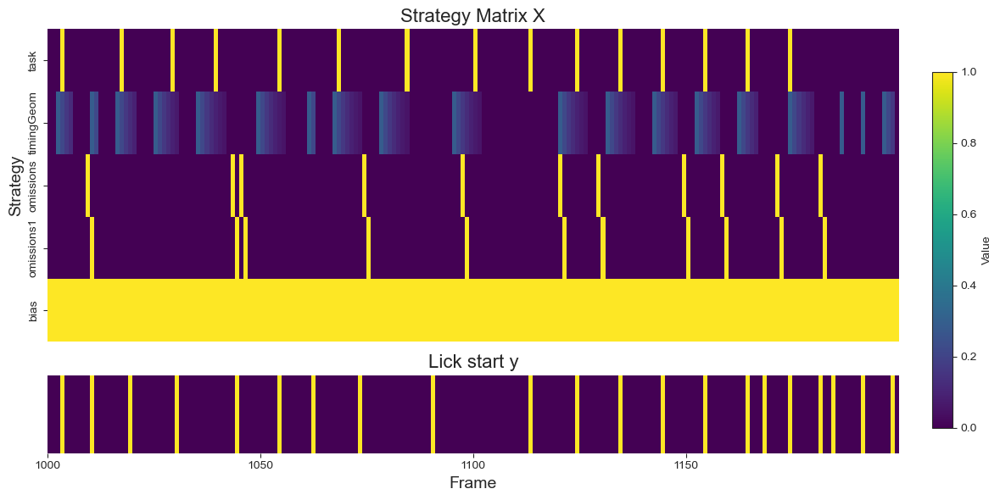

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1432.7554488037567
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 5.60%
Timing Index: 5.01%
Omission Index: 0.12%
Post-Omission Index: 0.25%
Overall Strategy Index: 0.59
Dominant Strategy: Visual

 Processing 1056746264


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


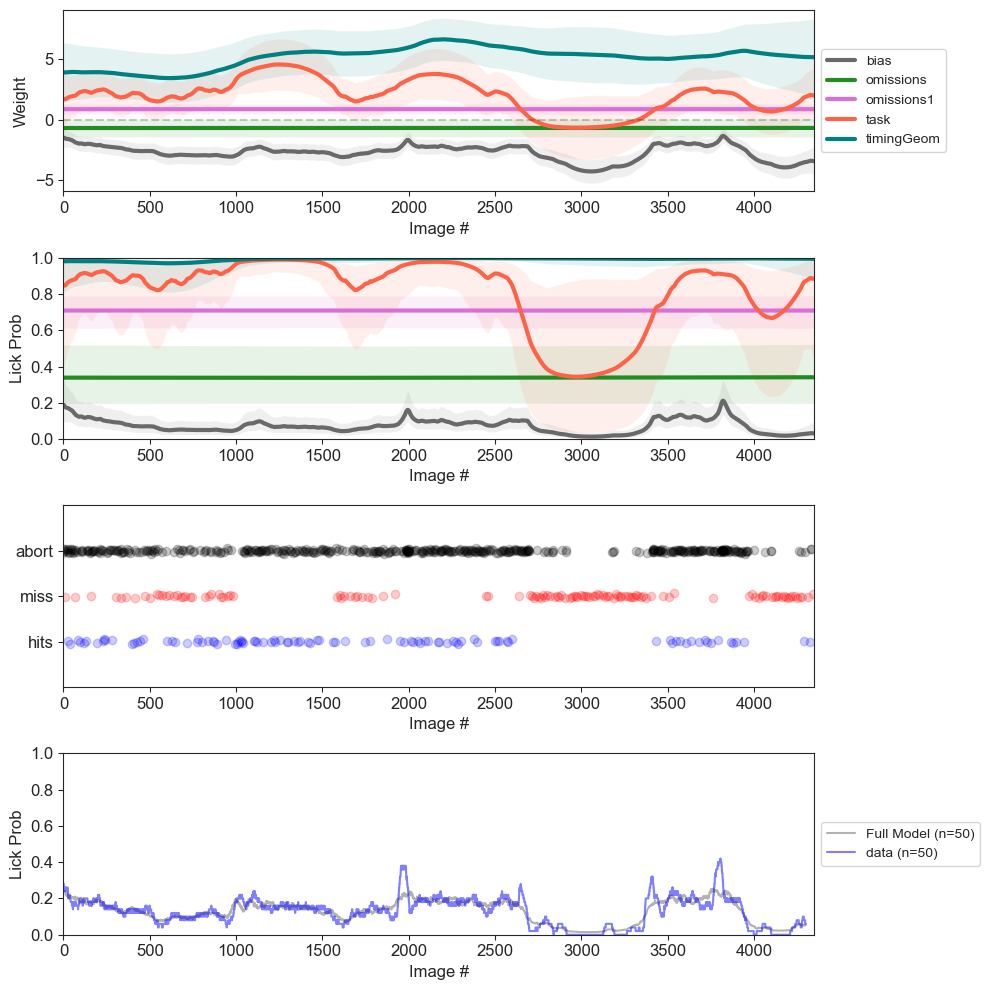

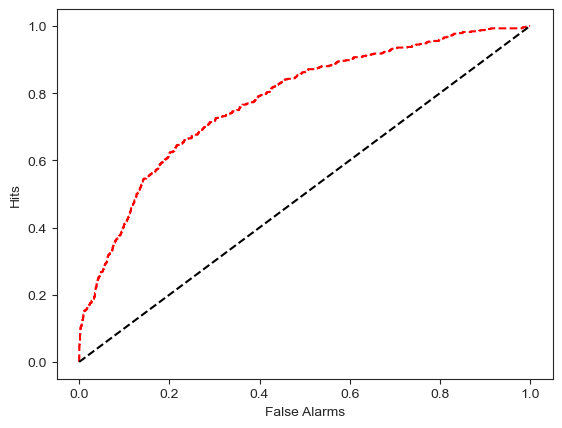

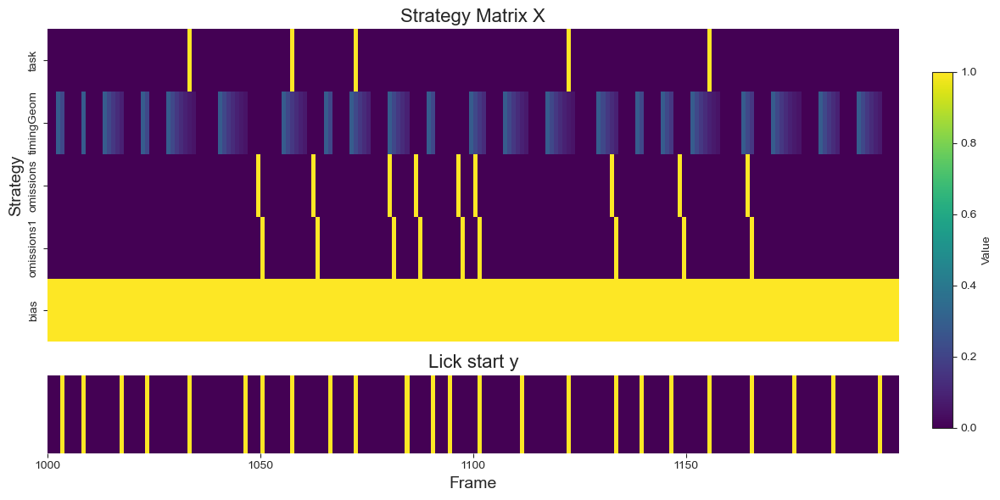

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1279.4734479903418
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 15.17%
Timing Index: 2.99%
Omission Index: 0.29%
Post-Omission Index: 1.42%
Overall Strategy Index: 12.17
Dominant Strategy: Visual

 Processing 1055253879


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


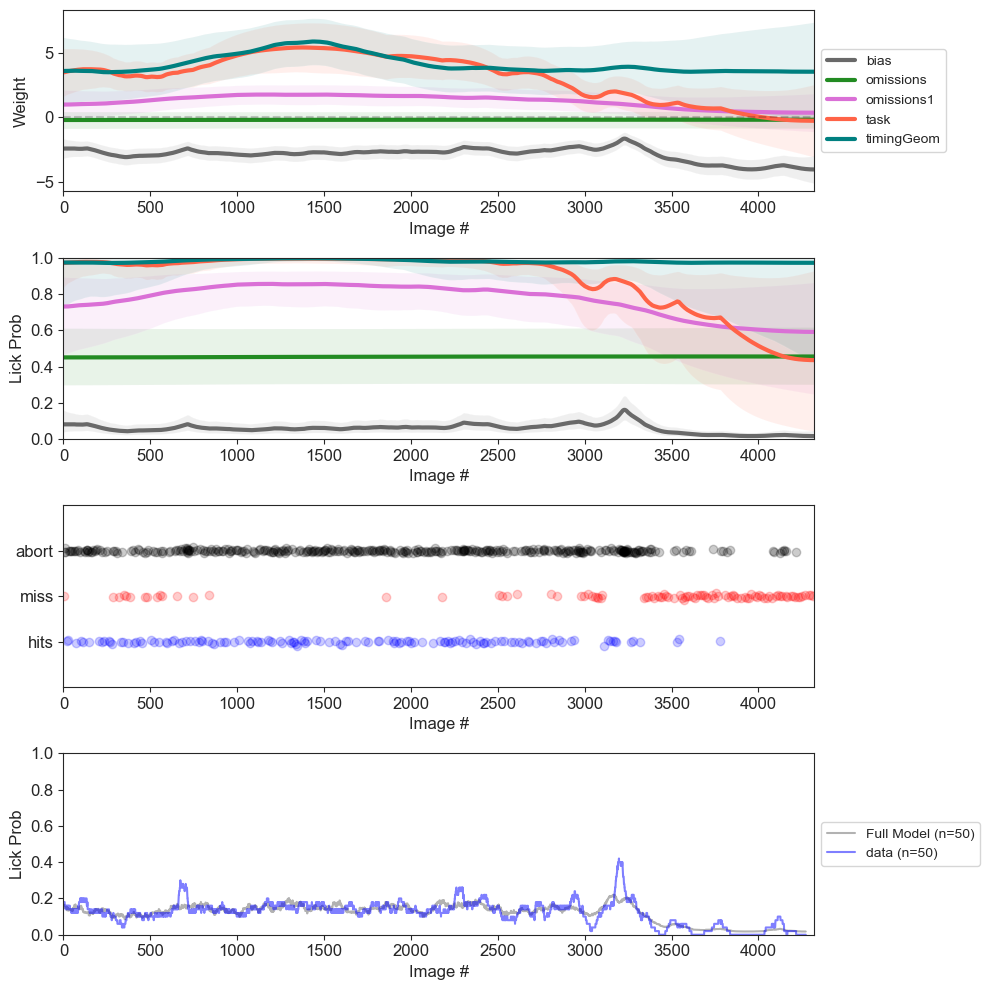

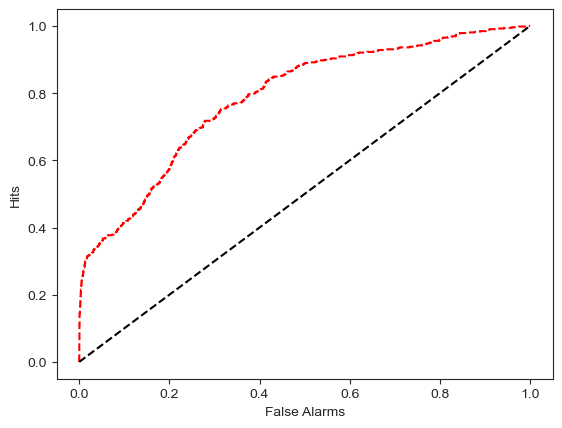

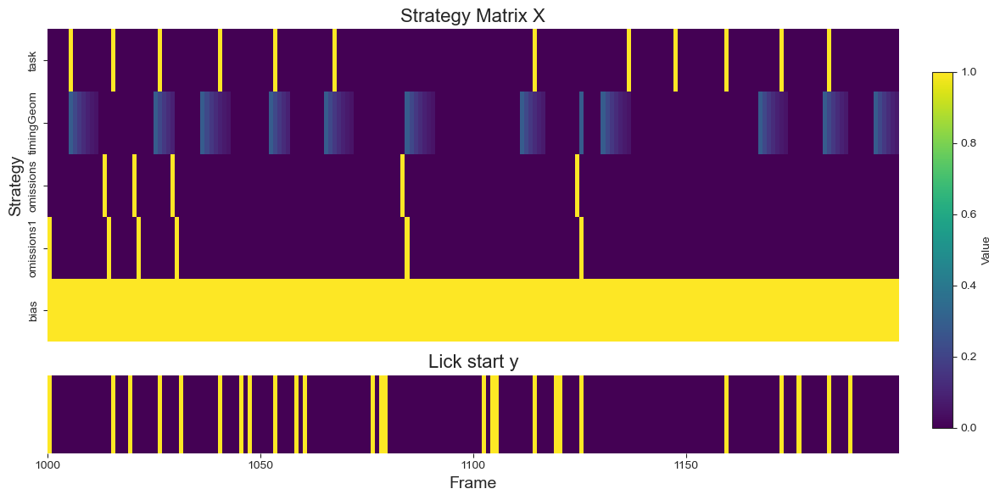

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1421.4368355105107
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 16.73%
Timing Index: 0.62%
Omission Index: 0.27%
Post-Omission Index: 1.92%
Overall Strategy Index: 16.11
Dominant Strategy: Visual

 Processing 1055431030


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


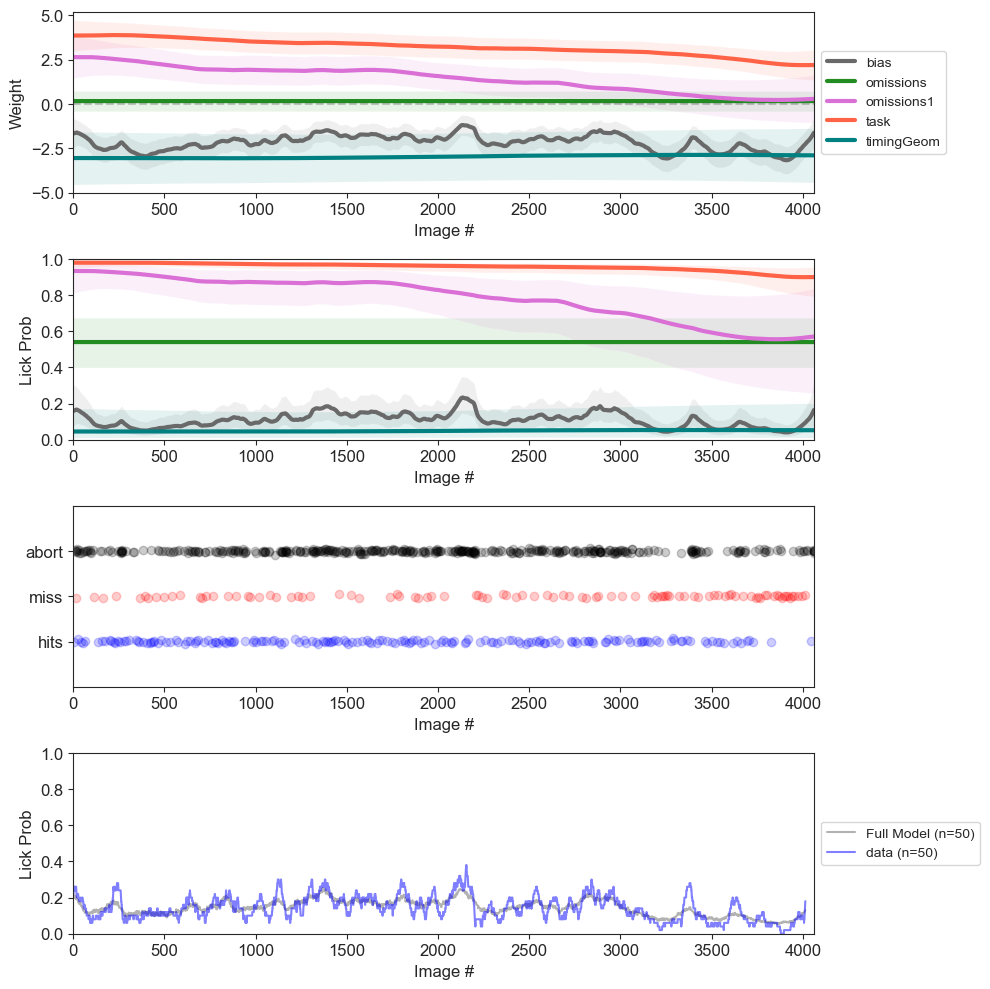

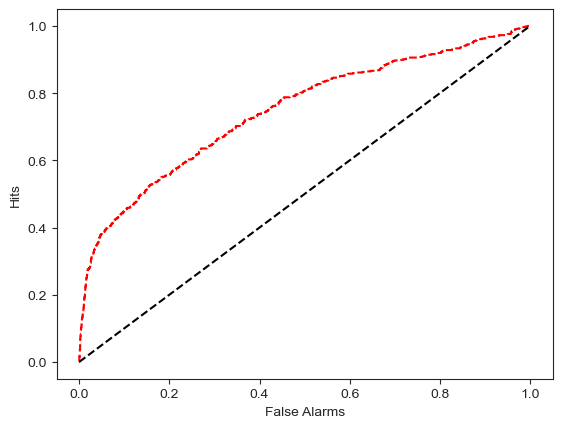

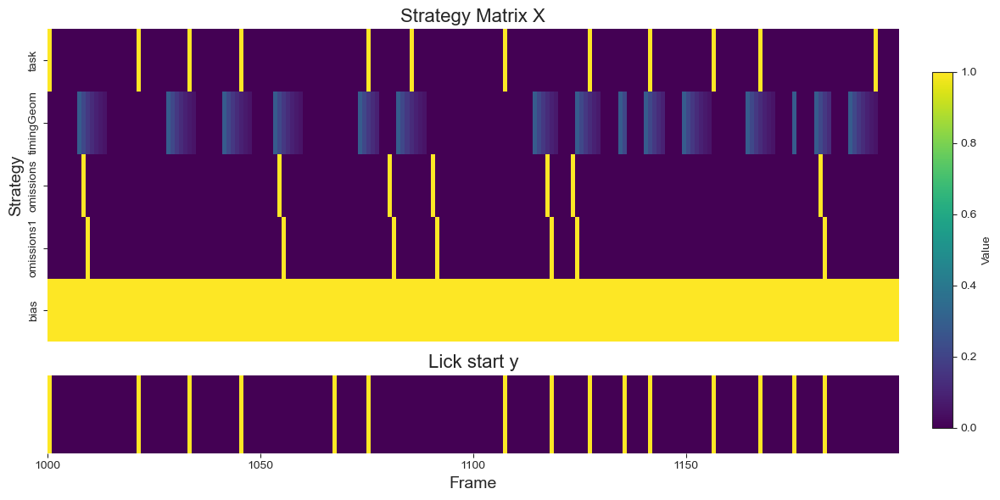

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1056.4189630178298
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 27.81%
Timing Index: 0.49%
Omission Index: 0.31%
Post-Omission Index: 4.91%
Overall Strategy Index: 27.32
Dominant Strategy: Visual

 Processing 1055260435


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


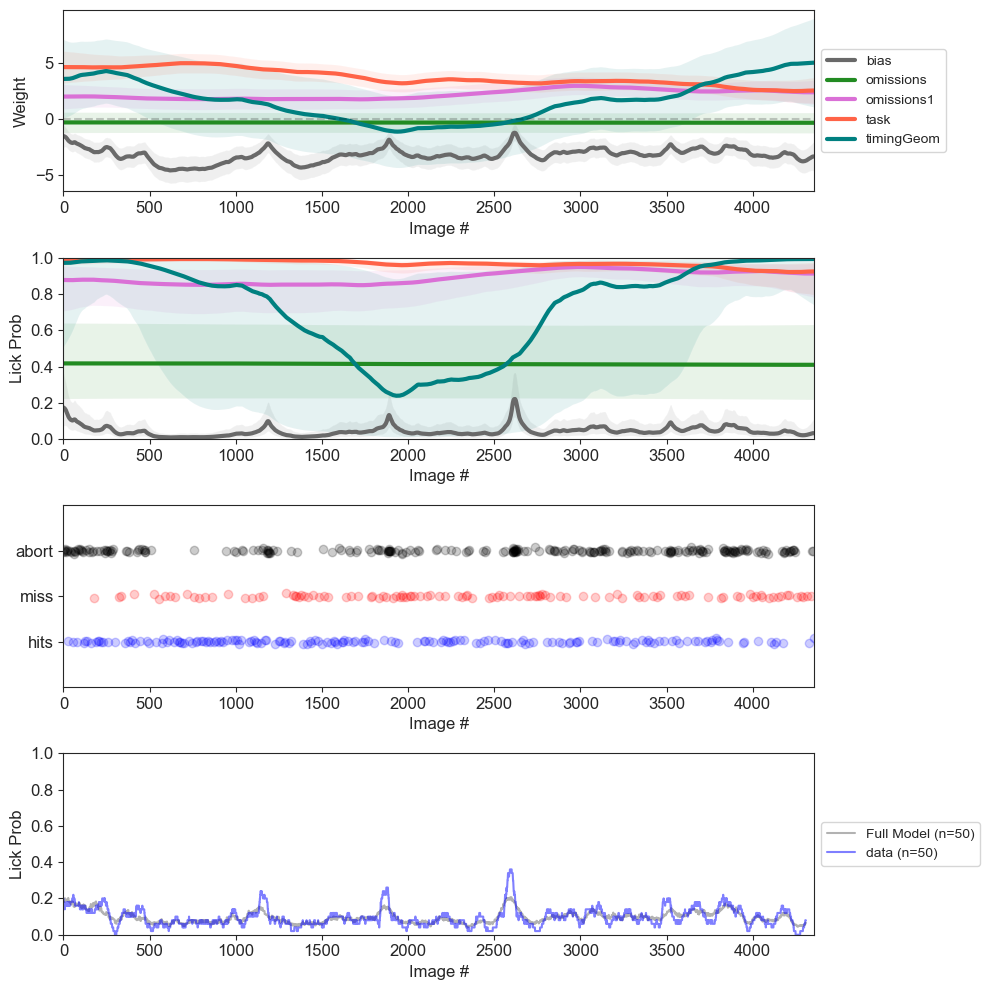

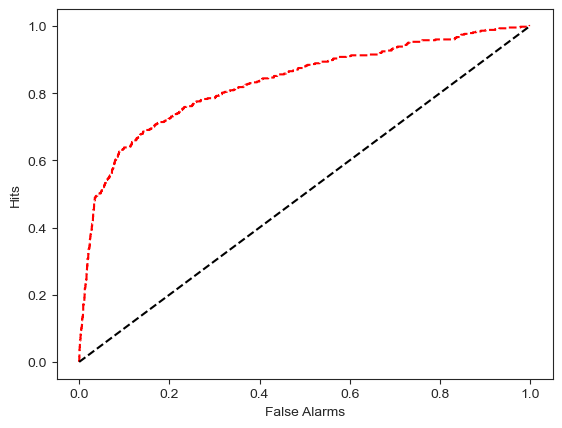

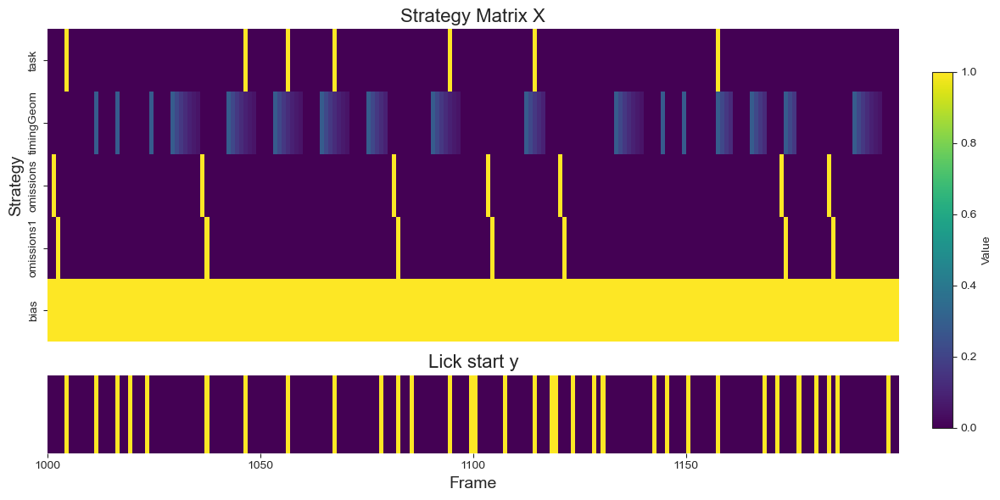

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1546.1124523796461
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 15.68%
Timing Index: 1.54%
Omission Index: 0.14%
Post-Omission Index: 3.19%
Overall Strategy Index: 14.14
Dominant Strategy: Visual

 Processing 1055434752


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


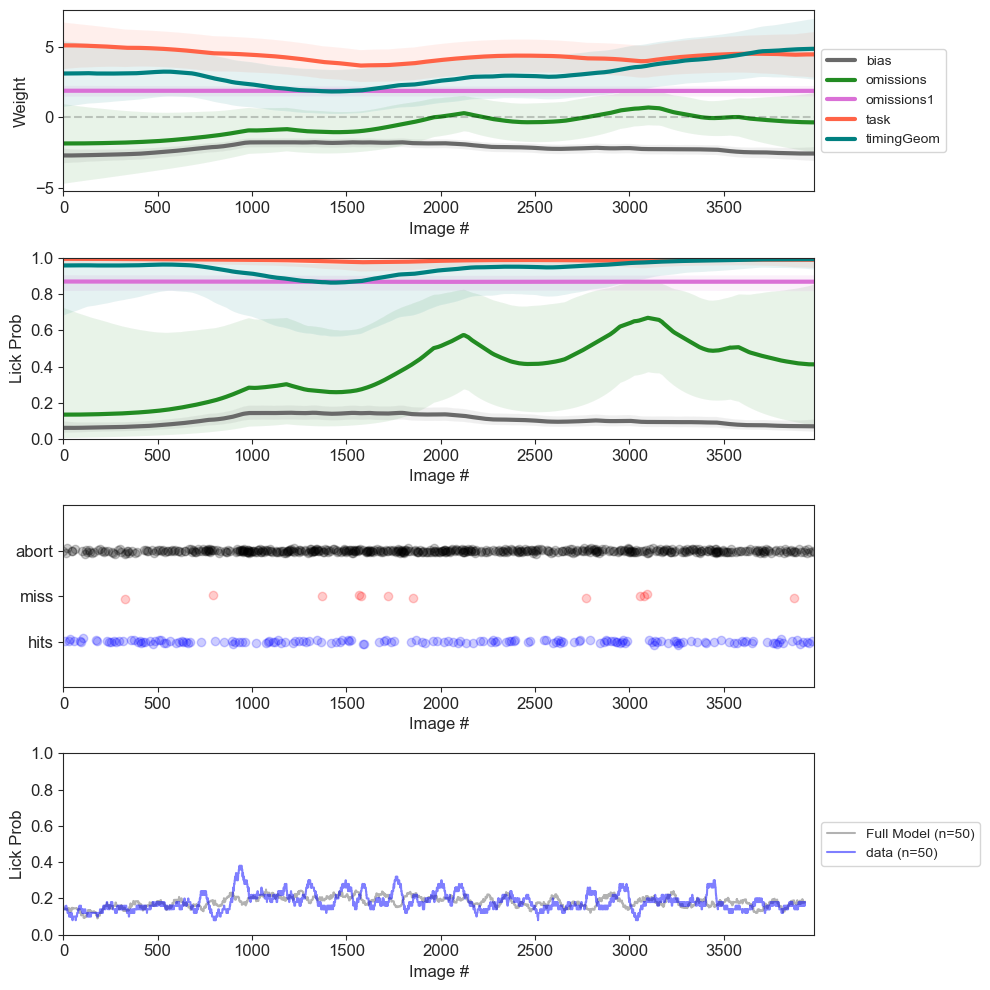

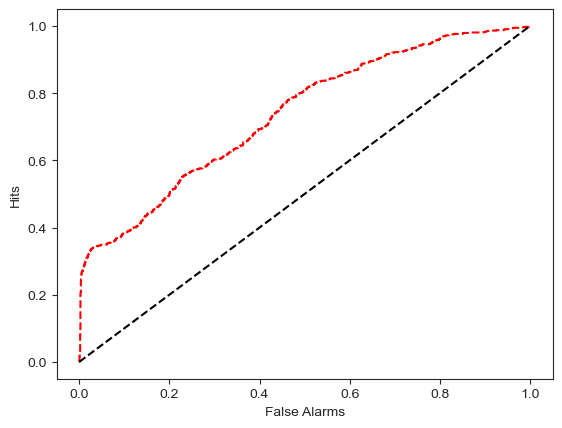

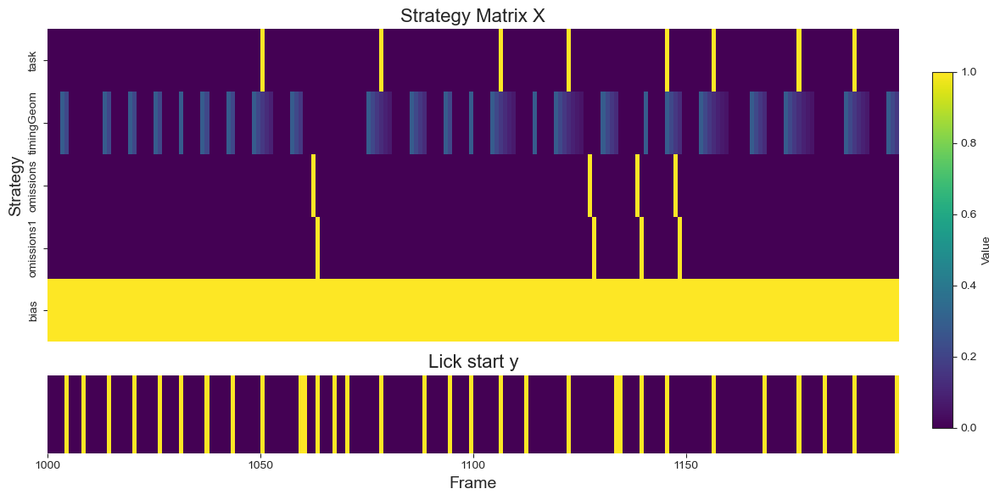

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1499.3677293097862
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 17.49%
Timing Index: 2.21%
Omission Index: 0.07%
Post-Omission Index: 3.32%
Overall Strategy Index: 15.28
Dominant Strategy: Visual

 Processing 1062781531


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


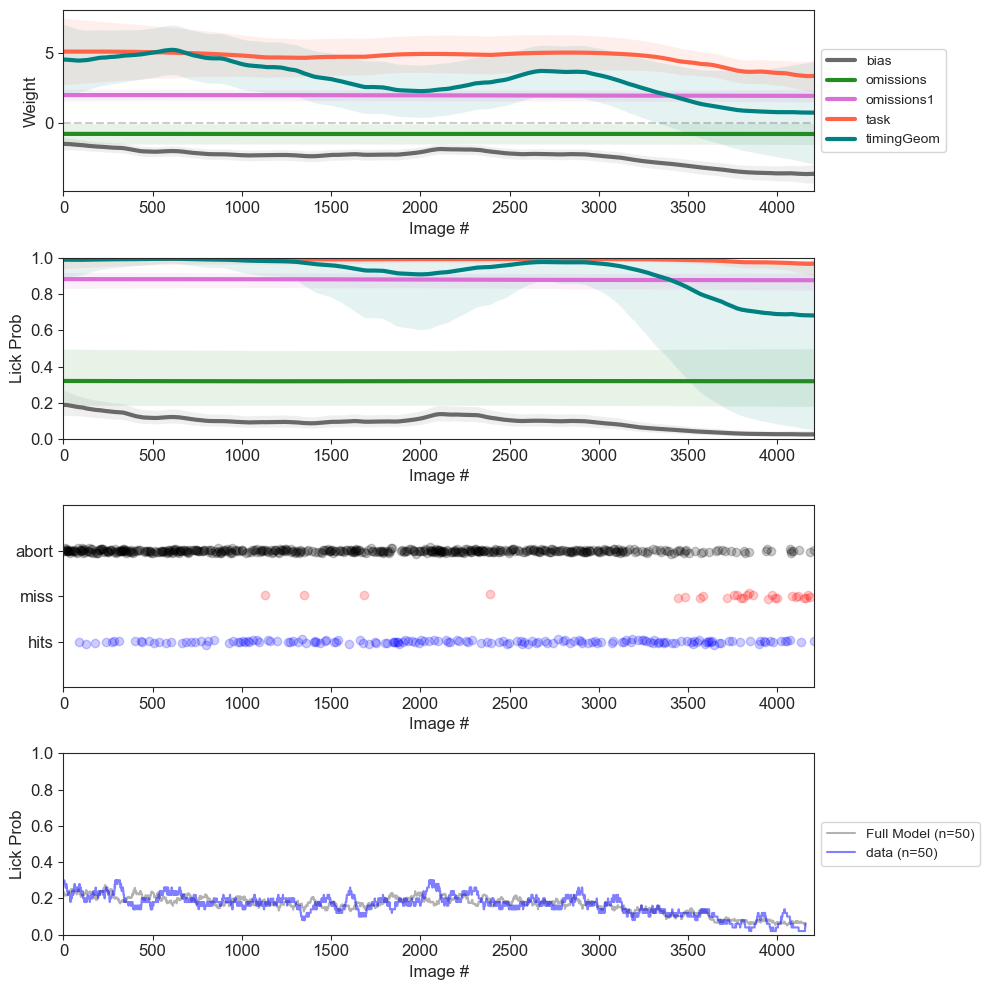

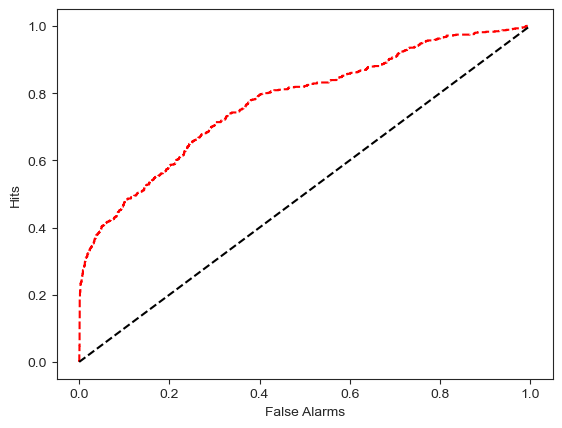

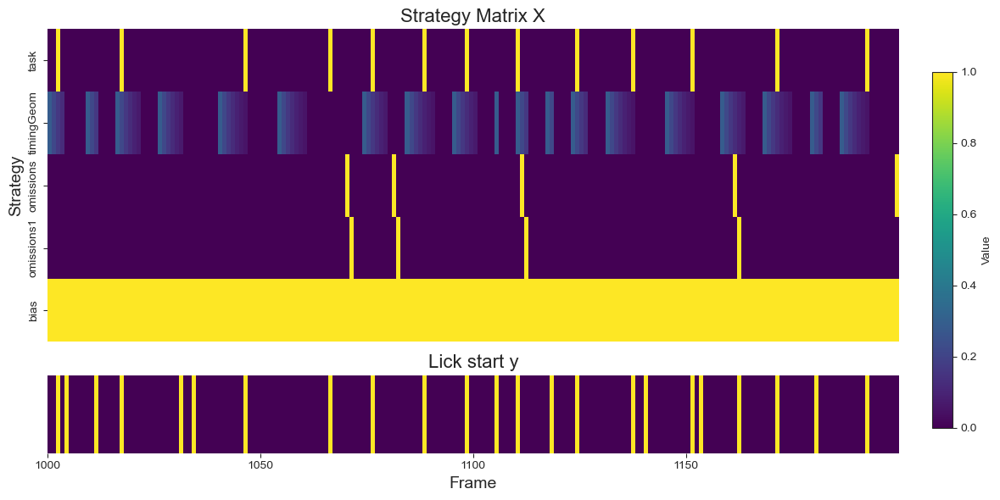

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1079.8235131403198
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 37.40%
Timing Index: 0.12%
Omission Index: 0.35%
Post-Omission Index: 3.06%
Overall Strategy Index: 37.29
Dominant Strategy: Visual

 Processing 1063068136


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


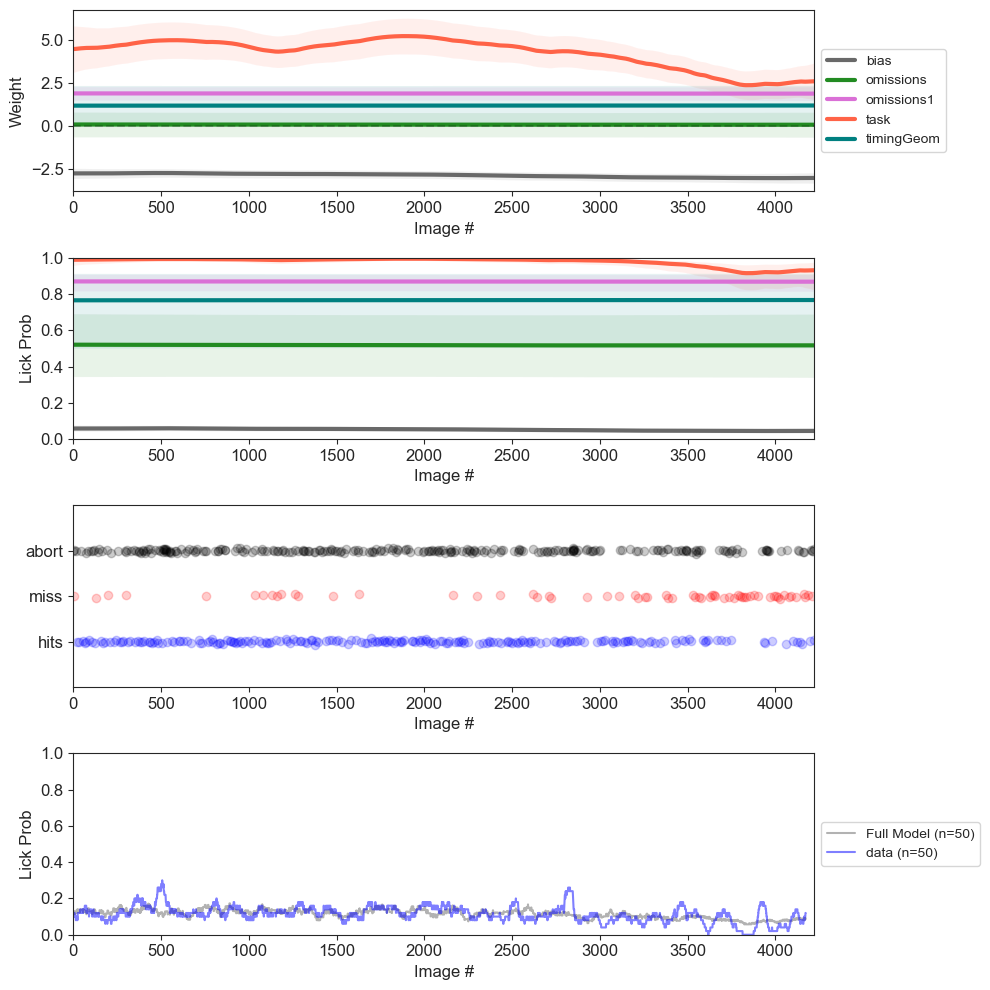

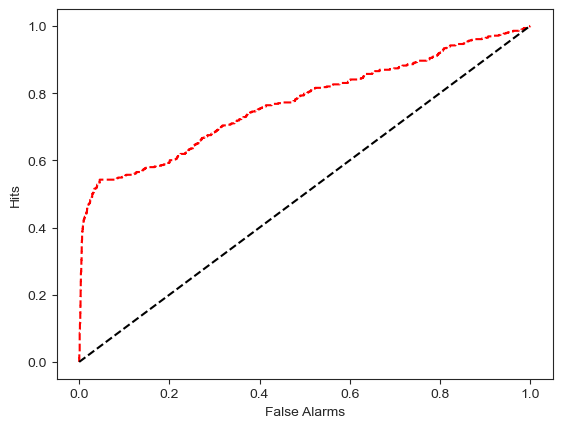

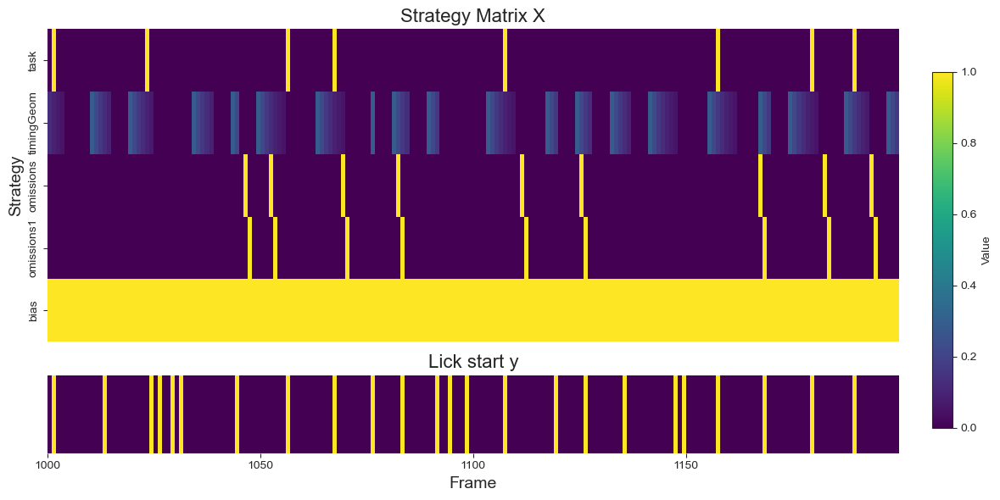

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1310.214621041494
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 19.18%
Timing Index: 1.29%
Omission Index: 0.14%
Post-Omission Index: 6.79%
Overall Strategy Index: 17.88
Dominant Strategy: Visual

 Processing 1062787784


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


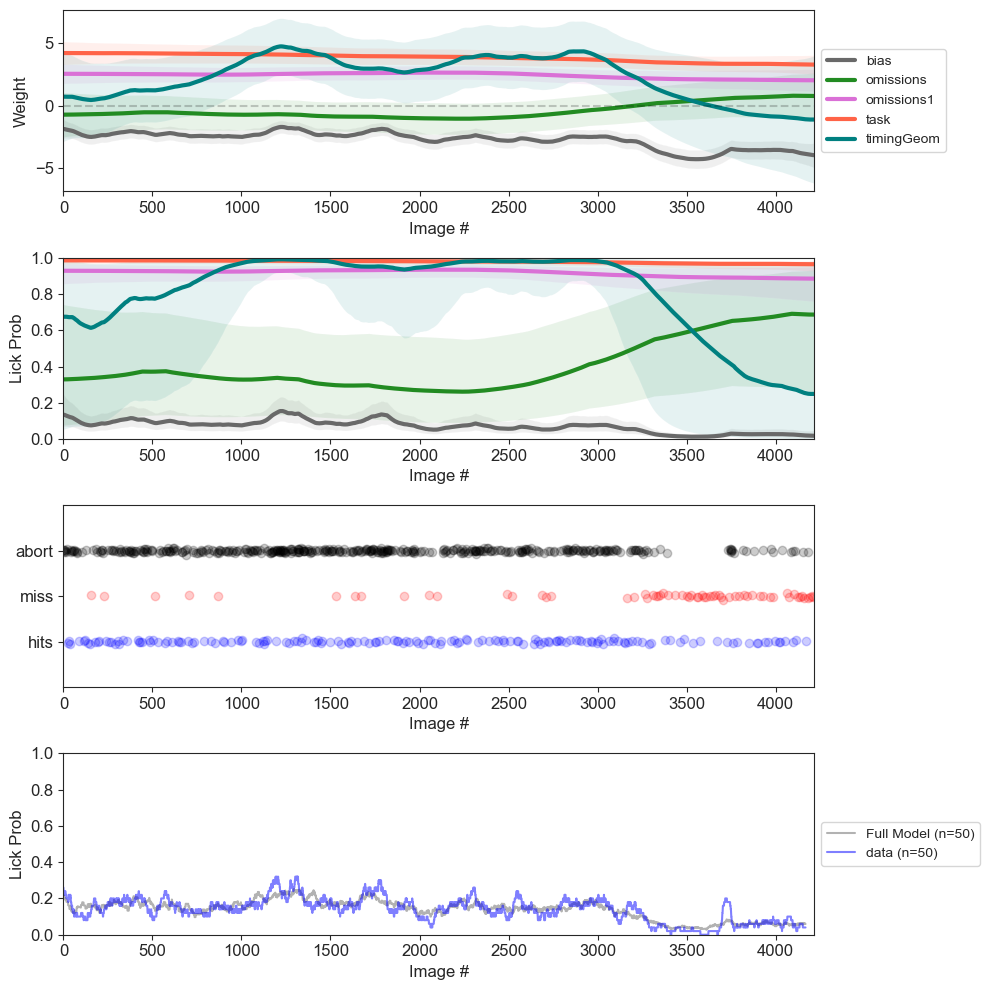

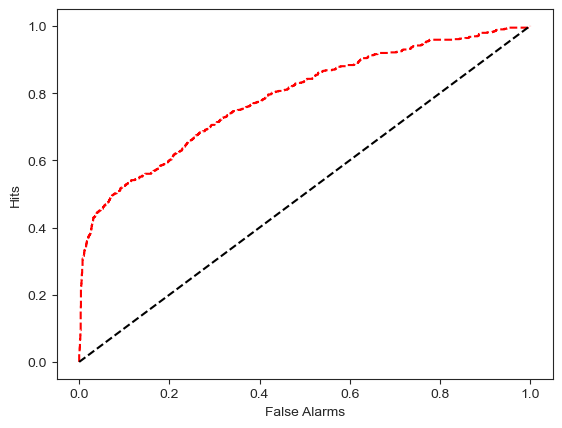

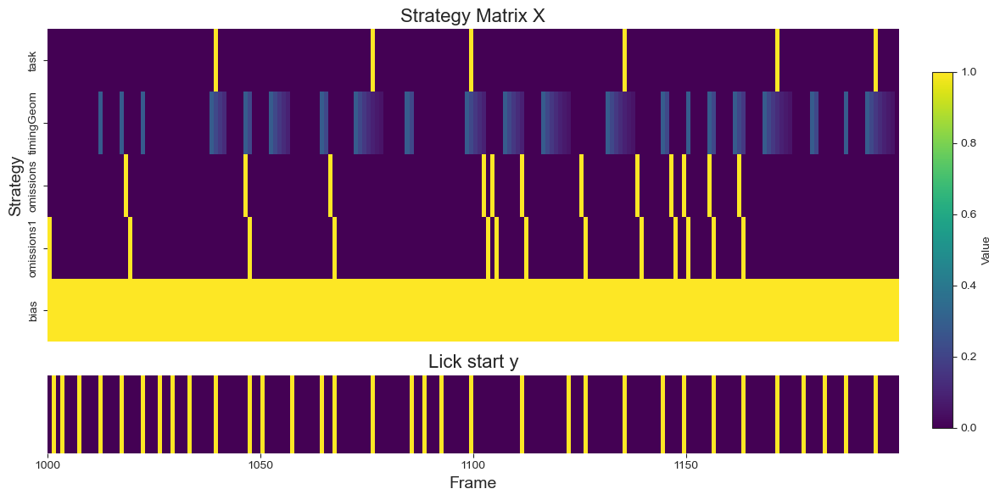

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1603.661783574993
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 13.62%
Timing Index: 2.49%
Omission Index: 0.23%
Post-Omission Index: 1.70%
Overall Strategy Index: 11.13
Dominant Strategy: Visual

 Processing 1063068179


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


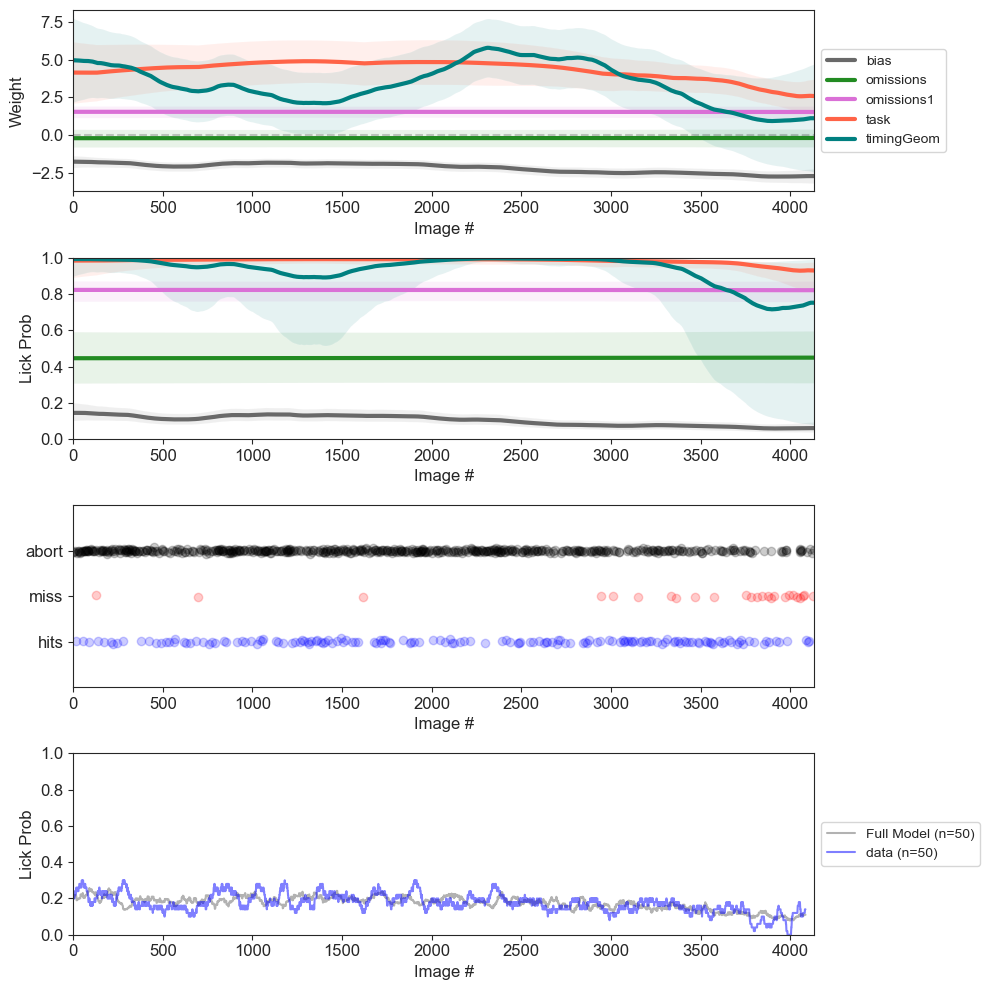

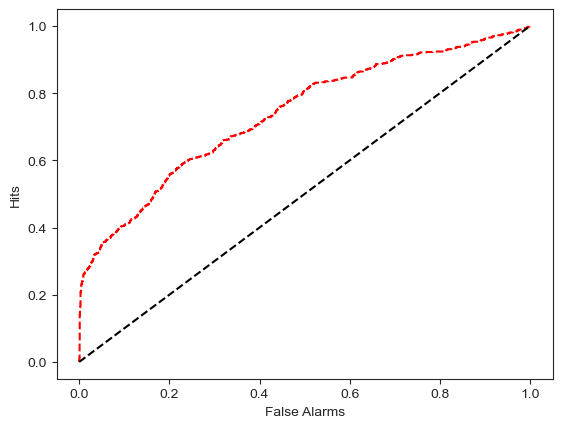

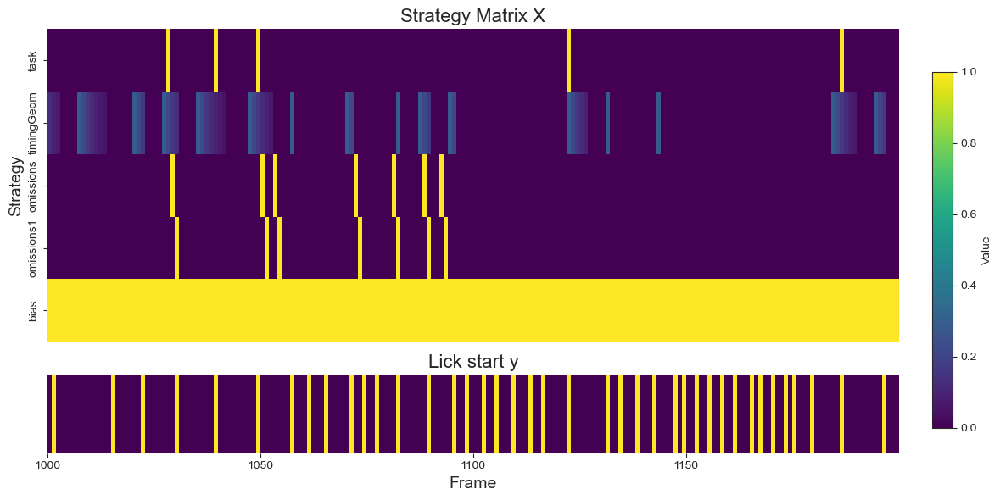

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1936.070215798376
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 5.13%
Timing Index: 7.16%
Omission Index: 0.43%
Post-Omission Index: 3.03%
Overall Strategy Index: -2.03
Dominant Strategy: Timing

 Processing 1067611872


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


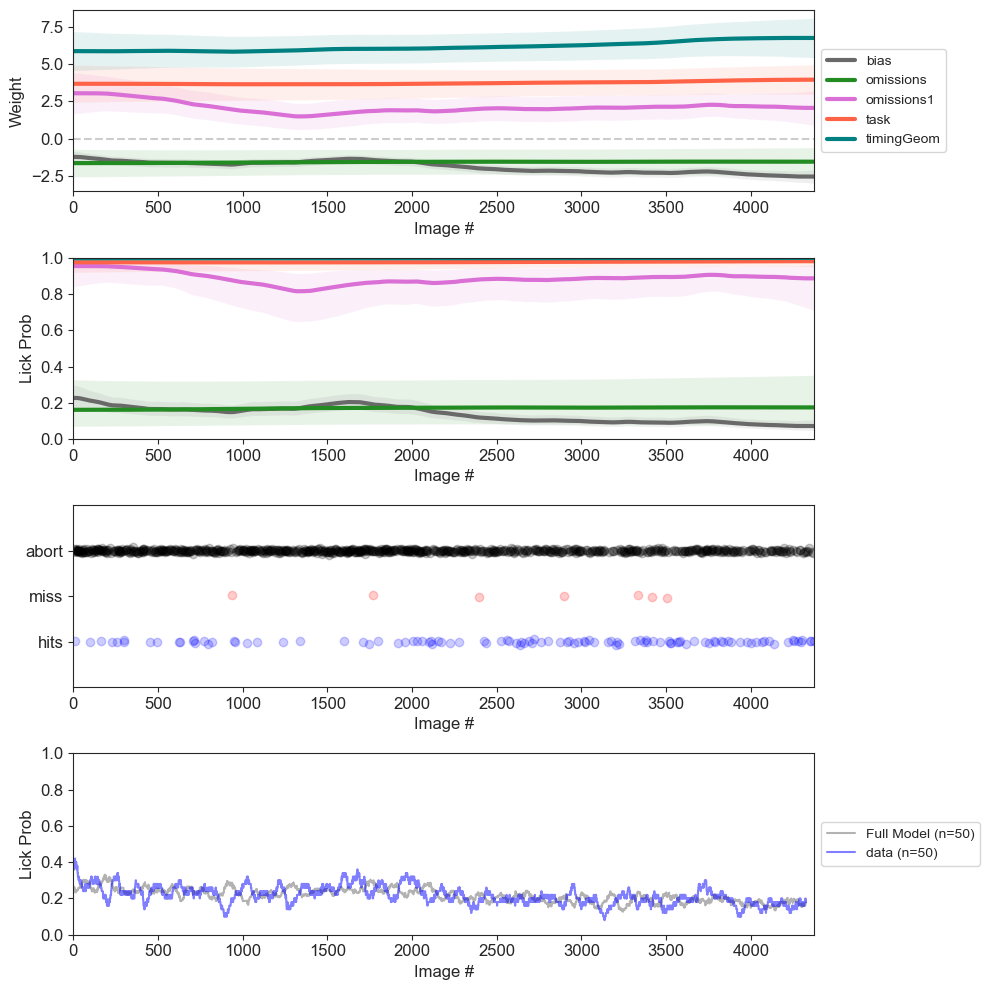

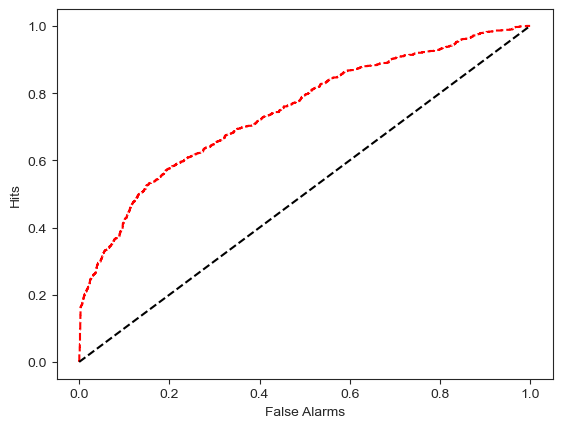

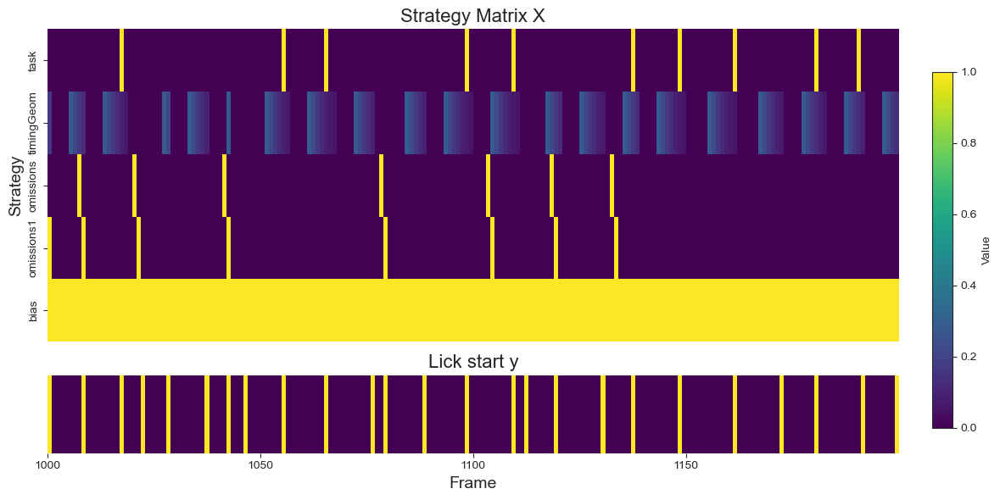

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1203.910581955628
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 31.32%
Timing Index: 0.43%
Omission Index: 0.15%
Post-Omission Index: 4.66%
Overall Strategy Index: 30.89
Dominant Strategy: Visual

 Processing 1067817036


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


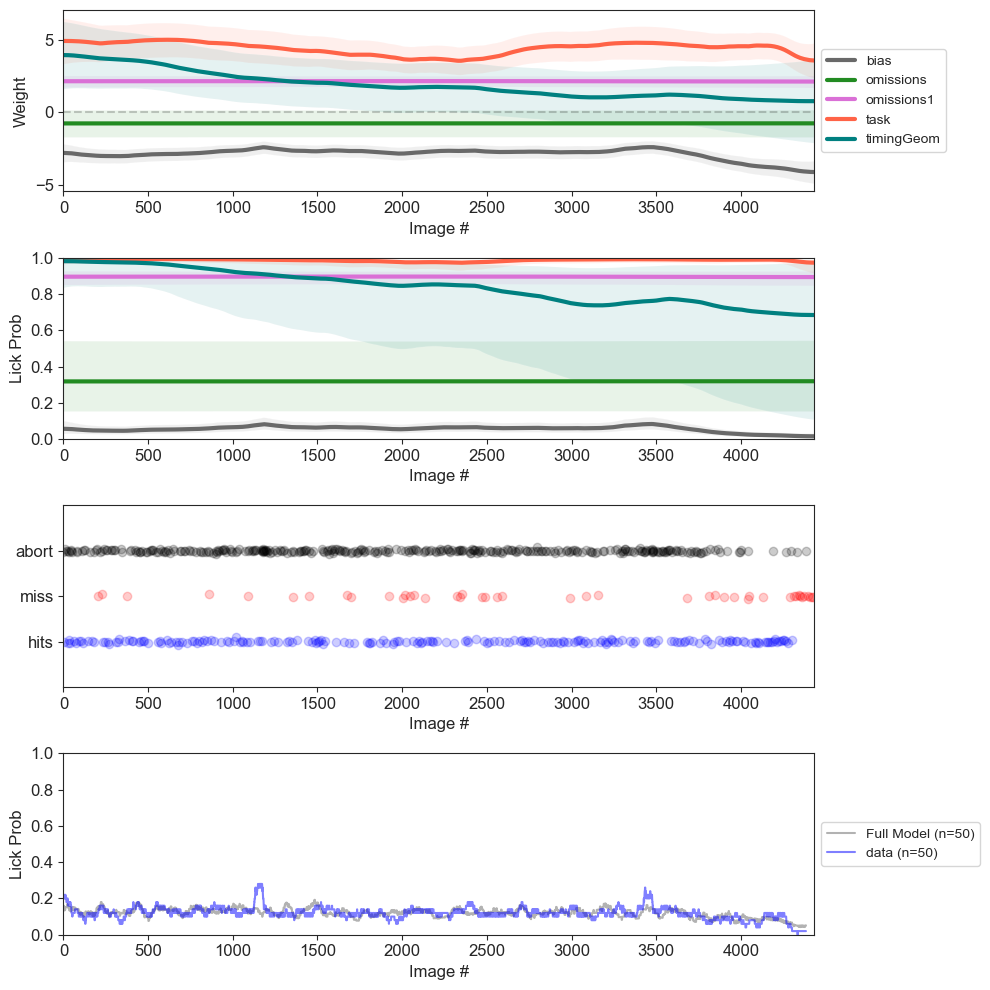

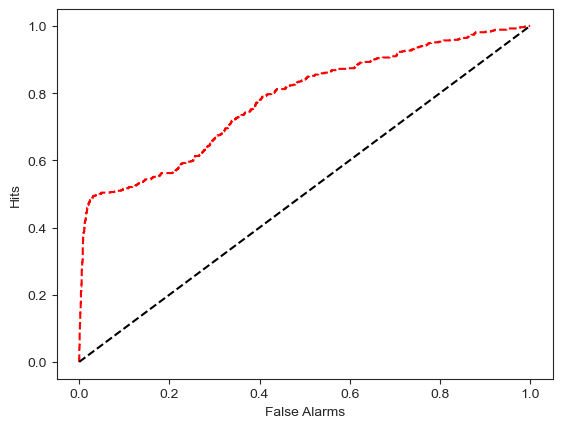

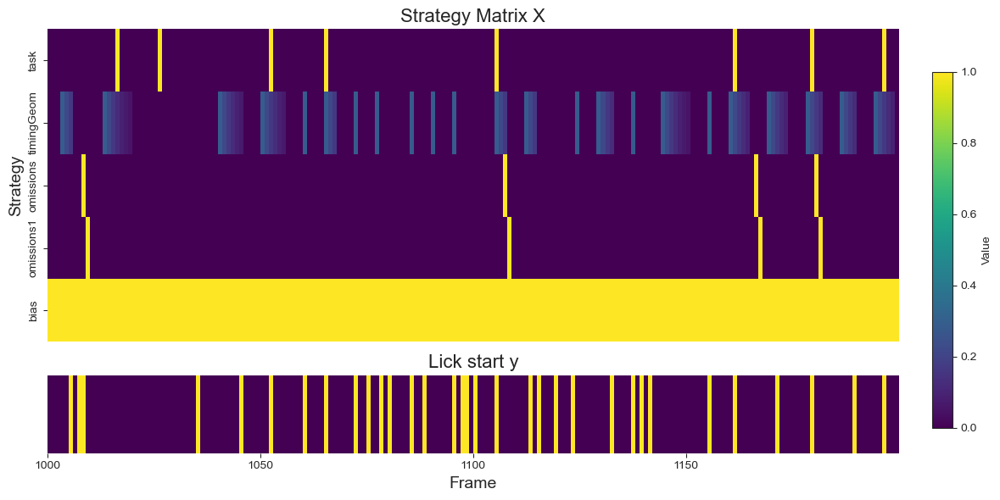

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1420.9638082638703
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 16.24%
Timing Index: 1.64%
Omission Index: 0.26%
Post-Omission Index: 2.54%
Overall Strategy Index: 14.60
Dominant Strategy: Visual

 Processing 1065491938


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


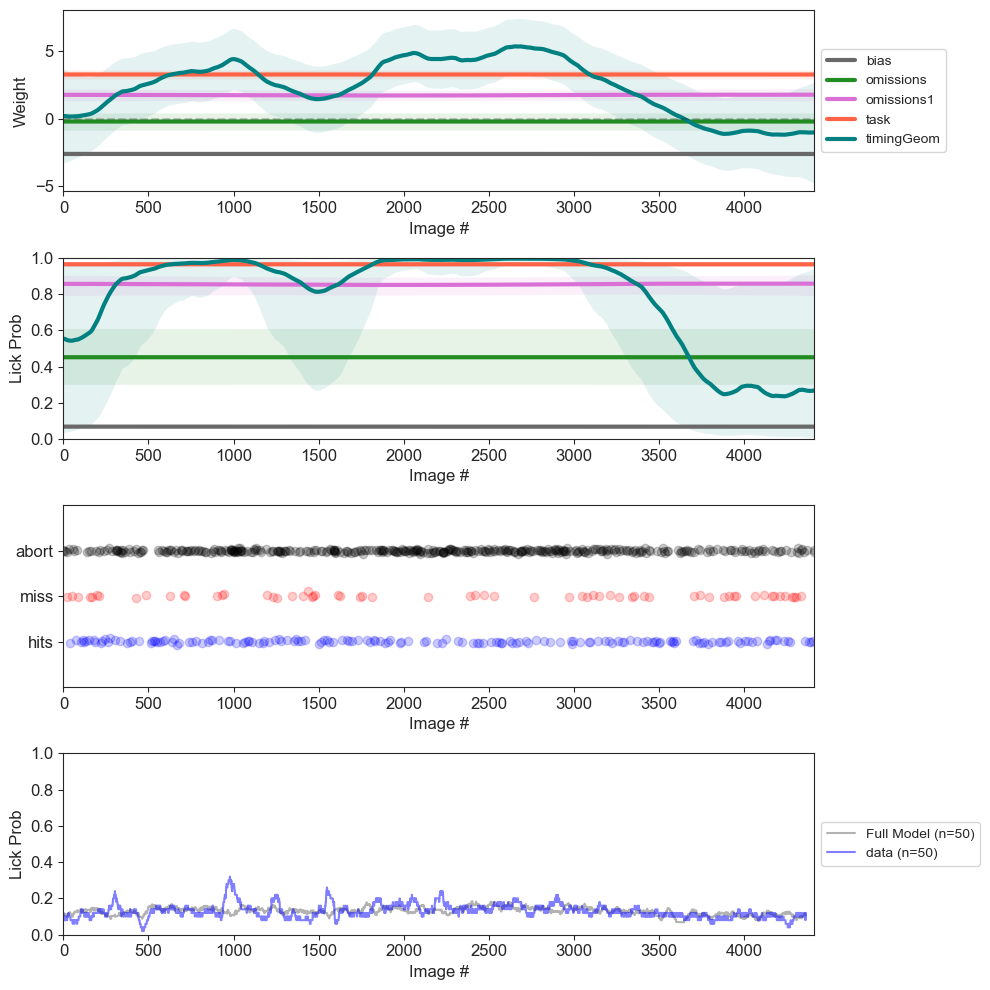

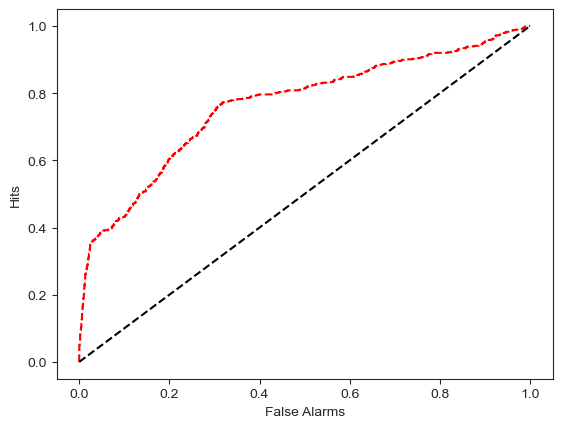

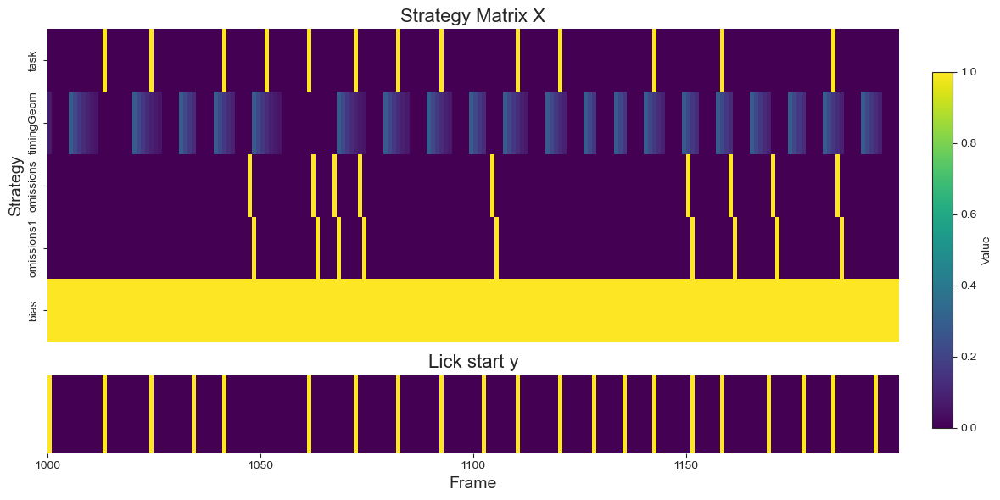

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1487.969640214389
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 18.49%
Timing Index: 5.58%
Omission Index: 0.22%
Post-Omission Index: 3.57%
Overall Strategy Index: 12.92
Dominant Strategy: Visual

 Processing 1065927708


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


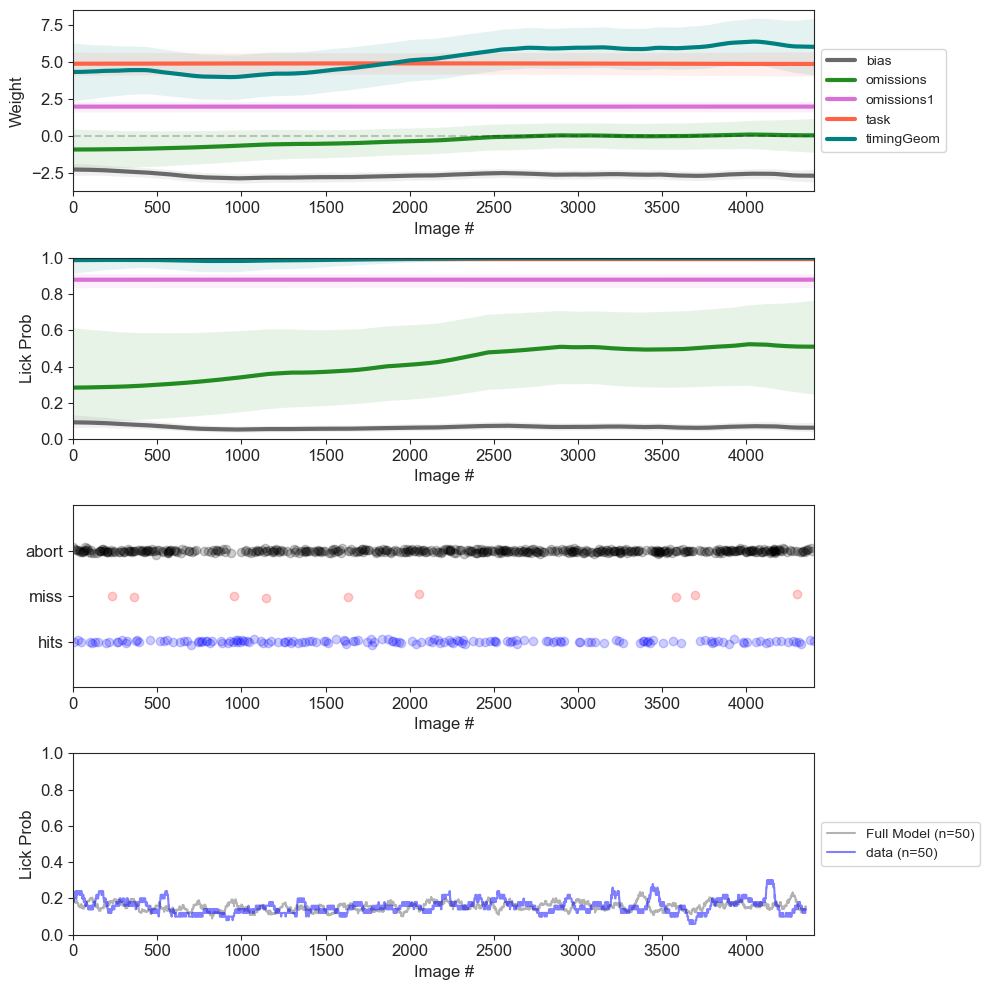

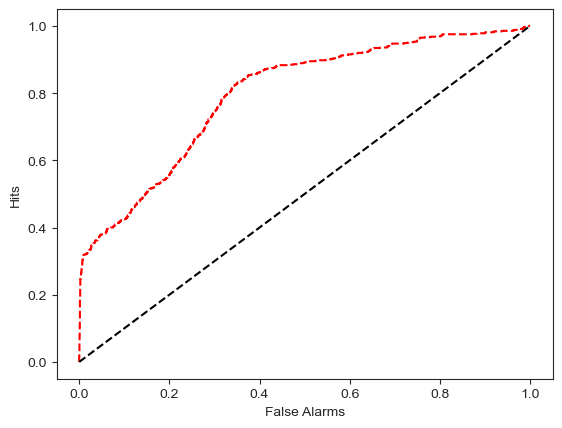

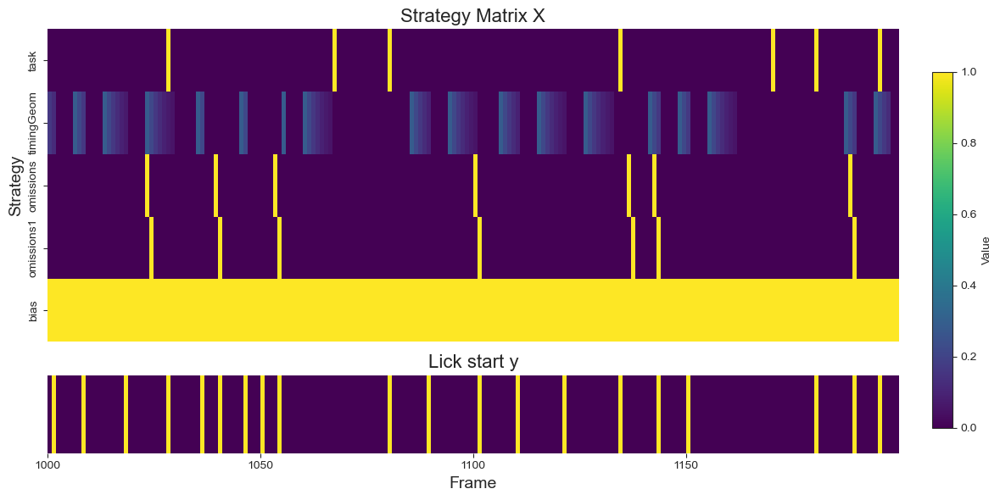

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1344.9106959697092
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 21.19%
Timing Index: 2.47%
Omission Index: 0.47%
Post-Omission Index: 6.19%
Overall Strategy Index: 18.72
Dominant Strategy: Visual

 Processing 1070995428


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


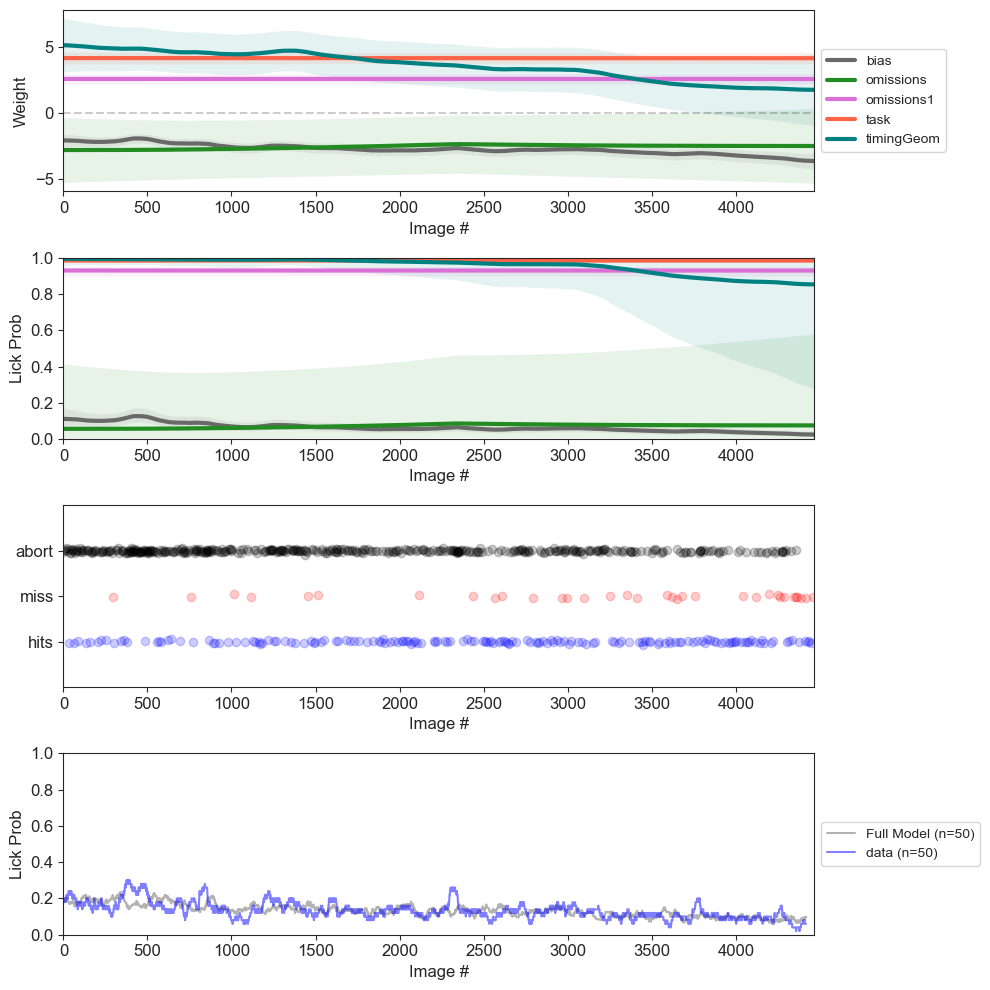

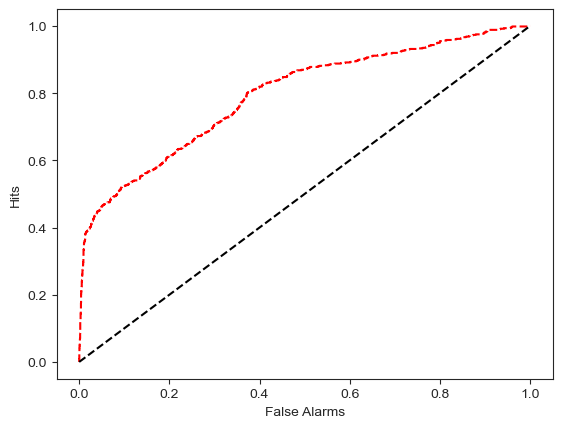

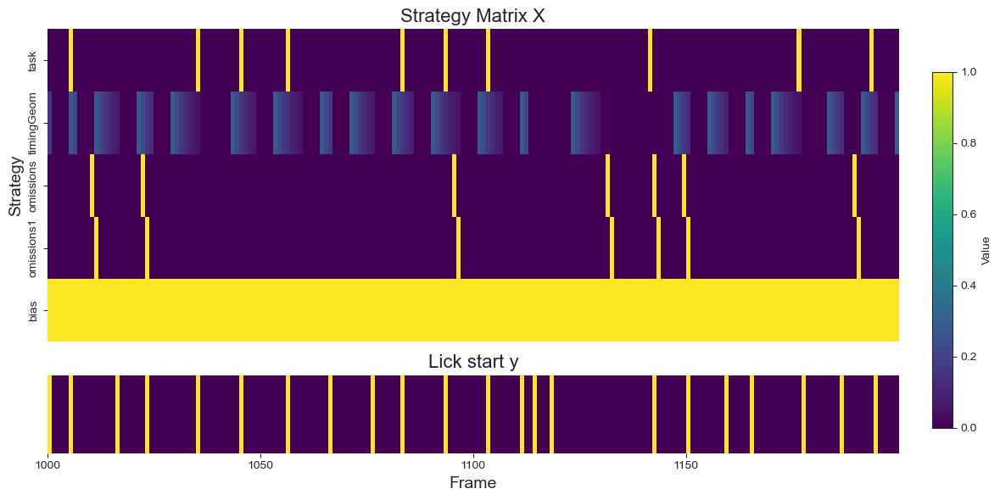

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1593.6131295288942
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 12.17%
Timing Index: 3.49%
Omission Index: 0.20%
Post-Omission Index: 2.27%
Overall Strategy Index: 8.68
Dominant Strategy: Visual

 Processing 1069251052


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


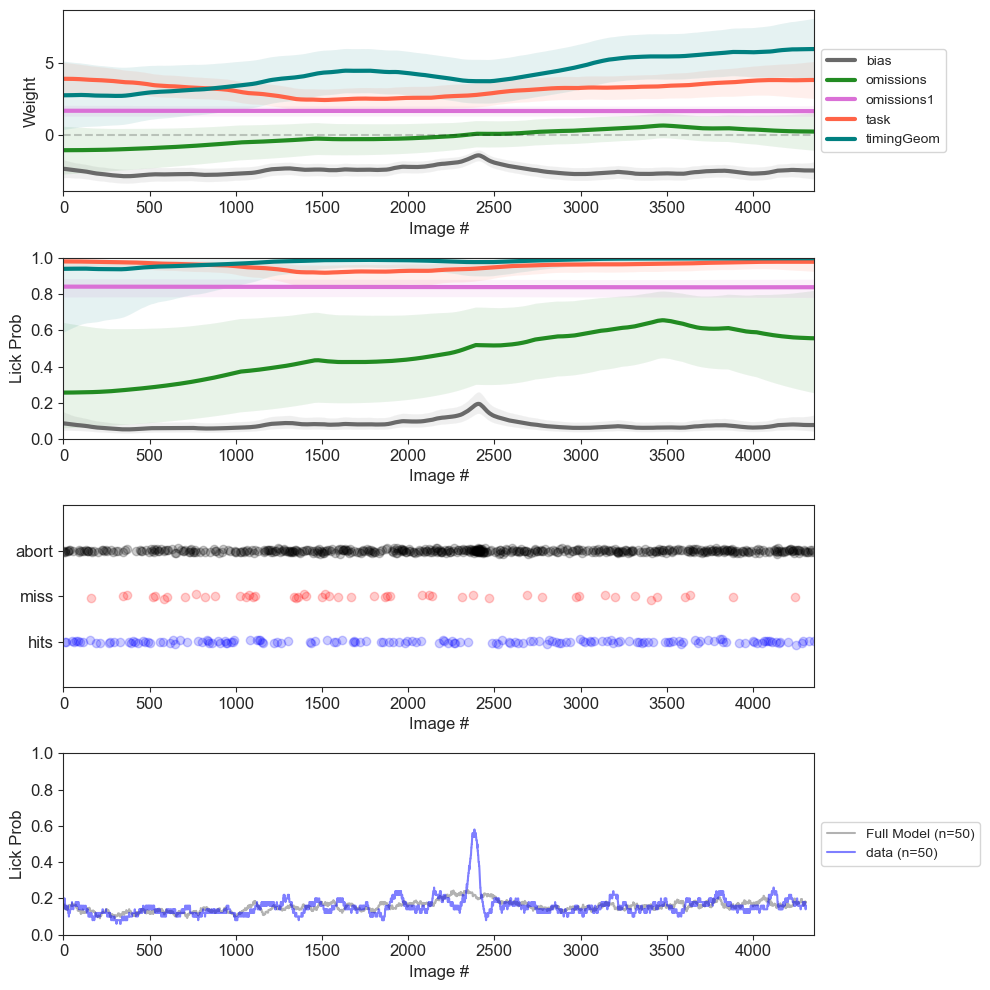

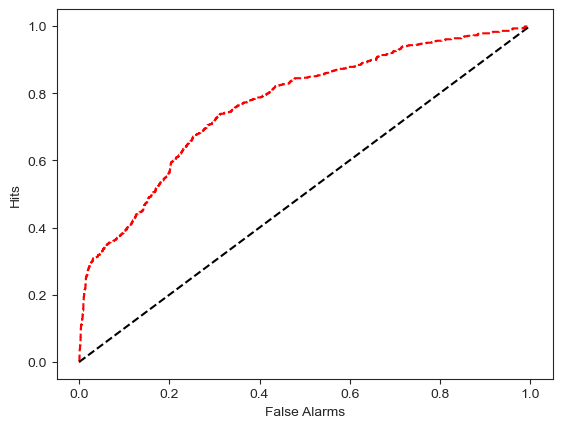

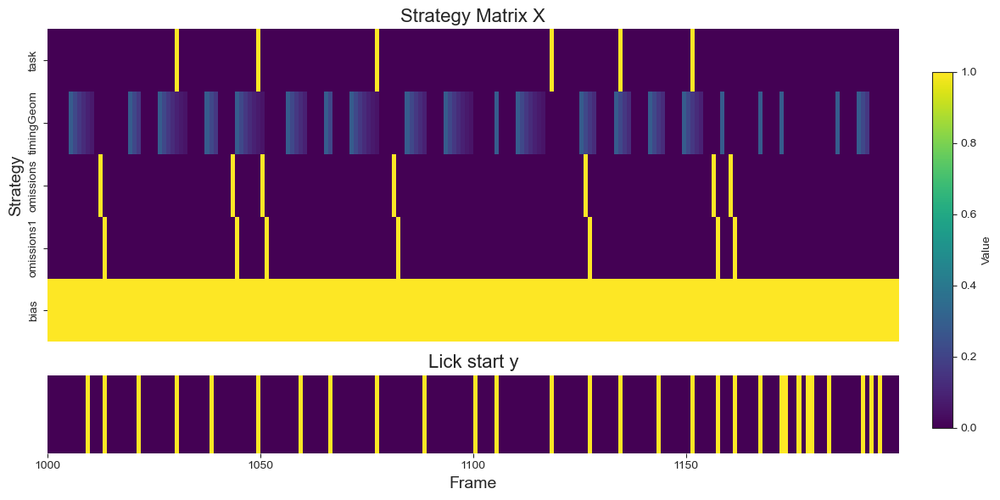

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -930.2665023147274
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 29.72%
Timing Index: 0.75%
Omission Index: 0.27%
Post-Omission Index: 4.49%
Overall Strategy Index: 28.97
Dominant Strategy: Visual

 Processing 1069520080


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


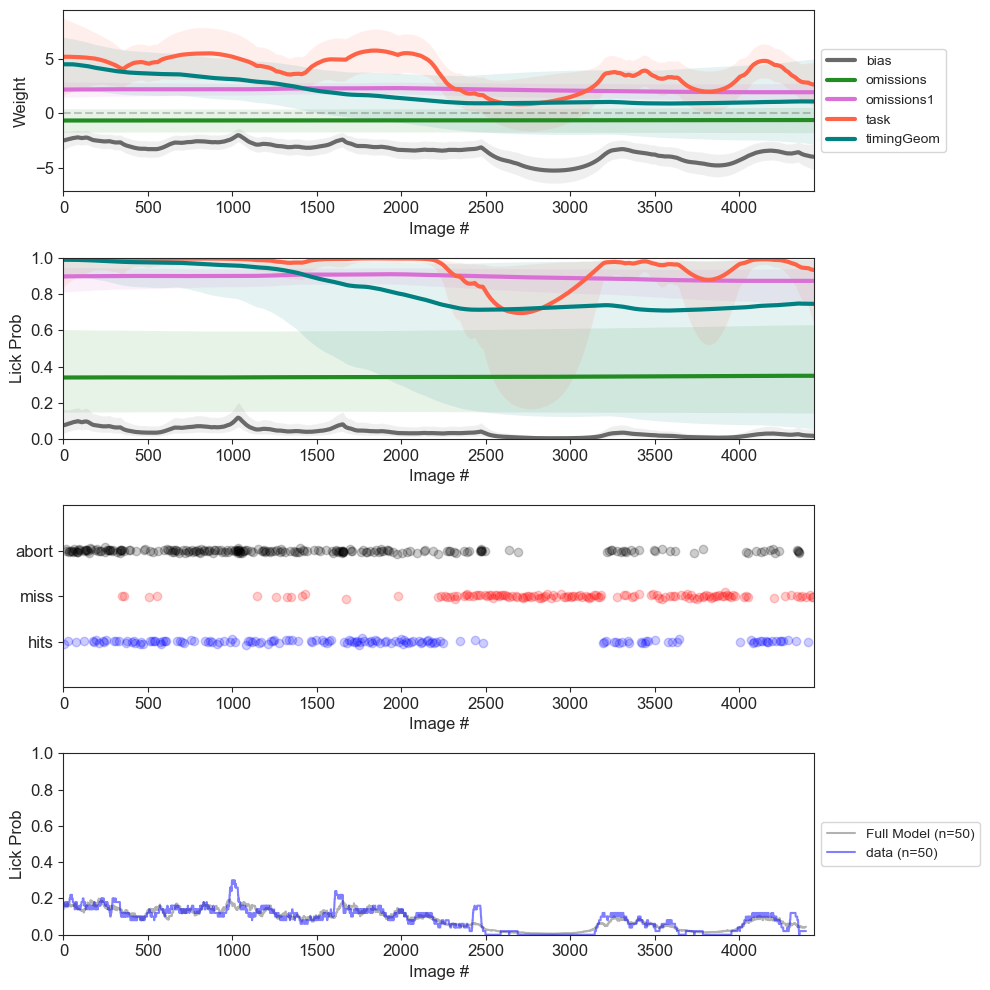

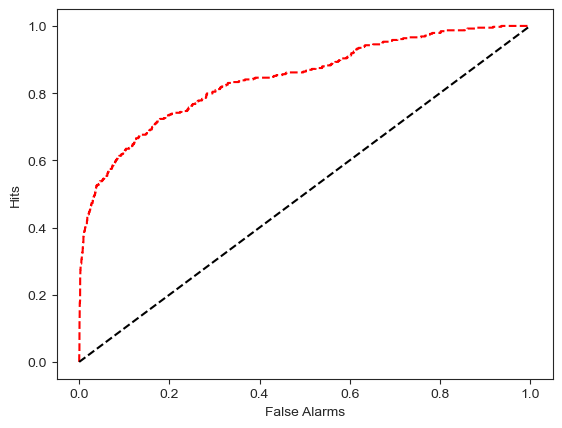

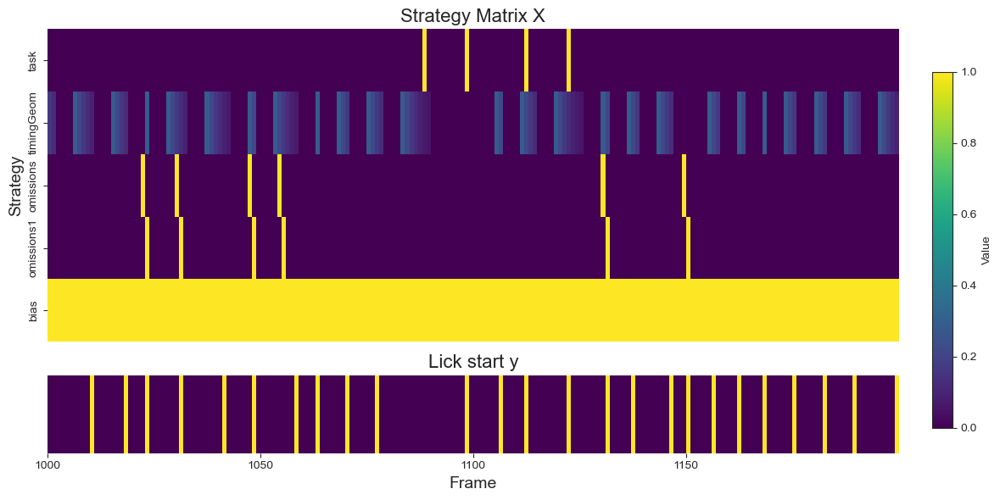

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1269.6467957727873
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 19.90%
Timing Index: 2.54%
Omission Index: 0.04%
Post-Omission Index: 3.89%
Overall Strategy Index: 17.36
Dominant Strategy: Visual

 Processing 1071409007


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


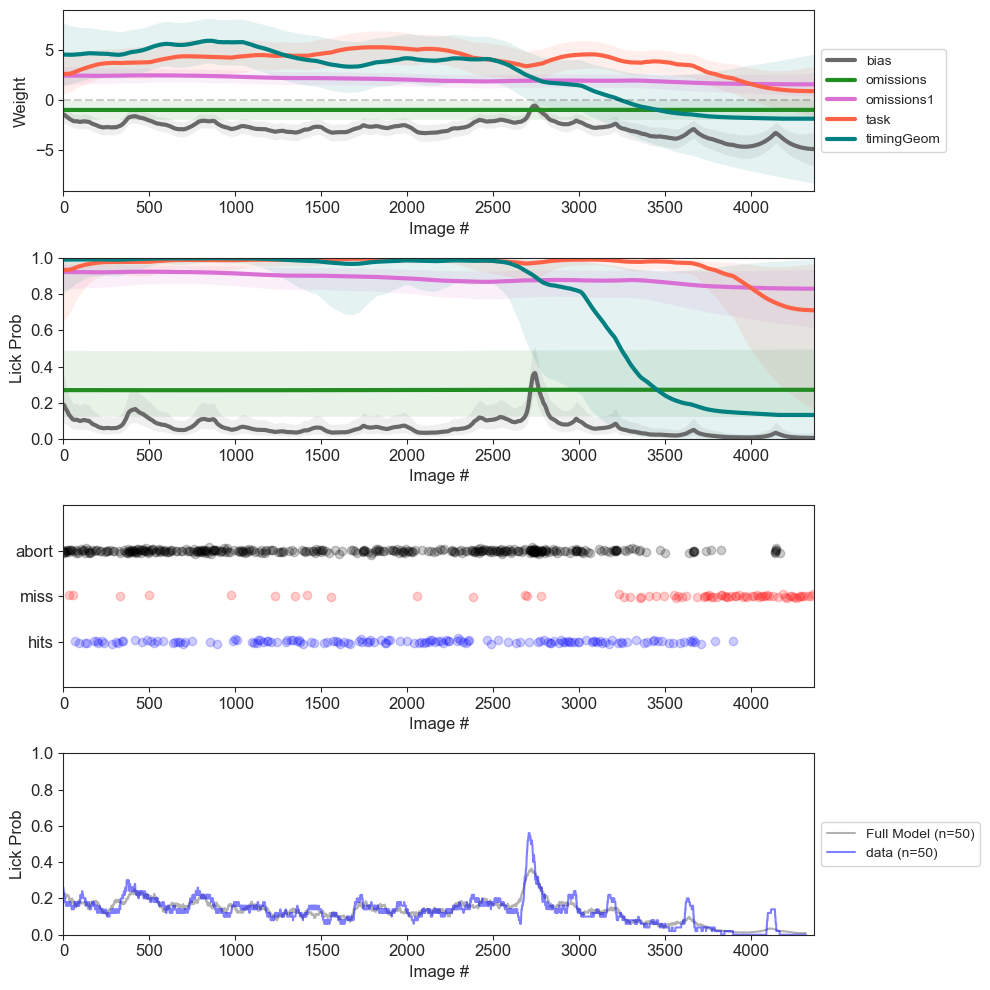

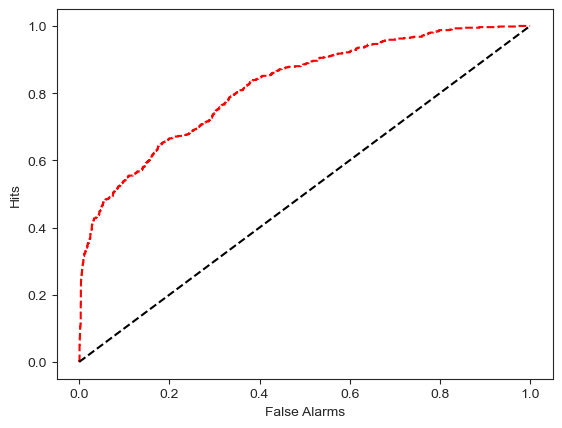

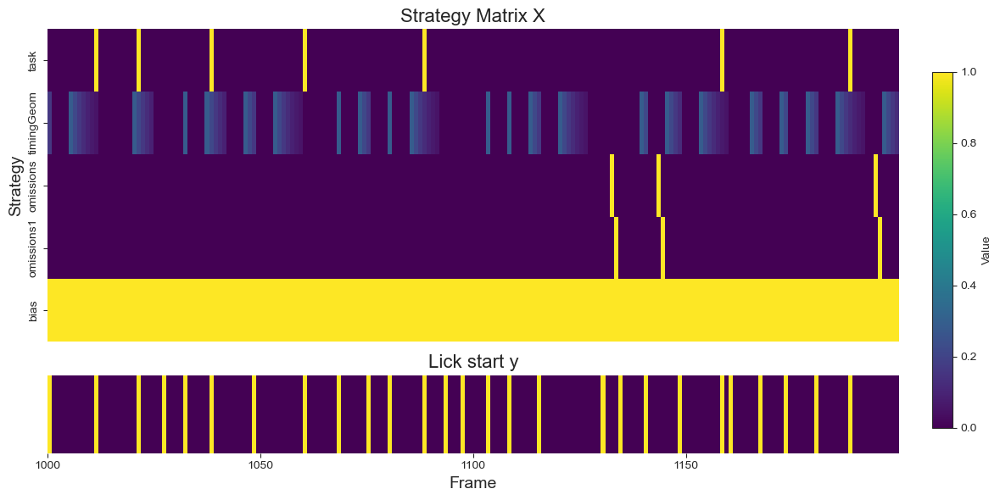

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1427.0376469818875
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 17.73%
Timing Index: 2.83%
Omission Index: 0.41%
Post-Omission Index: 3.09%
Overall Strategy Index: 14.90
Dominant Strategy: Visual

 Processing 1077733165


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


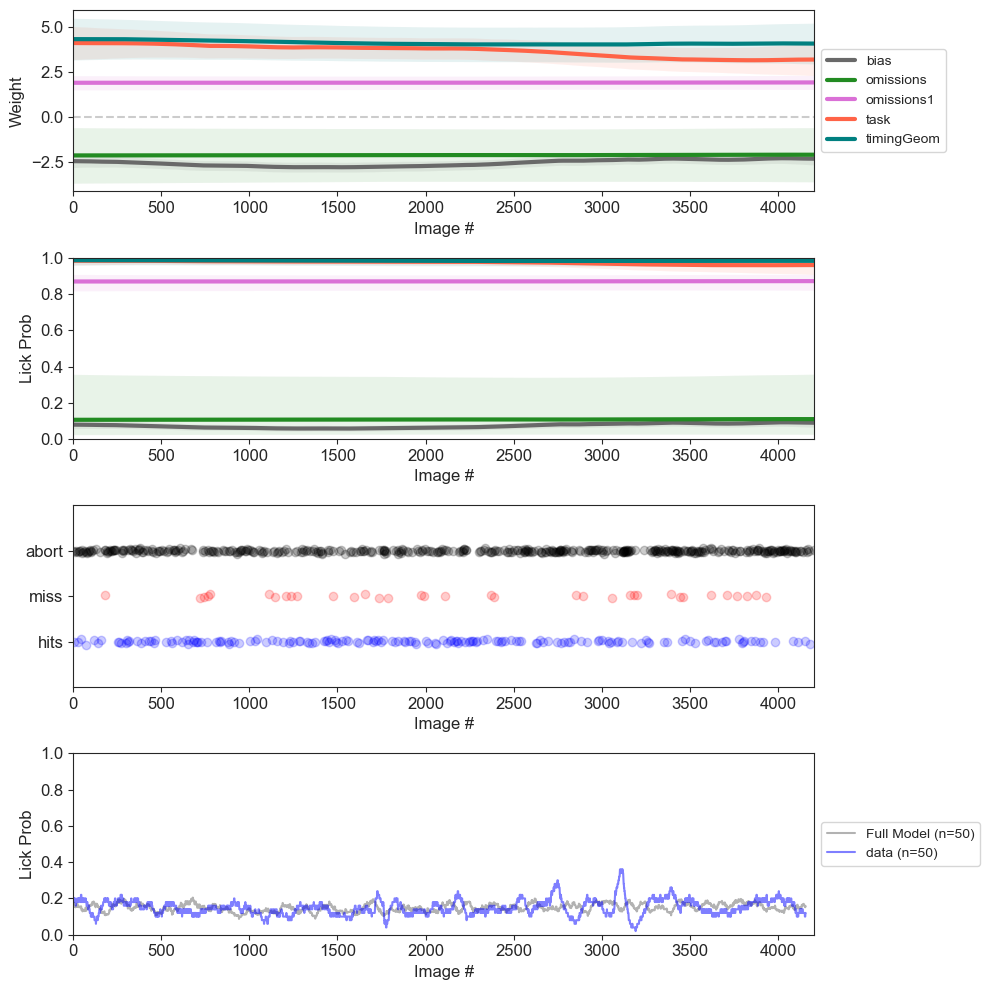

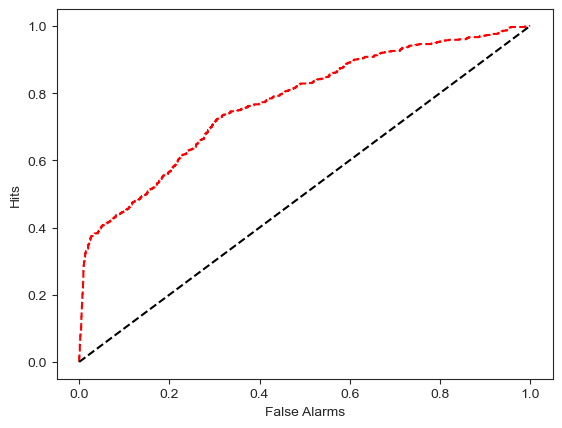

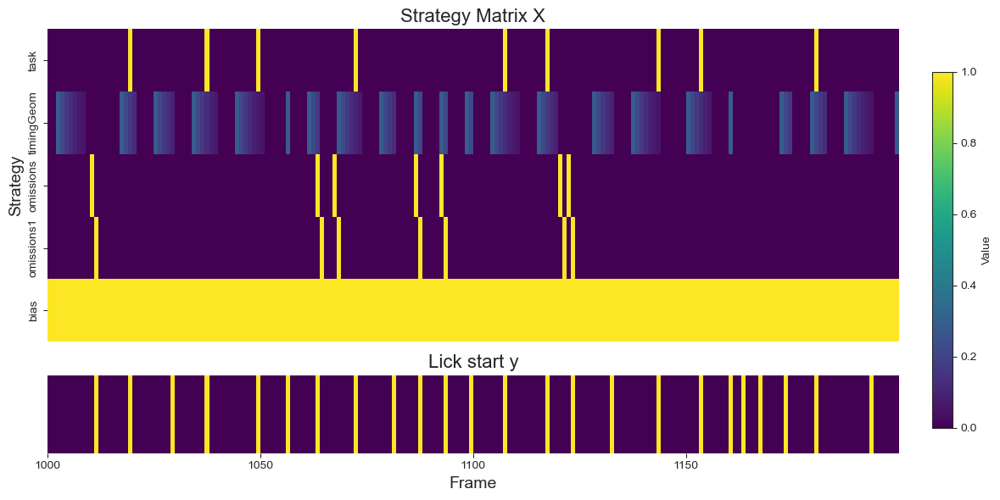

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1196.843273684688
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 30.15%
Timing Index: 2.70%
Omission Index: 0.03%
Post-Omission Index: 6.33%
Overall Strategy Index: 27.45
Dominant Strategy: Visual

 Processing 1081118392


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


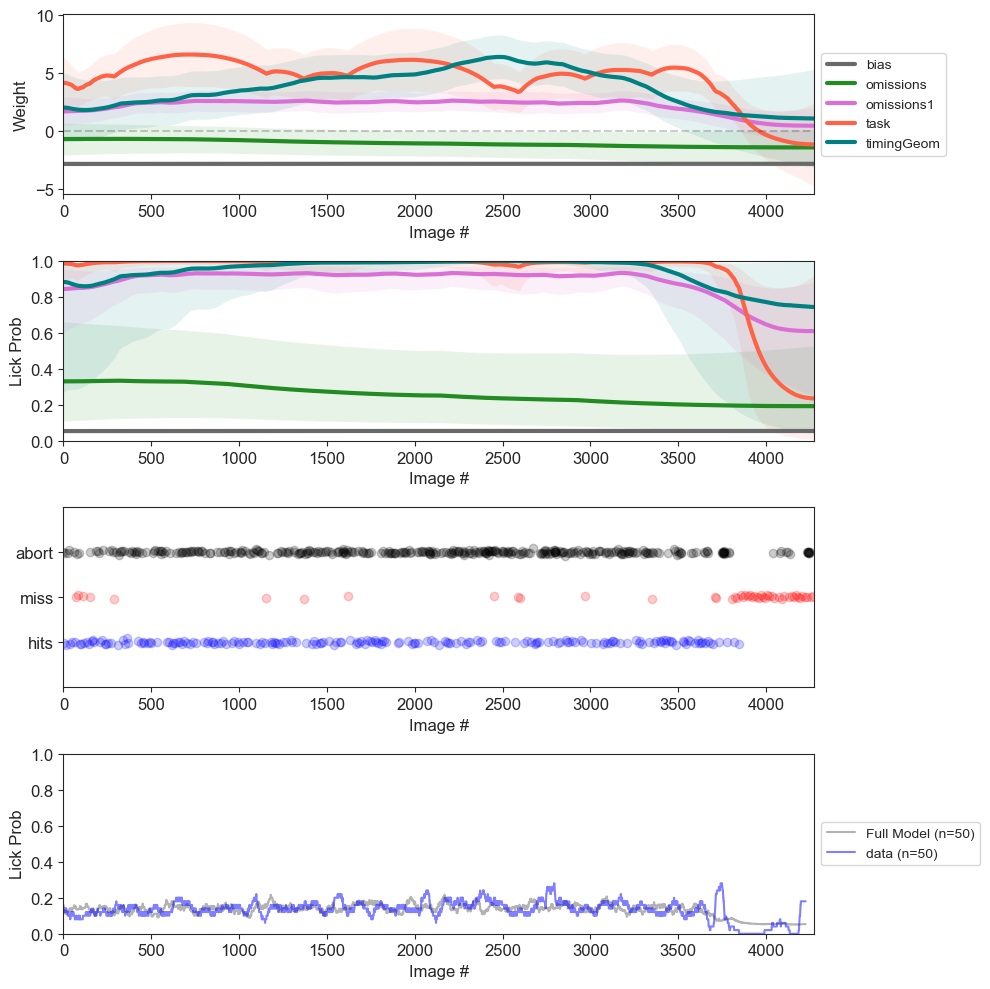

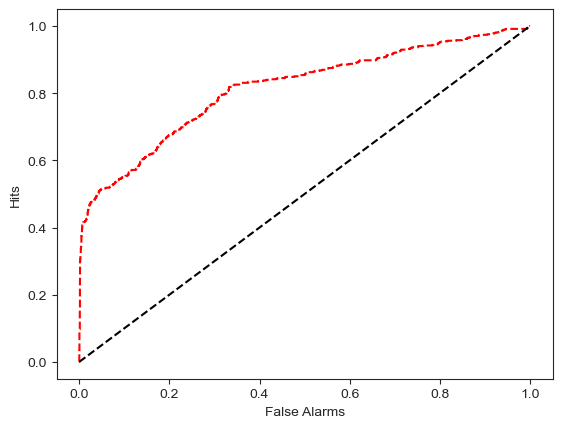

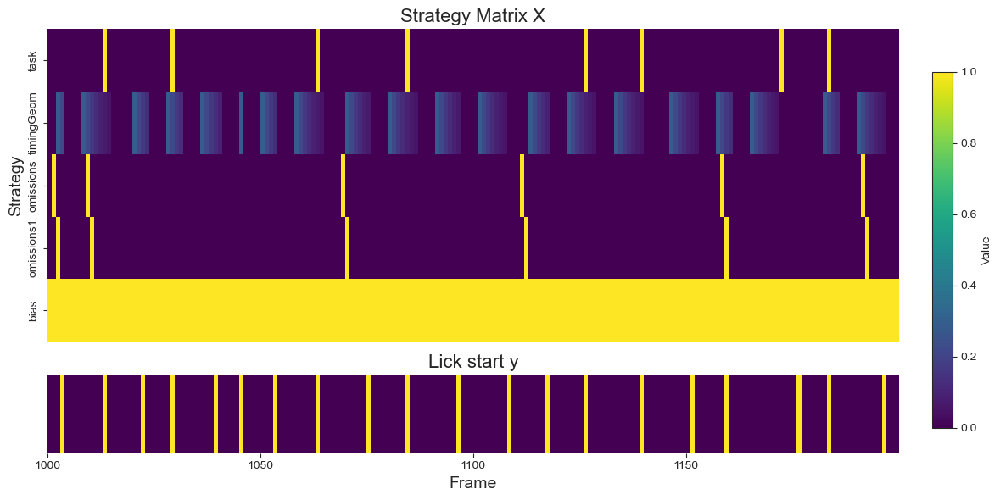

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1197.7736958048918
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 15.01%
Timing Index: 1.25%
Omission Index: 0.19%
Post-Omission Index: 1.28%
Overall Strategy Index: 13.76
Dominant Strategy: Visual

 Processing 1081474898


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


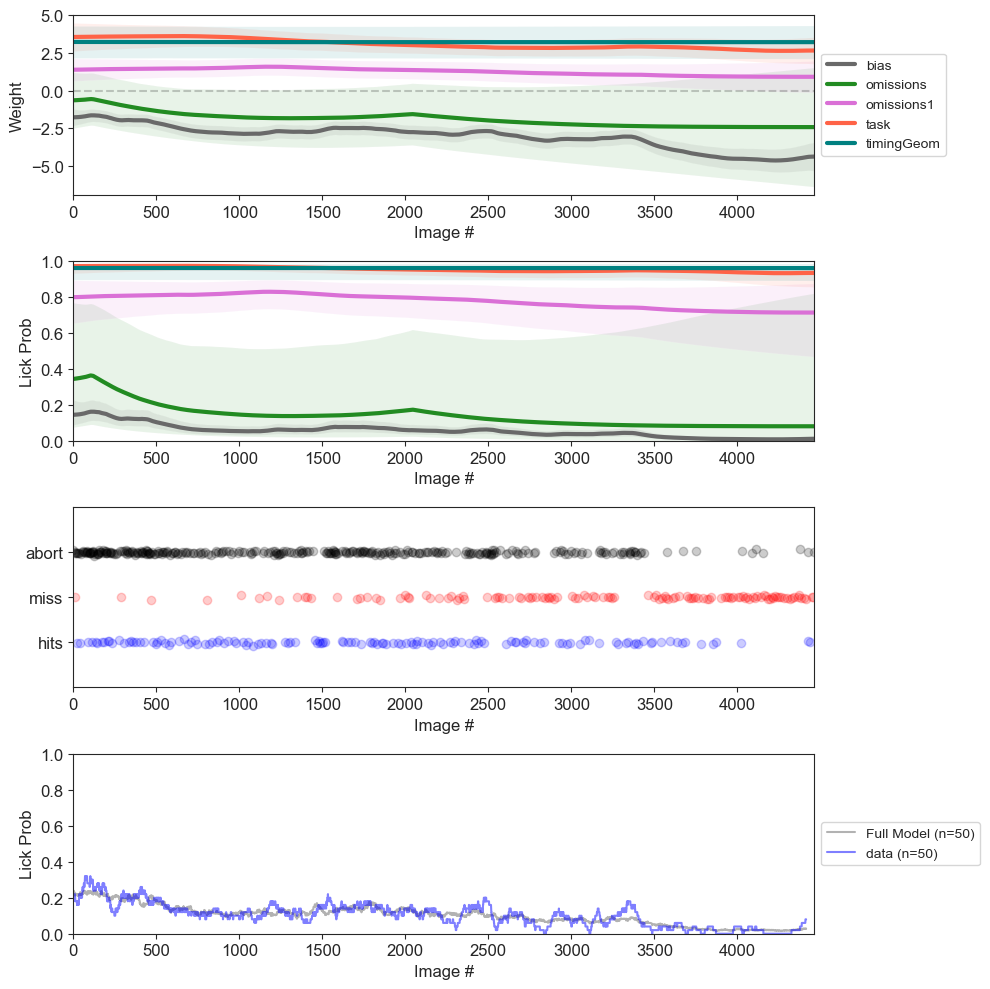

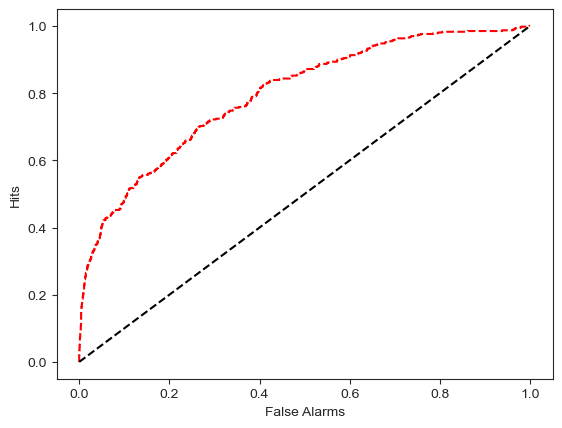

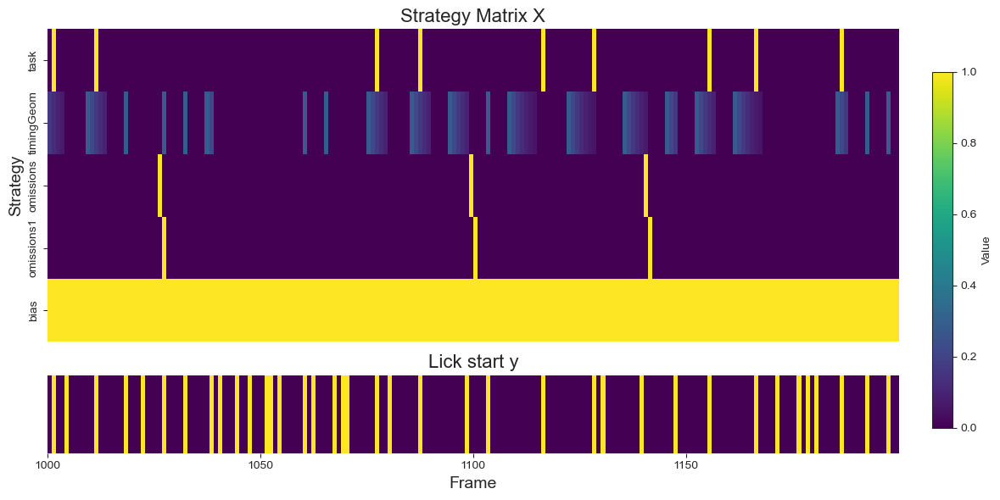

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1758.4020820277365
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 9.56%
Timing Index: 1.07%
Omission Index: 0.08%
Post-Omission Index: 1.40%
Overall Strategy Index: 8.49
Dominant Strategy: Visual

 Processing 1084451488


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


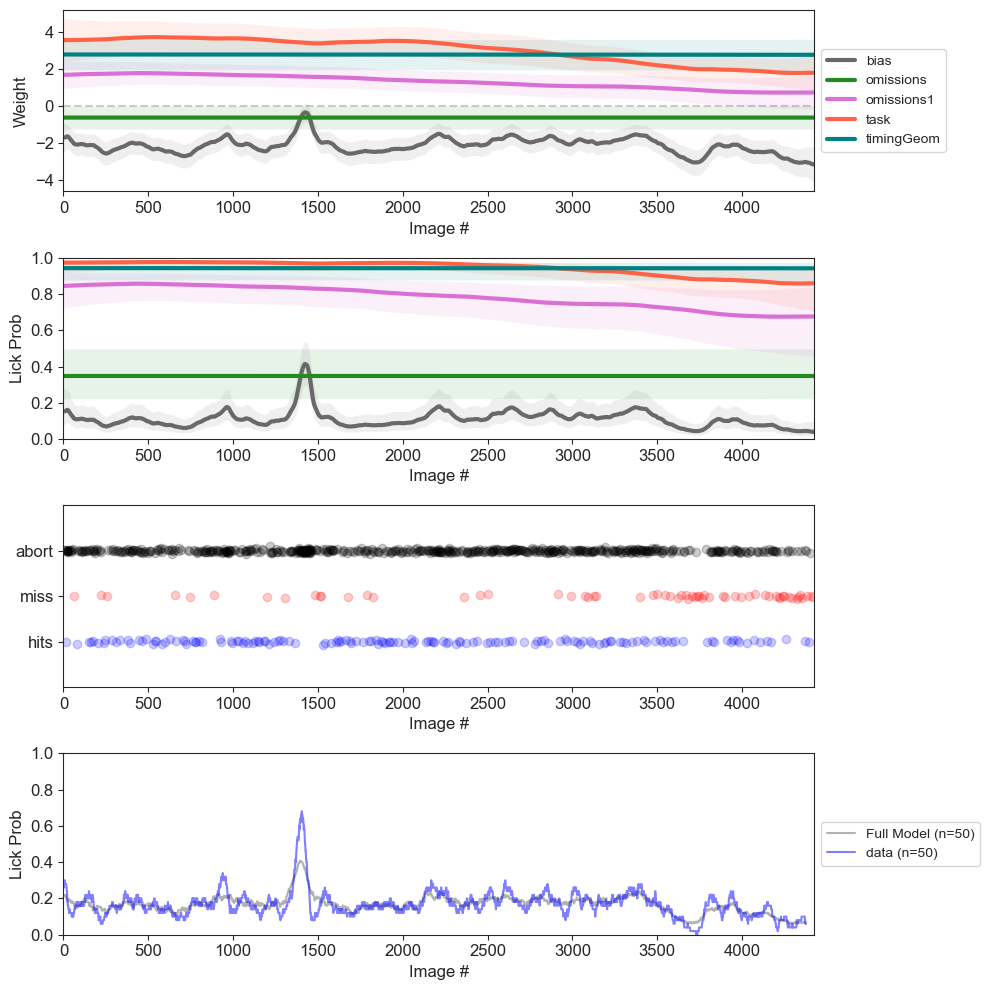

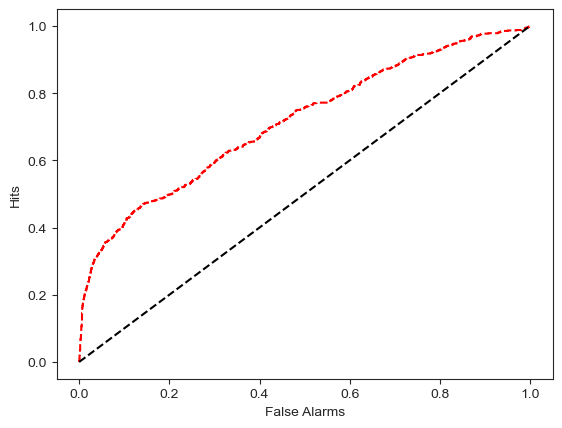

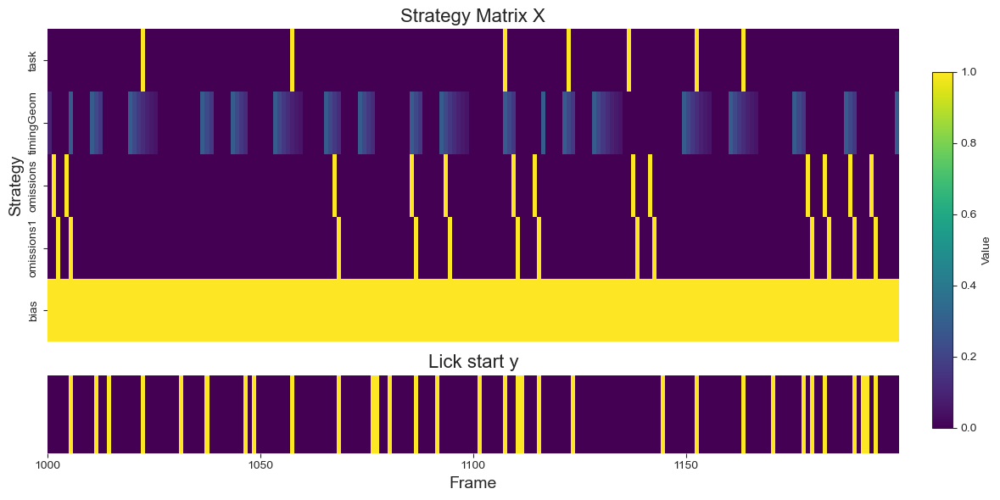

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1695.6374900395458
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 13.55%
Timing Index: 0.21%
Omission Index: 0.45%
Post-Omission Index: 2.06%
Overall Strategy Index: 13.34
Dominant Strategy: Visual

 Processing 1079337334


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


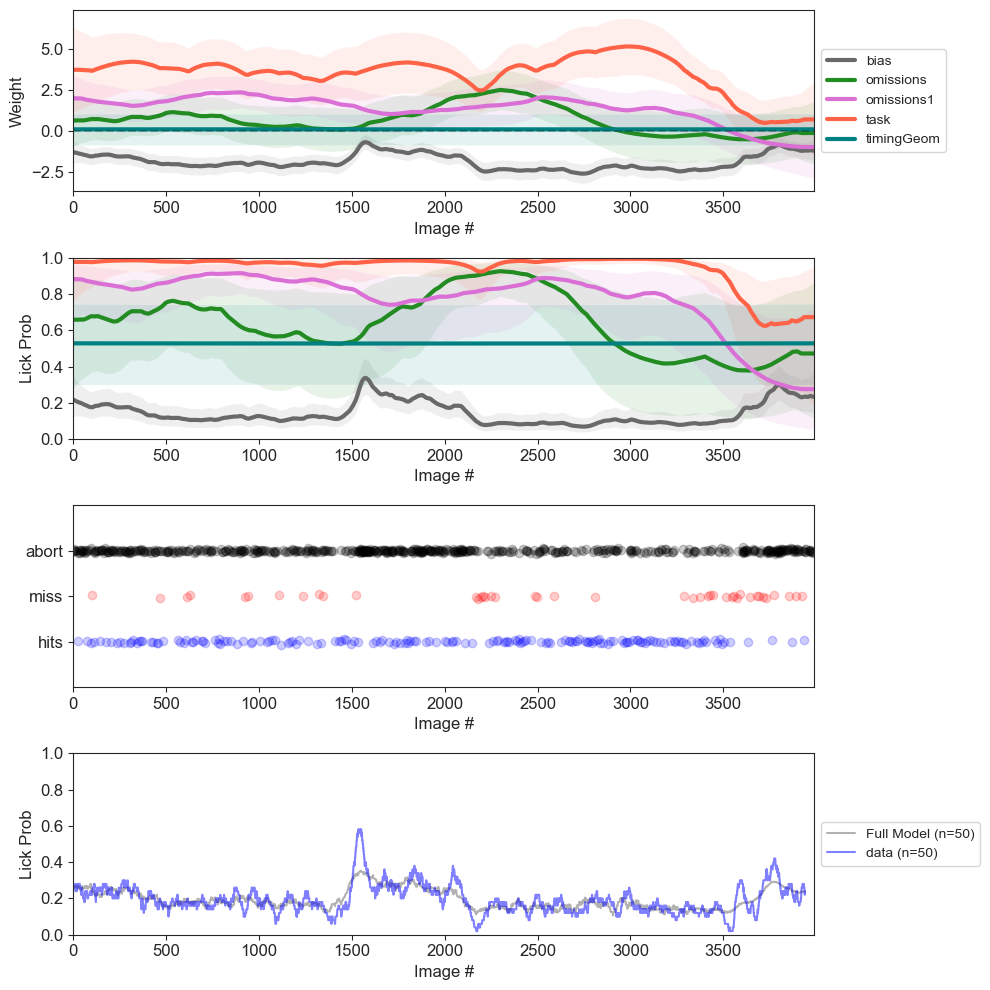

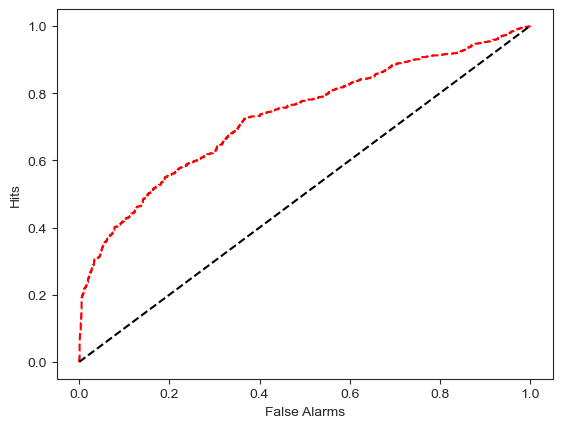

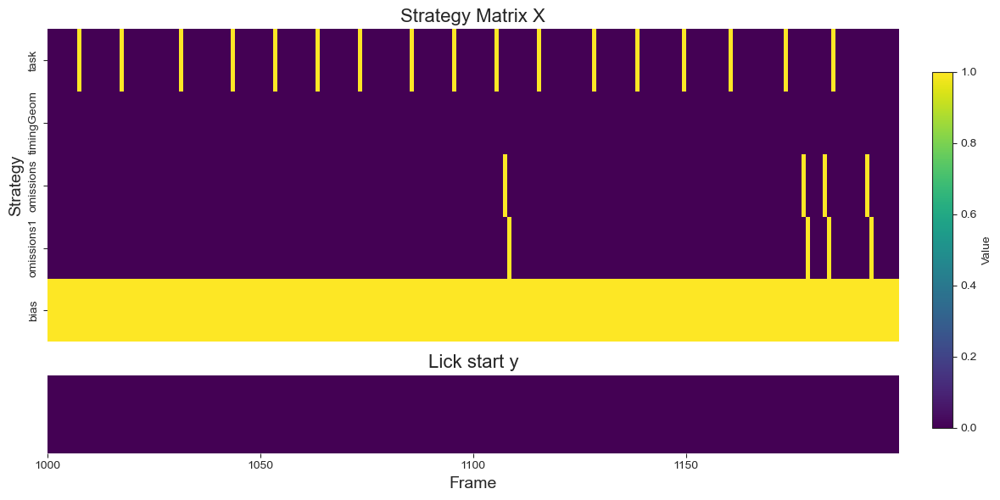

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1183.445346632012
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 10.46%
Timing Index: 5.52%
Omission Index: 0.33%
Post-Omission Index: 1.96%
Overall Strategy Index: 4.93
Dominant Strategy: Visual

 Processing 1079049704


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


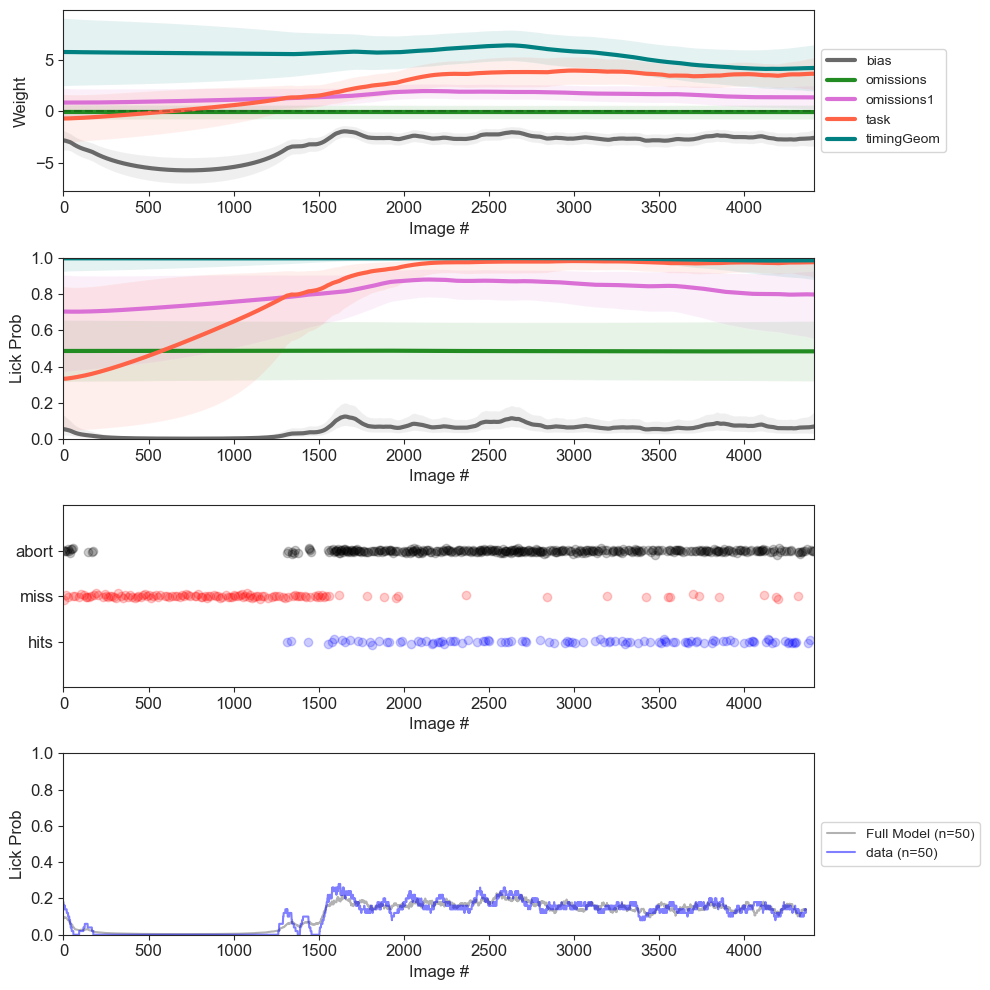

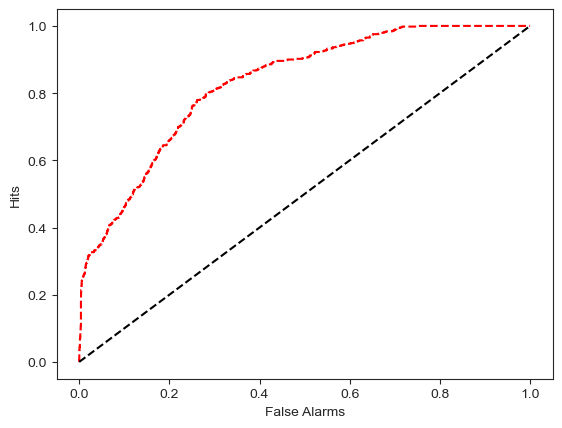

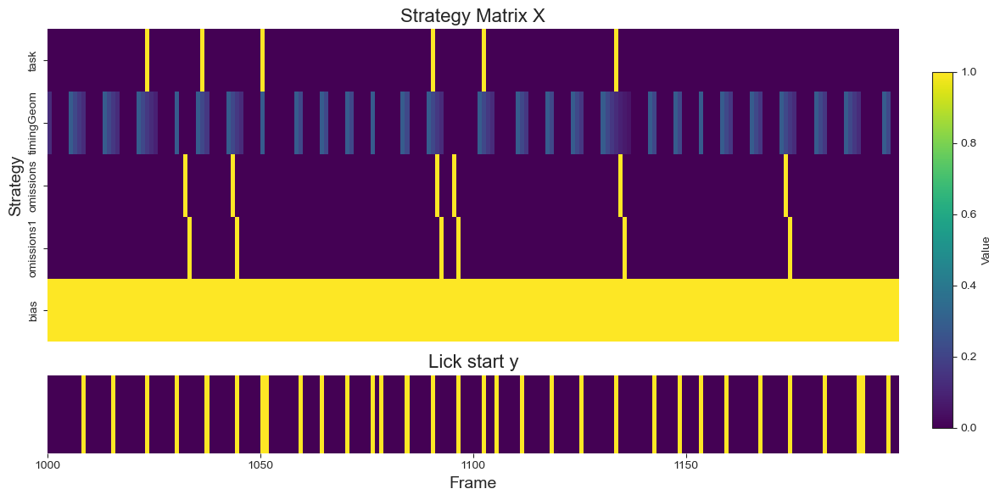

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1496.4150999446138
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 12.83%
Timing Index: 3.23%
Omission Index: 0.00%
Post-Omission Index: 2.23%
Overall Strategy Index: 9.60
Dominant Strategy: Visual

 Processing 1081125370


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


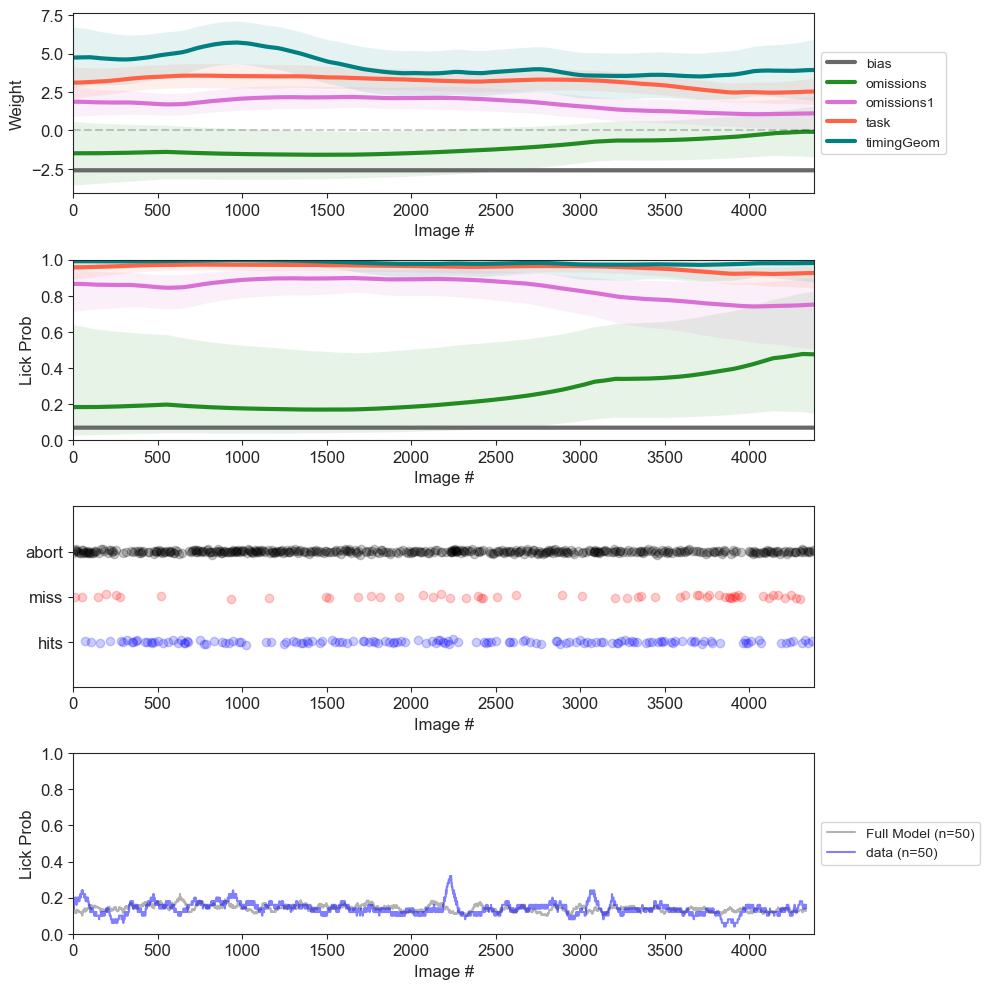

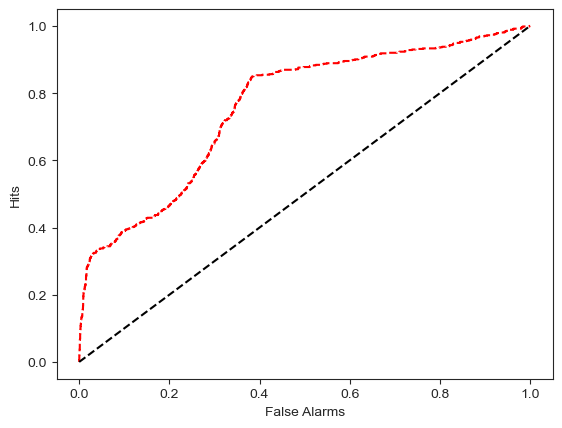

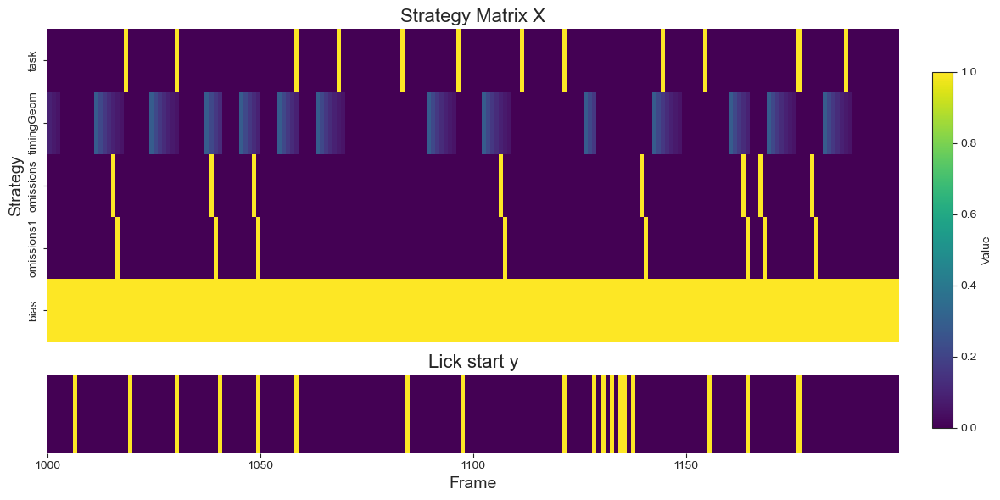

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1432.2665767771687
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 12.51%
Timing Index: 2.63%
Omission Index: 0.19%
Post-Omission Index: 3.50%
Overall Strategy Index: 9.88
Dominant Strategy: Visual

 Processing 1081469485


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


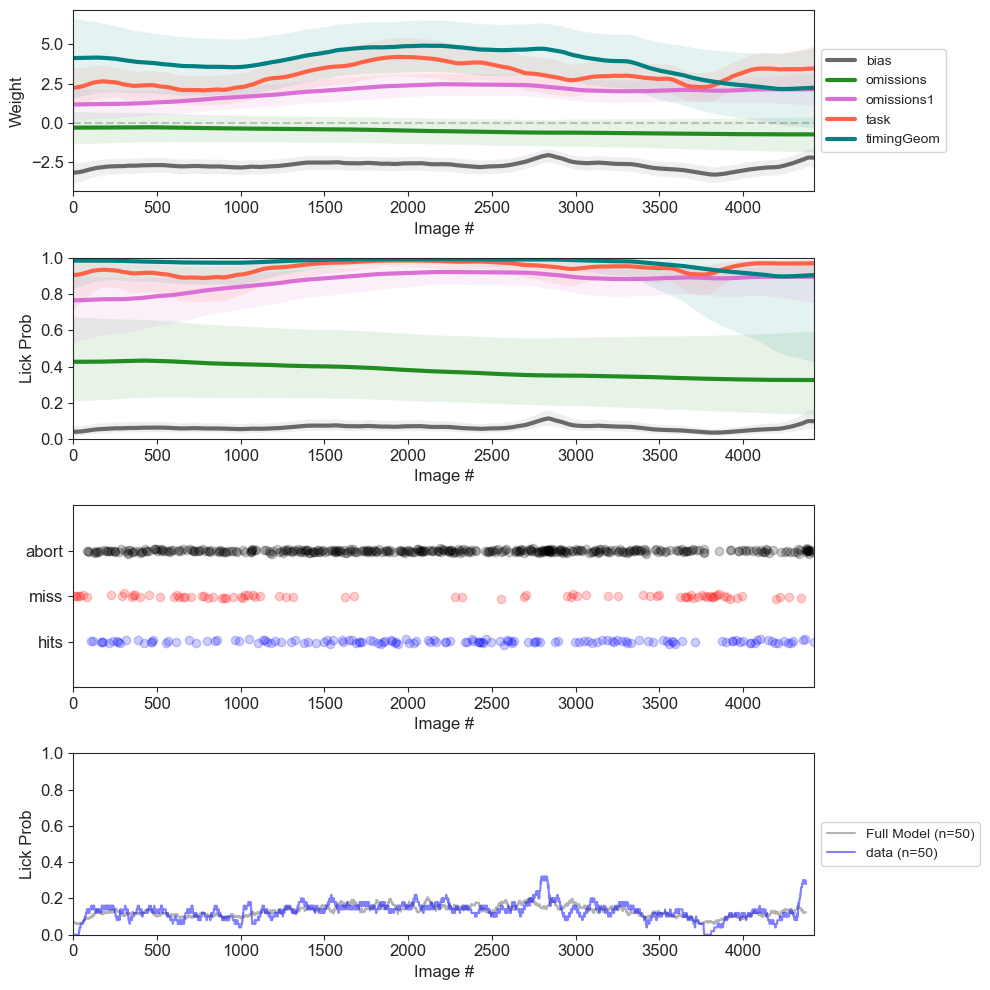

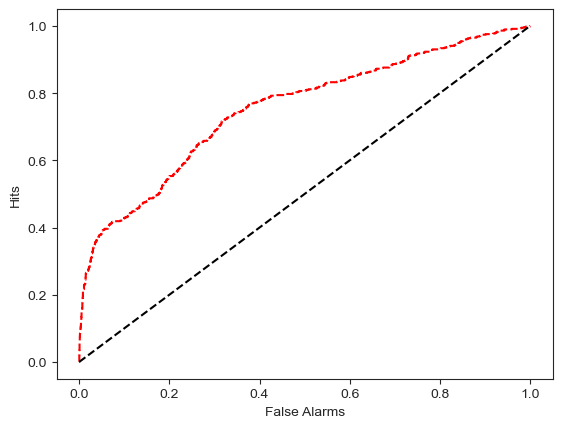

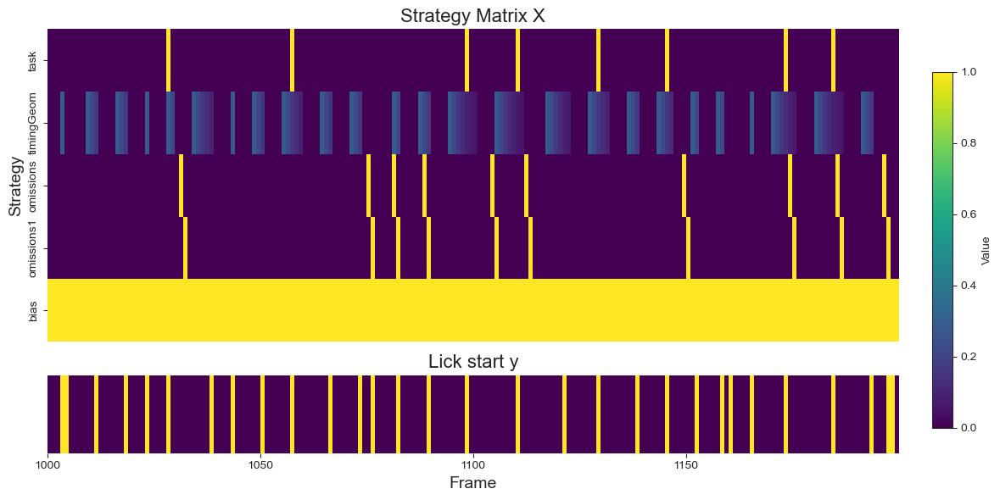

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1262.8696951761813
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 23.10%
Timing Index: 2.55%
Omission Index: 0.24%
Post-Omission Index: 3.40%
Overall Strategy Index: 20.55
Dominant Strategy: Visual

 Processing 1099625106


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


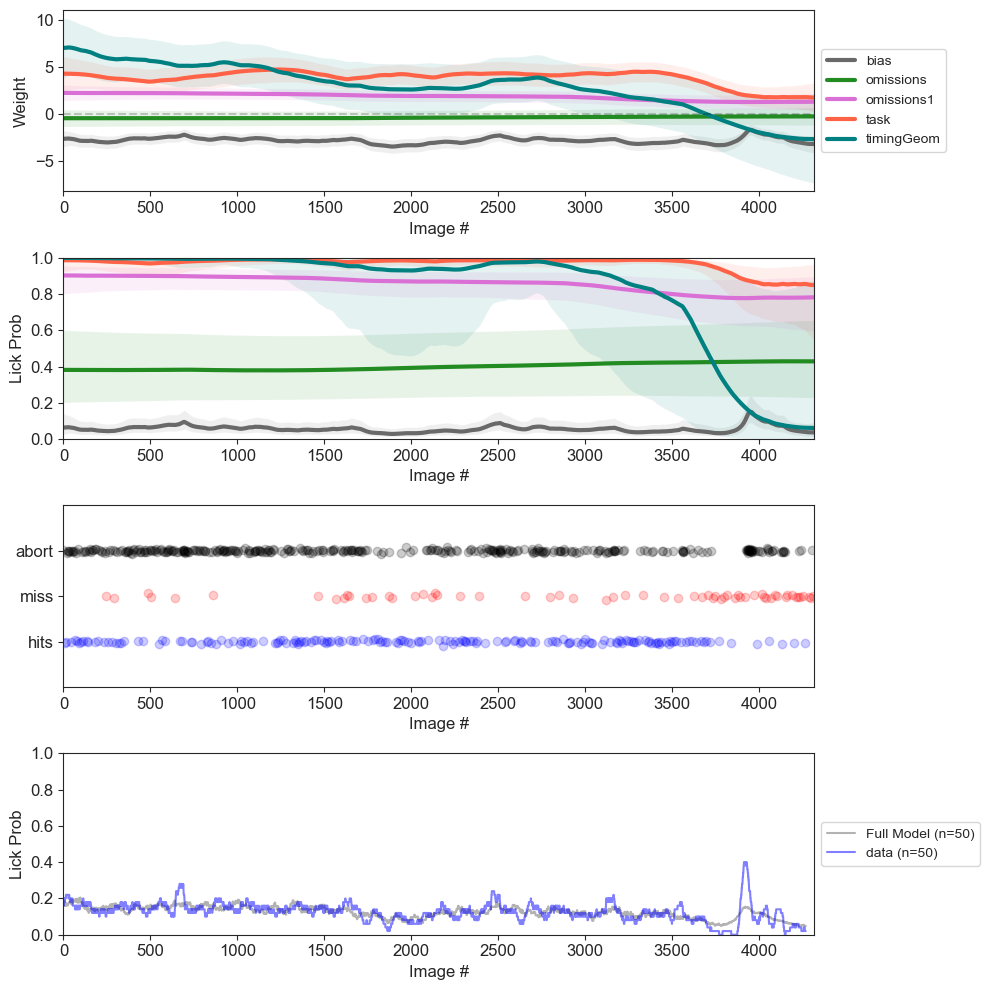

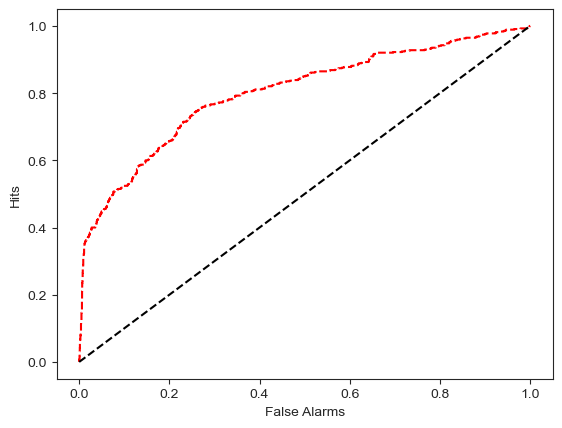

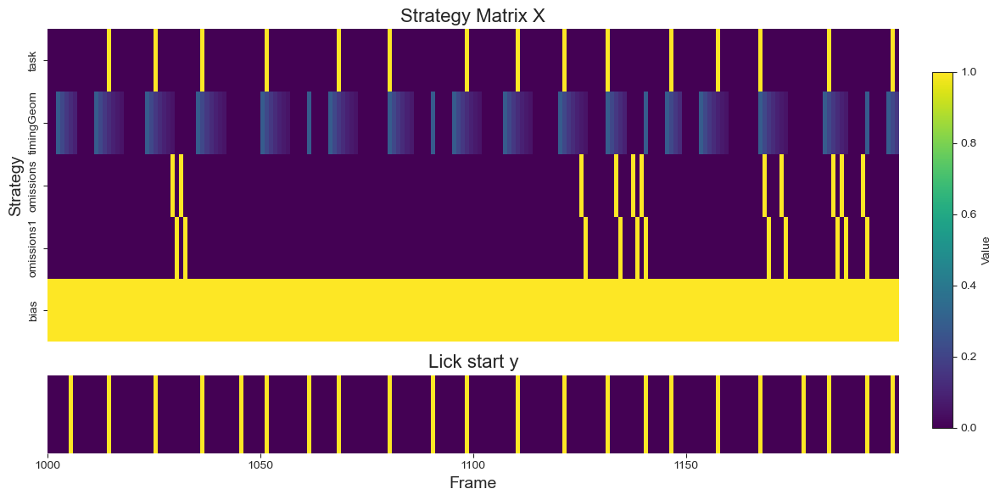

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1152.467446677183
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 27.50%
Timing Index: 5.55%
Omission Index: 1.06%
Post-Omission Index: 6.56%
Overall Strategy Index: 21.95
Dominant Strategy: Visual

 Processing 1099904879


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


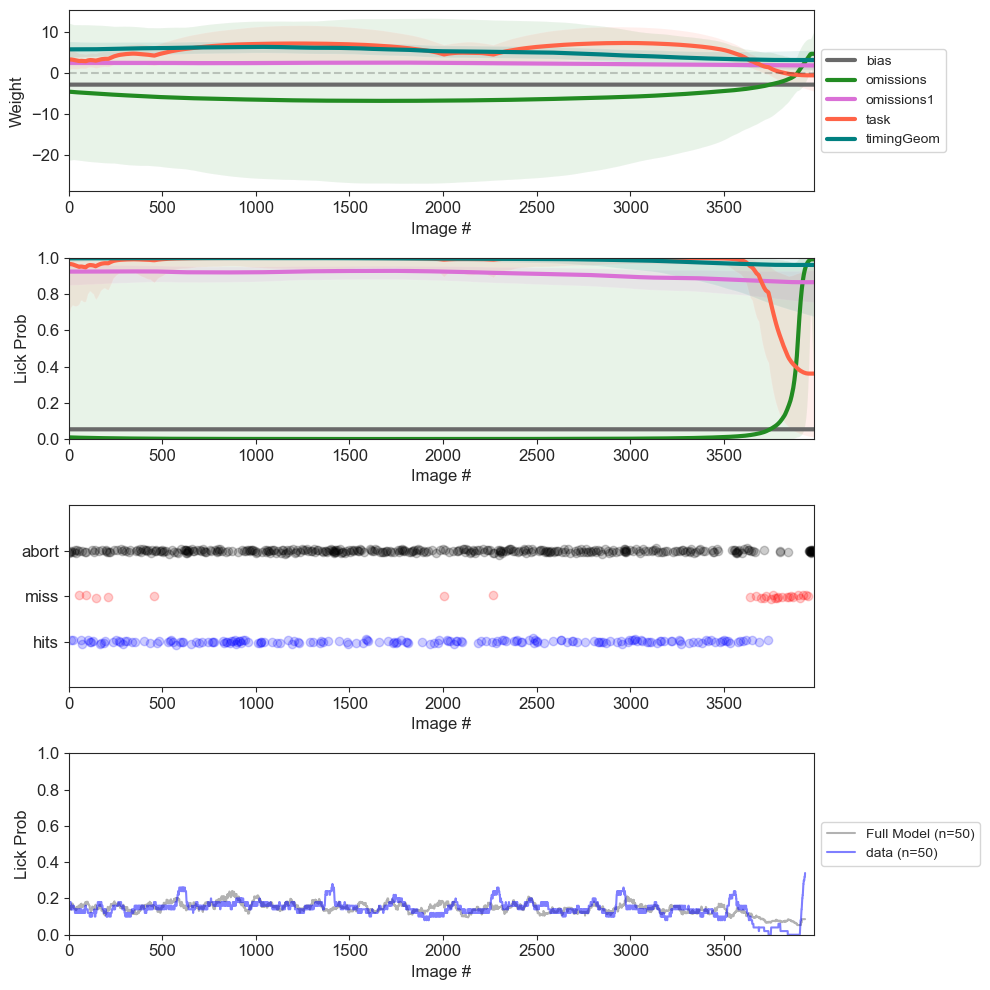

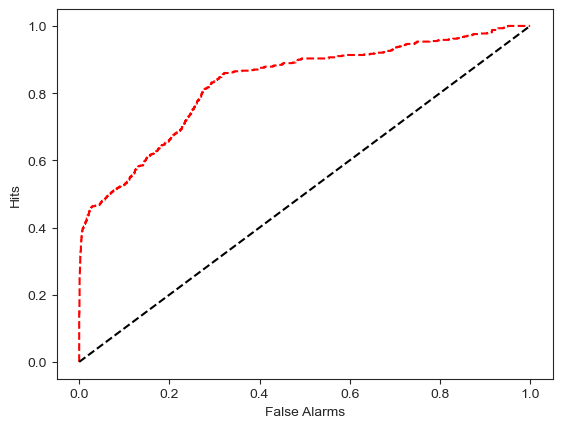

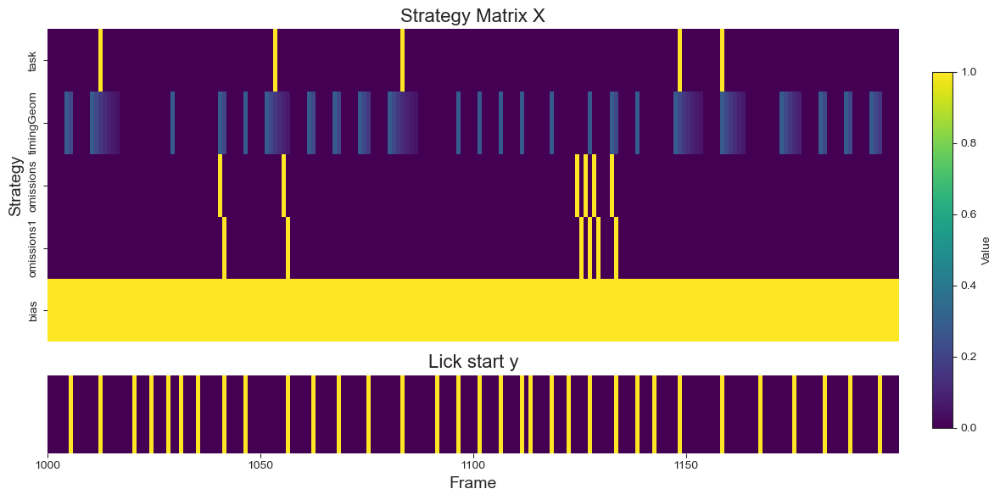

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1429.900922700981
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 14.65%
Timing Index: 8.85%
Omission Index: 0.07%
Post-Omission Index: 3.37%
Overall Strategy Index: 5.80
Dominant Strategy: Visual

 Processing 1104106044


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


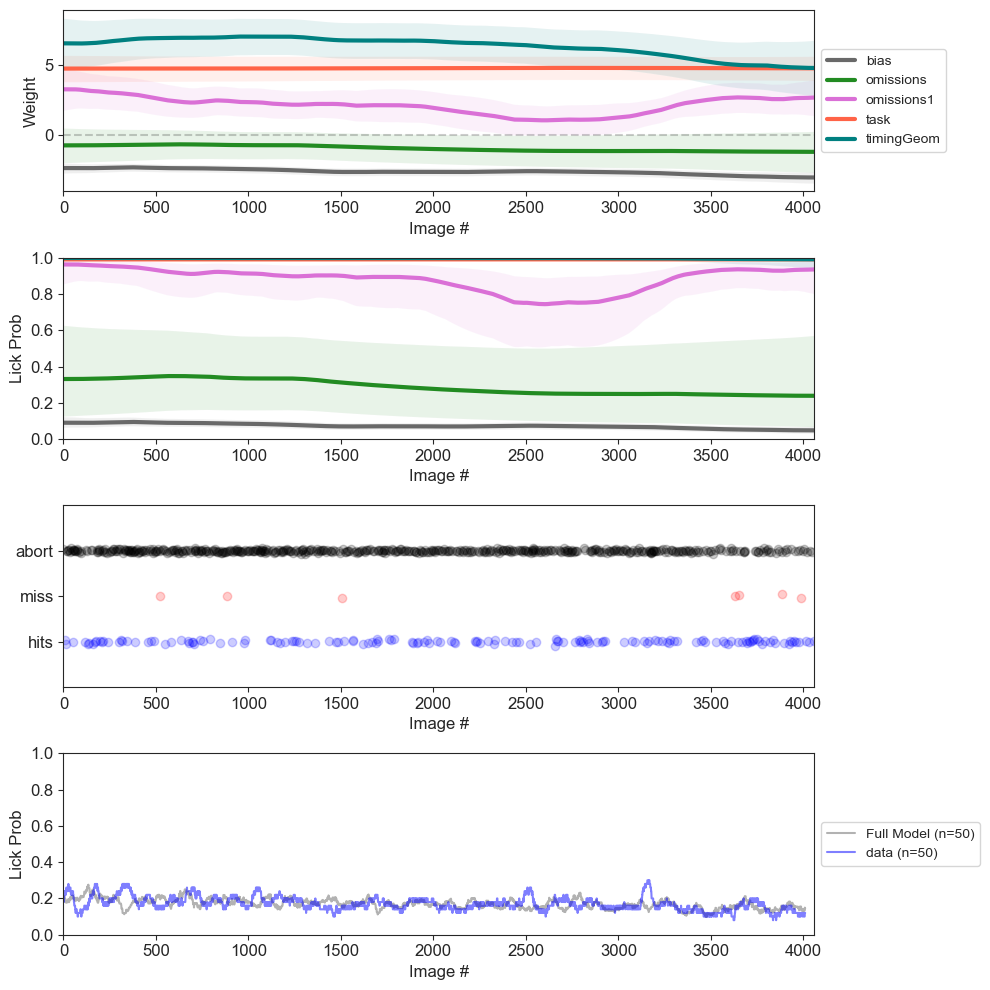

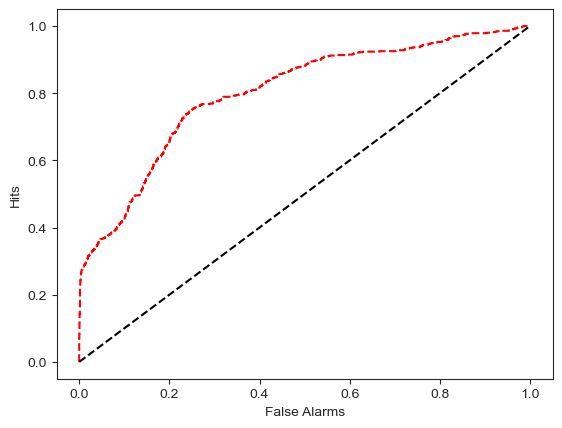

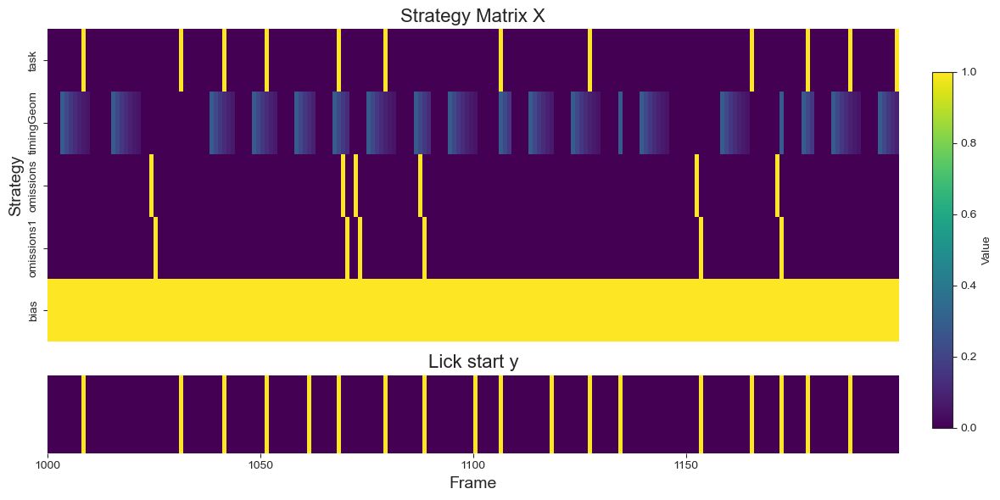

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1323.646415537849
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 31.70%
Timing Index: 0.48%
Omission Index: 0.20%
Post-Omission Index: 4.67%
Overall Strategy Index: 31.22
Dominant Strategy: Visual

 Processing 1104327579


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


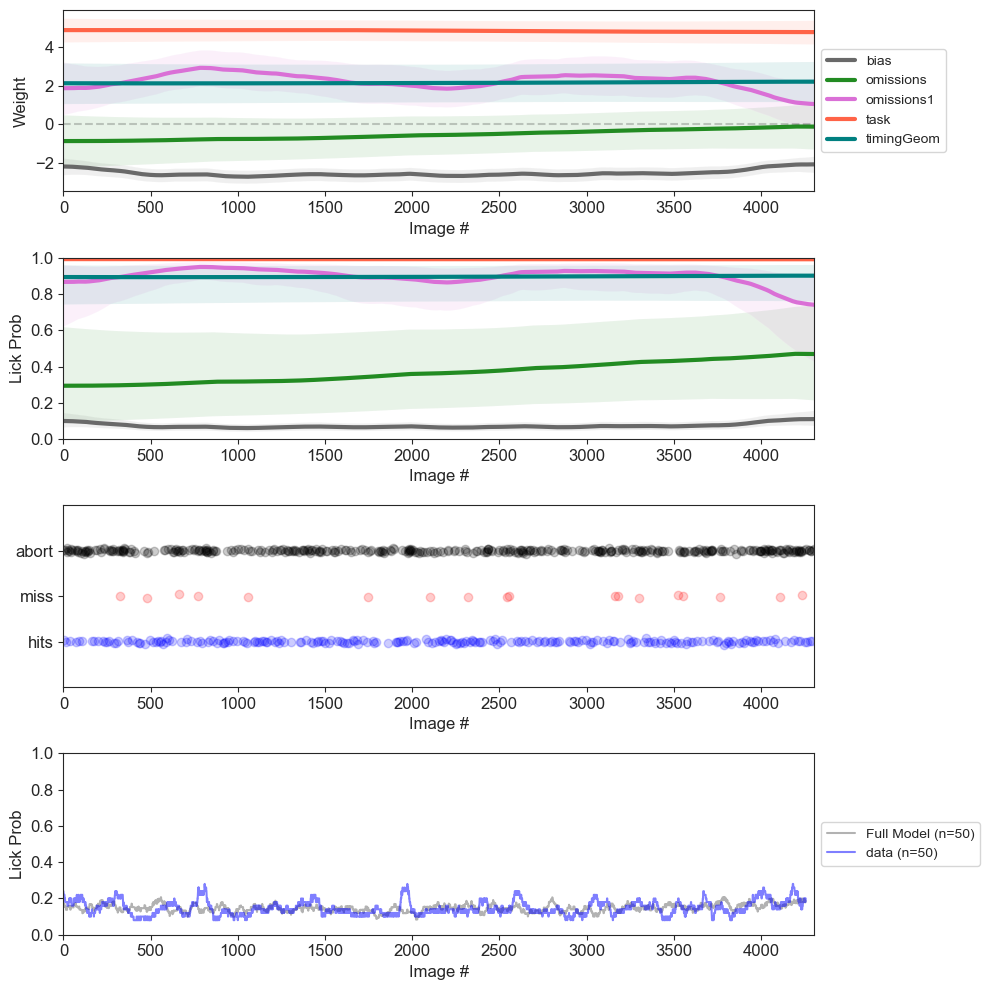

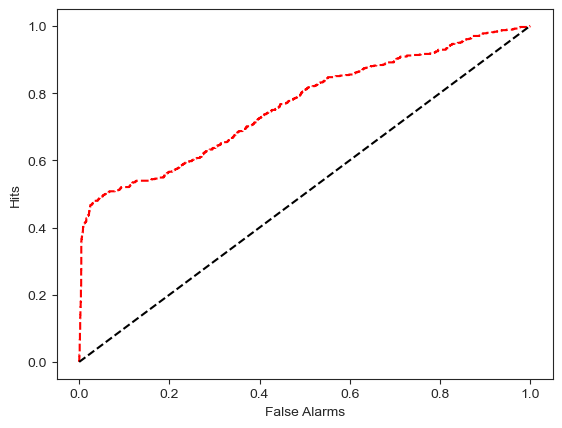

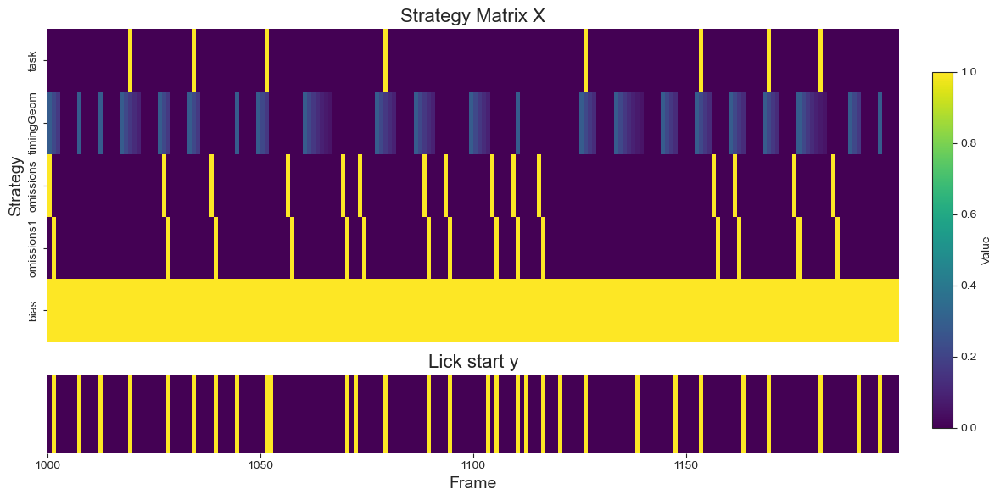

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1882.4143258724507
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 8.92%
Timing Index: 1.85%
Omission Index: 0.57%
Post-Omission Index: 3.05%
Overall Strategy Index: 7.07
Dominant Strategy: Visual

 Processing 1109709062


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


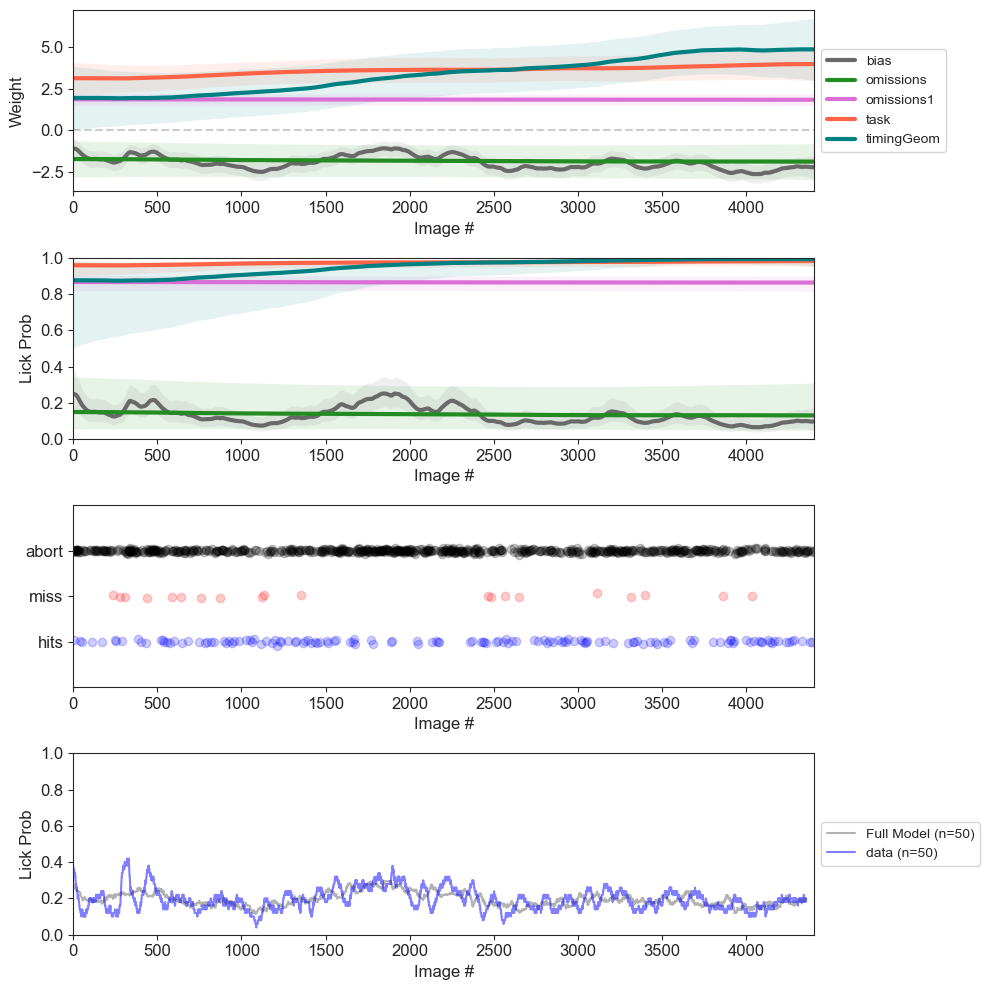

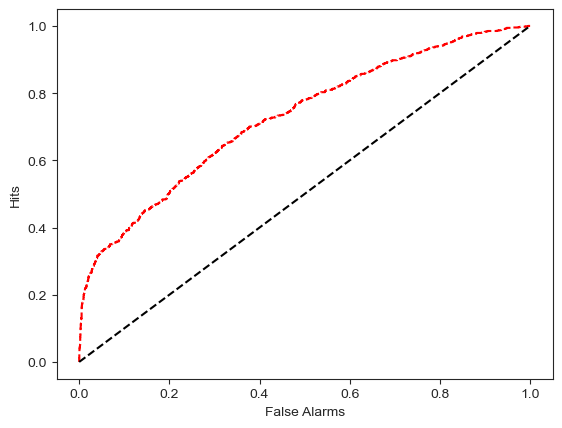

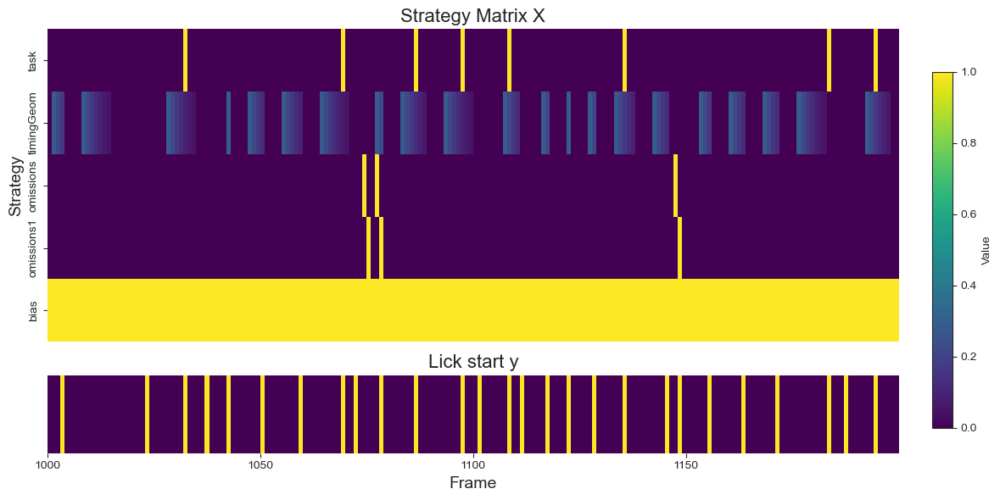

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1332.8161026958114
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 17.61%
Timing Index: 1.38%
Omission Index: 0.00%
Post-Omission Index: 1.21%
Overall Strategy Index: 16.23
Dominant Strategy: Visual

 Processing 1109924339


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


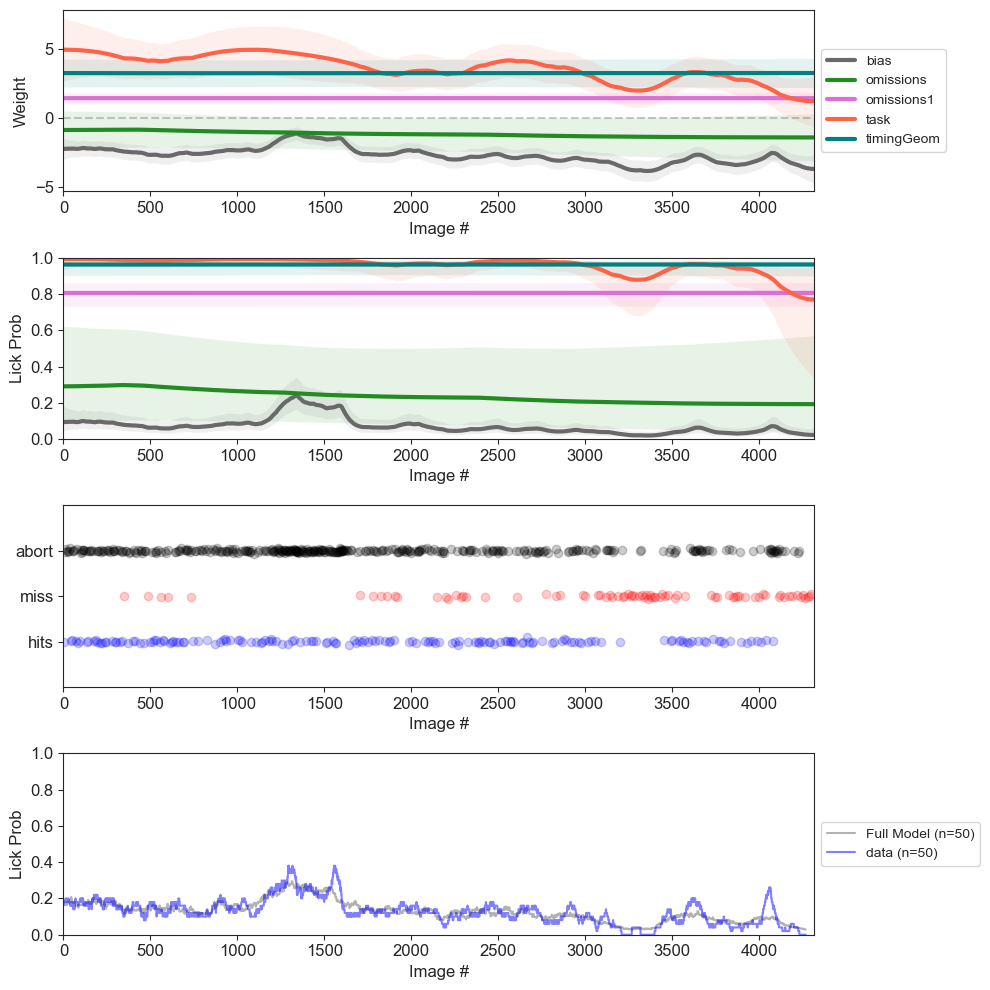

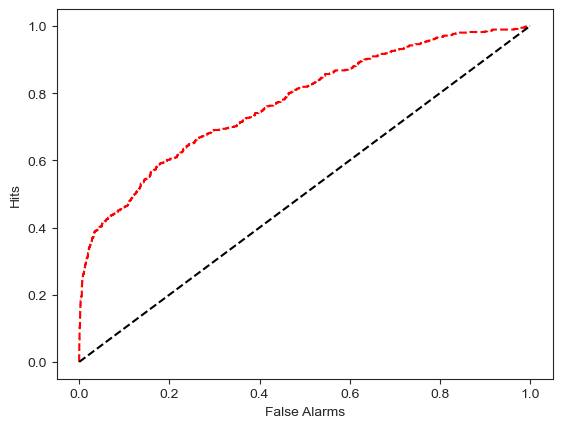

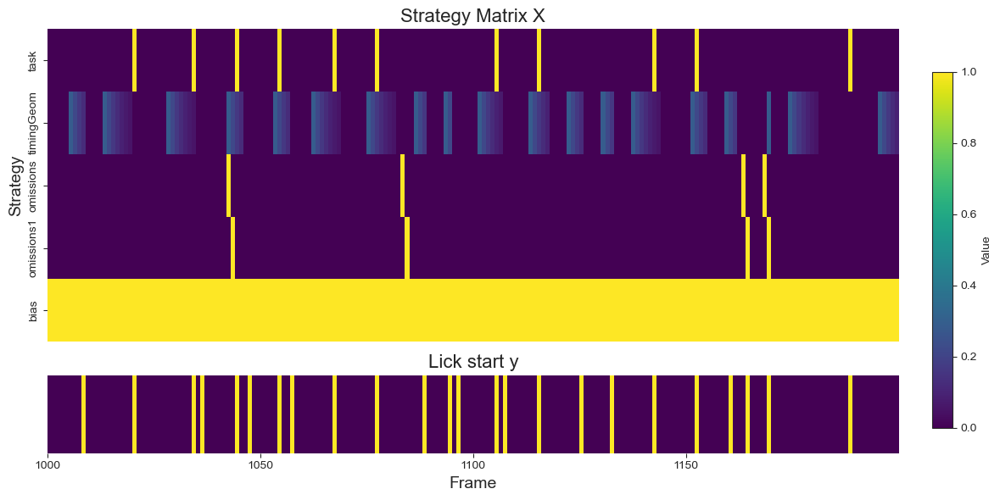

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1028.5056301527657
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 28.37%
Timing Index: 0.76%
Omission Index: 0.33%
Post-Omission Index: 2.93%
Overall Strategy Index: 27.61
Dominant Strategy: Visual

 Processing 1108365127


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


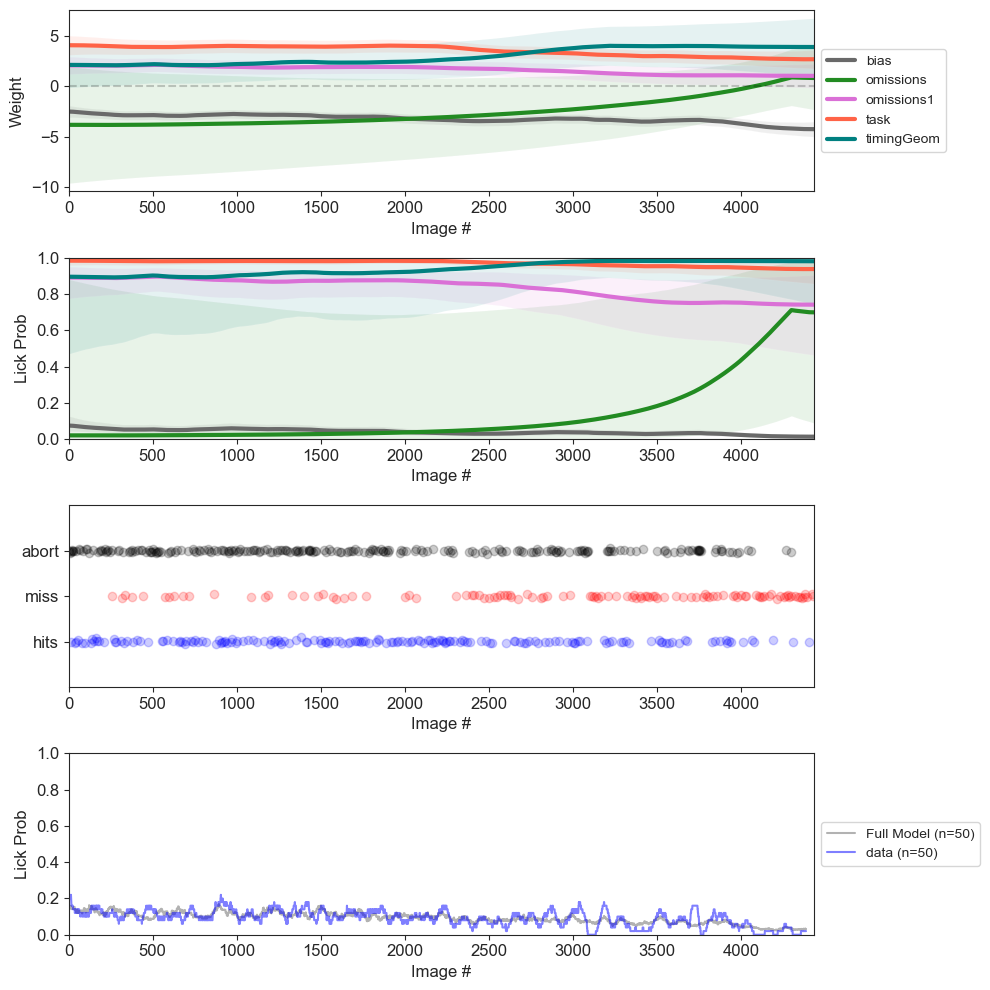

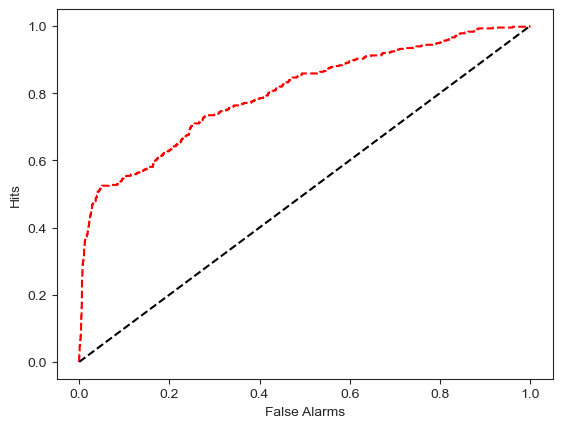

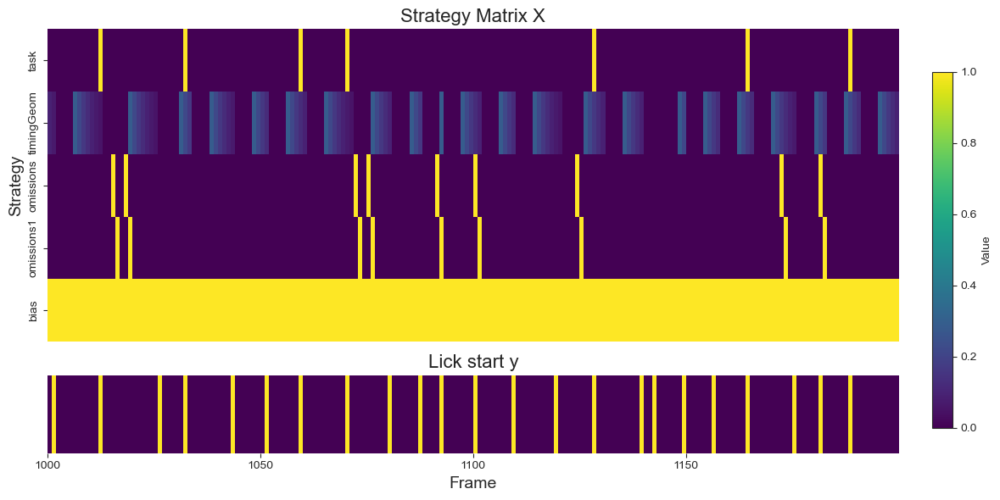

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1320.6878889824293
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 25.20%
Timing Index: 1.66%
Omission Index: 0.20%
Post-Omission Index: 0.21%
Overall Strategy Index: 23.54
Dominant Strategy: Visual

 Processing 1108565586


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


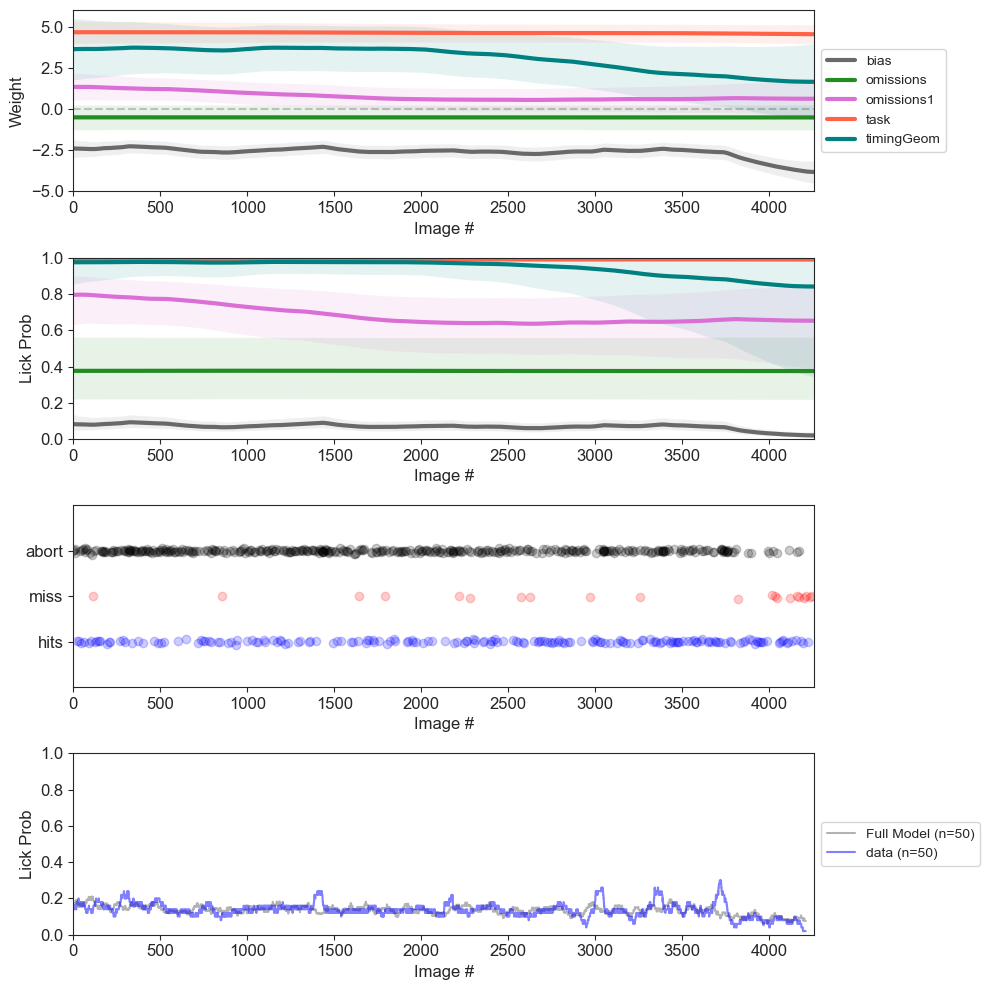

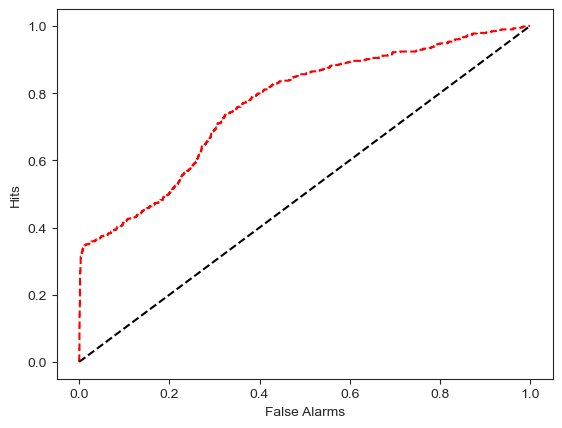

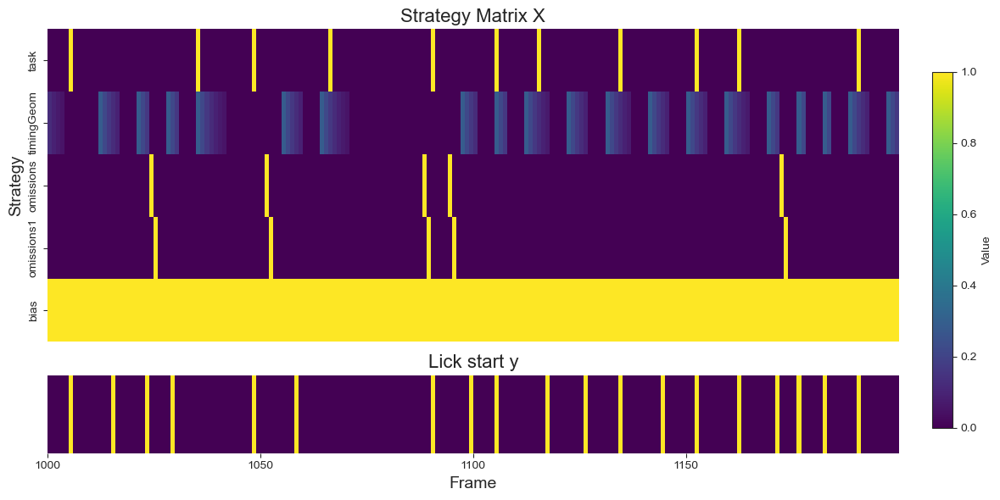

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -926.026860441445
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 21.36%
Timing Index: 2.60%
Omission Index: 0.05%
Post-Omission Index: 0.69%
Overall Strategy Index: 18.76
Dominant Strategy: Visual

 Processing 1116979796


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


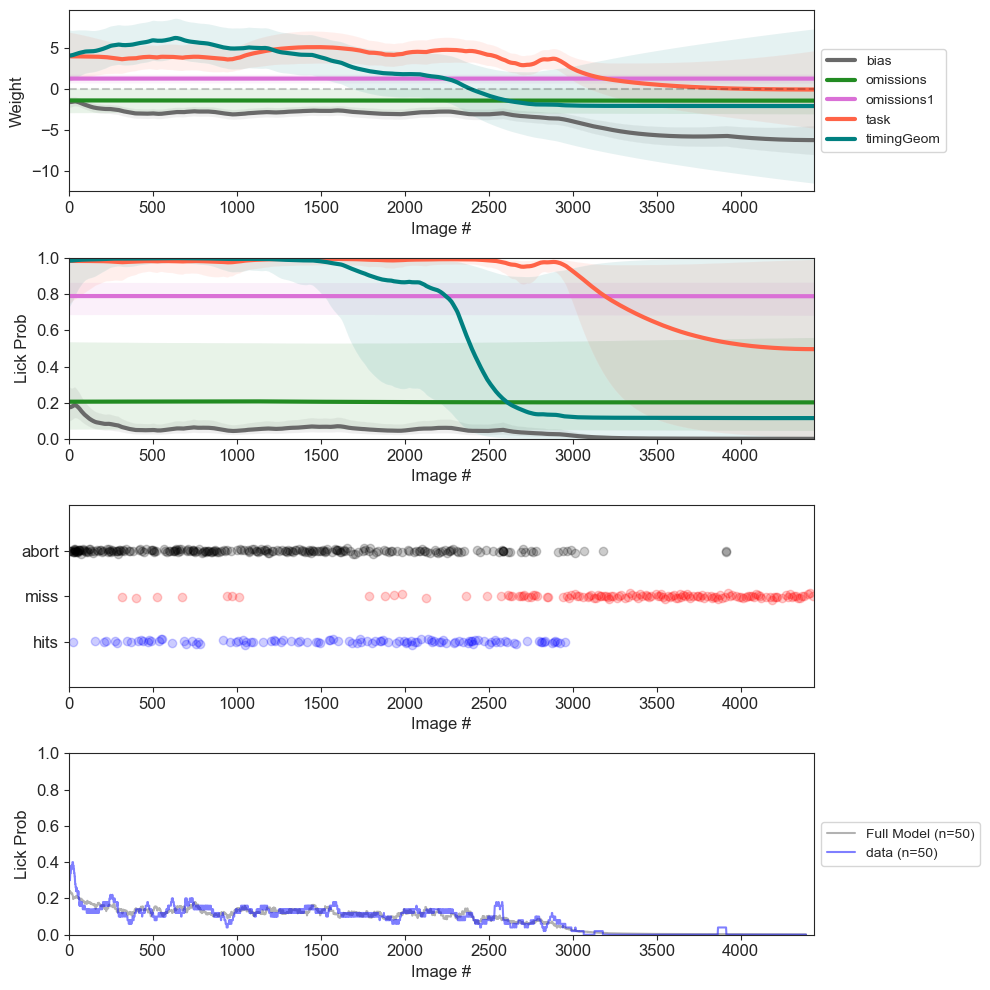

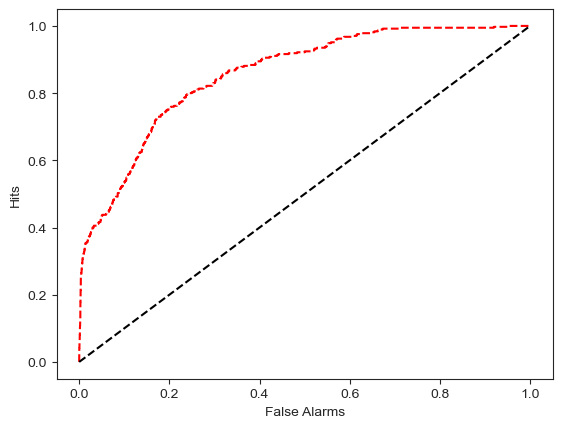

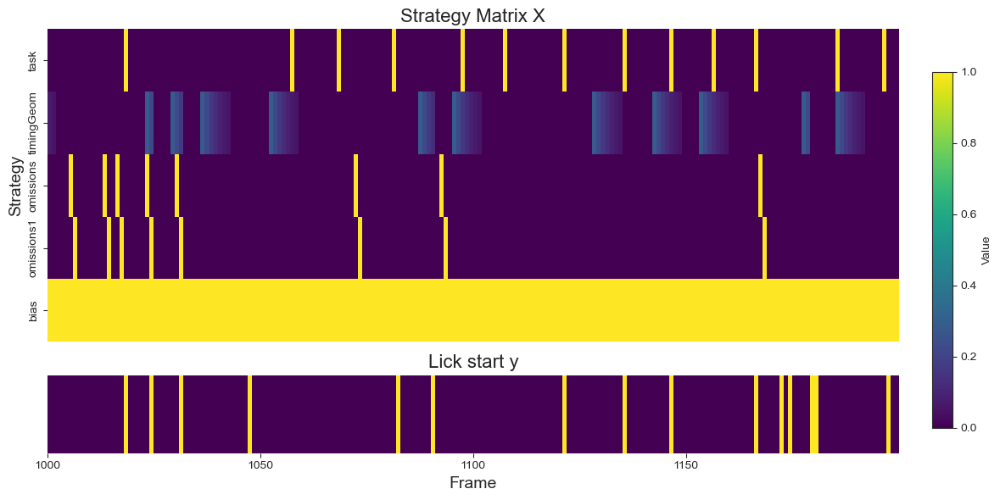

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1273.5425436224468
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 16.05%
Timing Index: 0.21%
Omission Index: 0.21%
Post-Omission Index: 2.46%
Overall Strategy Index: 15.84
Dominant Strategy: Visual

 Processing 1117166453


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


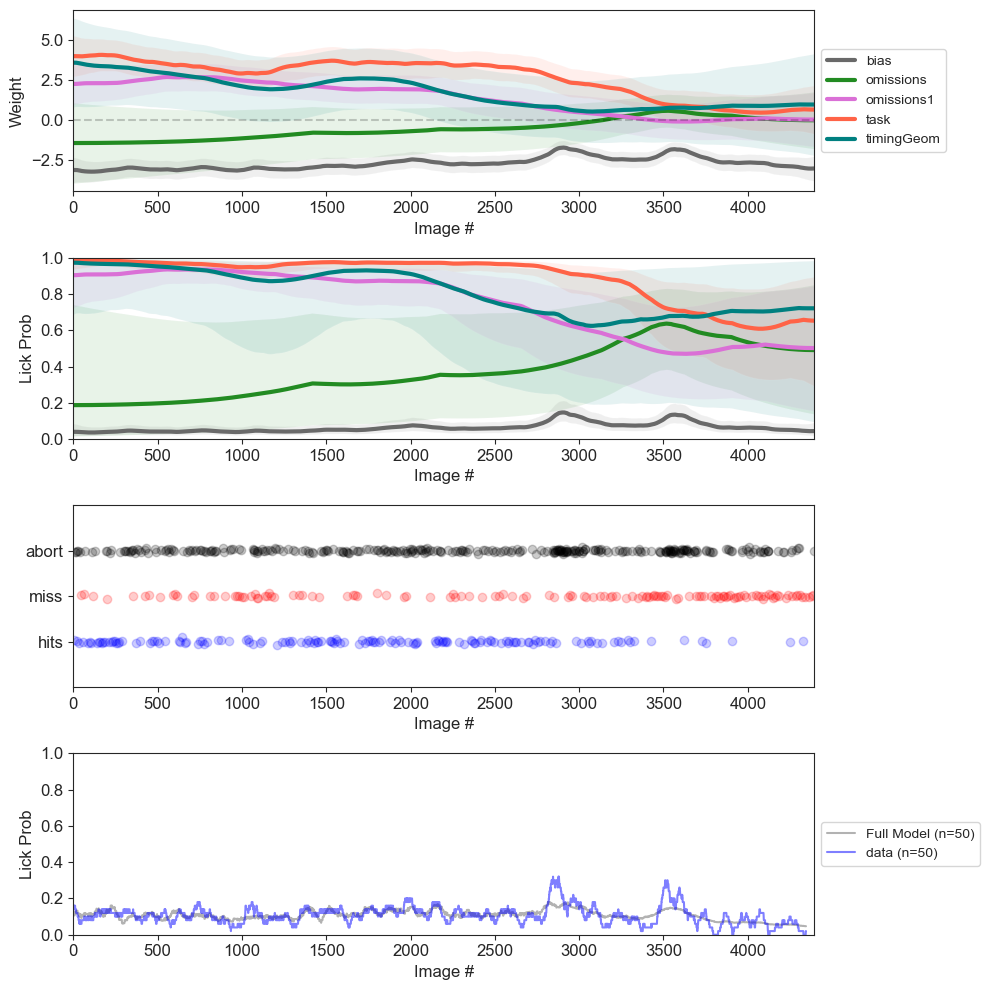

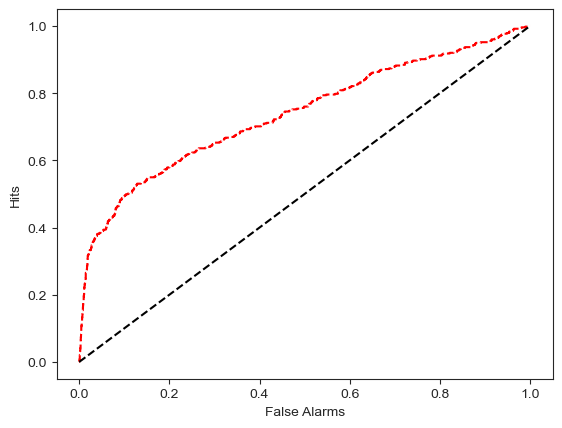

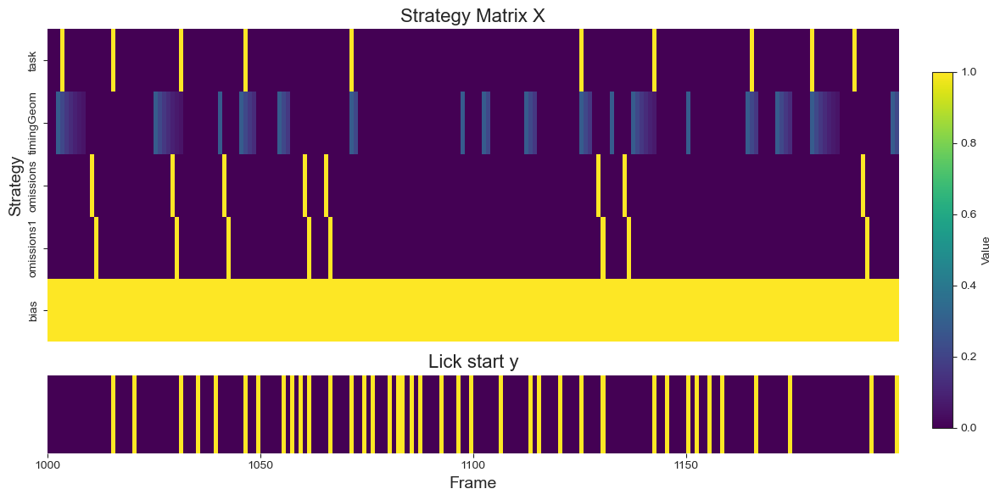

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1129.9693379800738
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 11.54%
Timing Index: 0.43%
Omission Index: 0.24%
Post-Omission Index: 3.12%
Overall Strategy Index: 11.11
Dominant Strategy: Visual

 Processing 1118353478


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


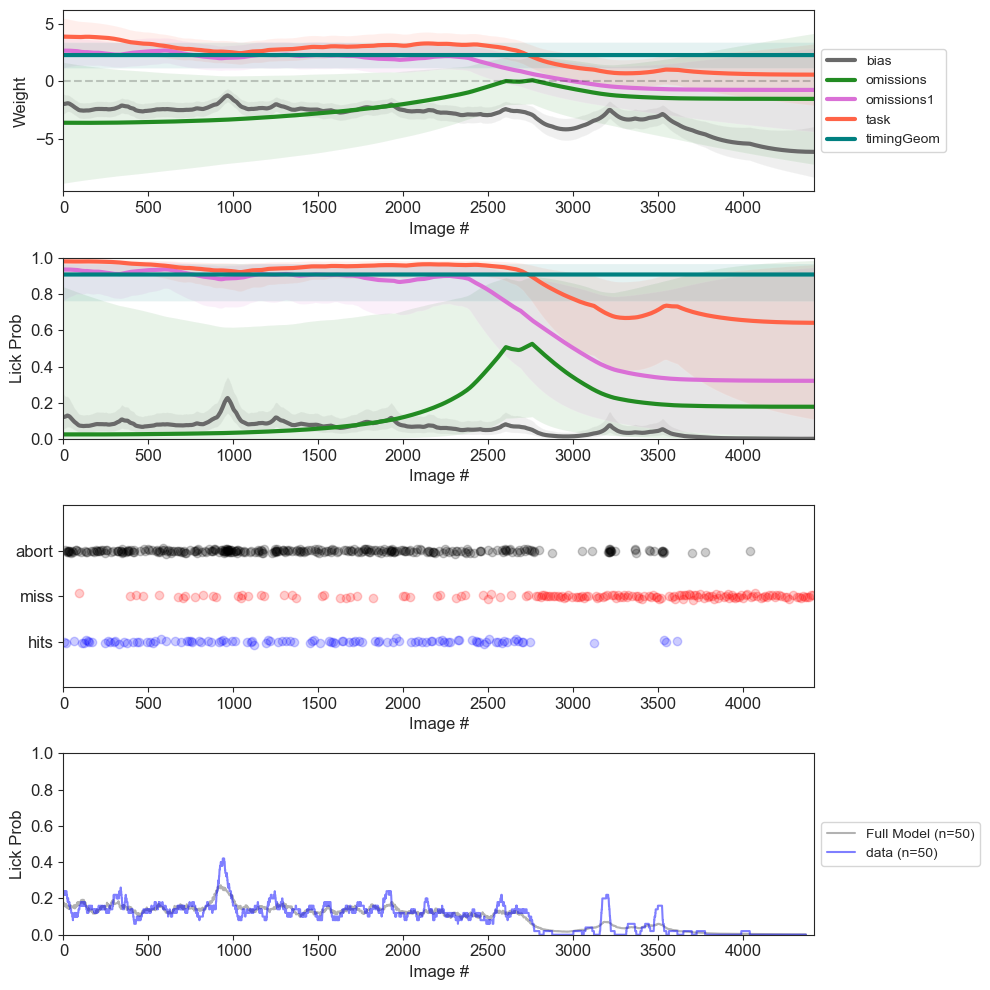

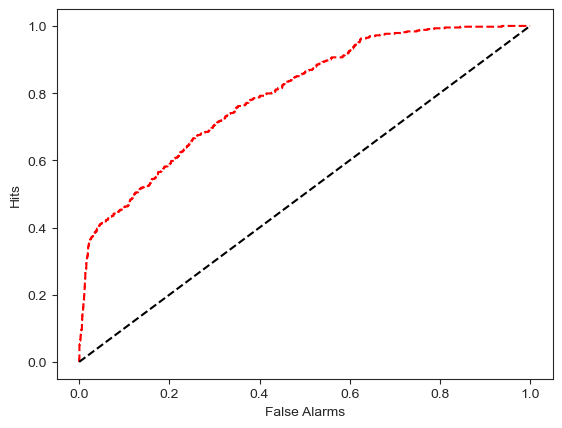

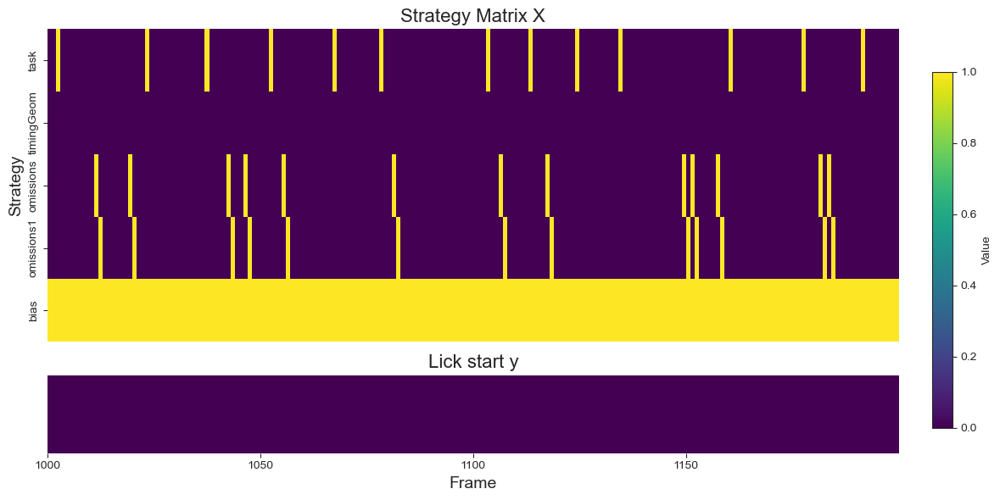

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -343.0089767313184
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 0.92%
Timing Index: 0.65%
Omission Index: 0.89%
Post-Omission Index: 1.01%
Overall Strategy Index: 0.27
Dominant Strategy: Visual

 Processing 1118600316


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


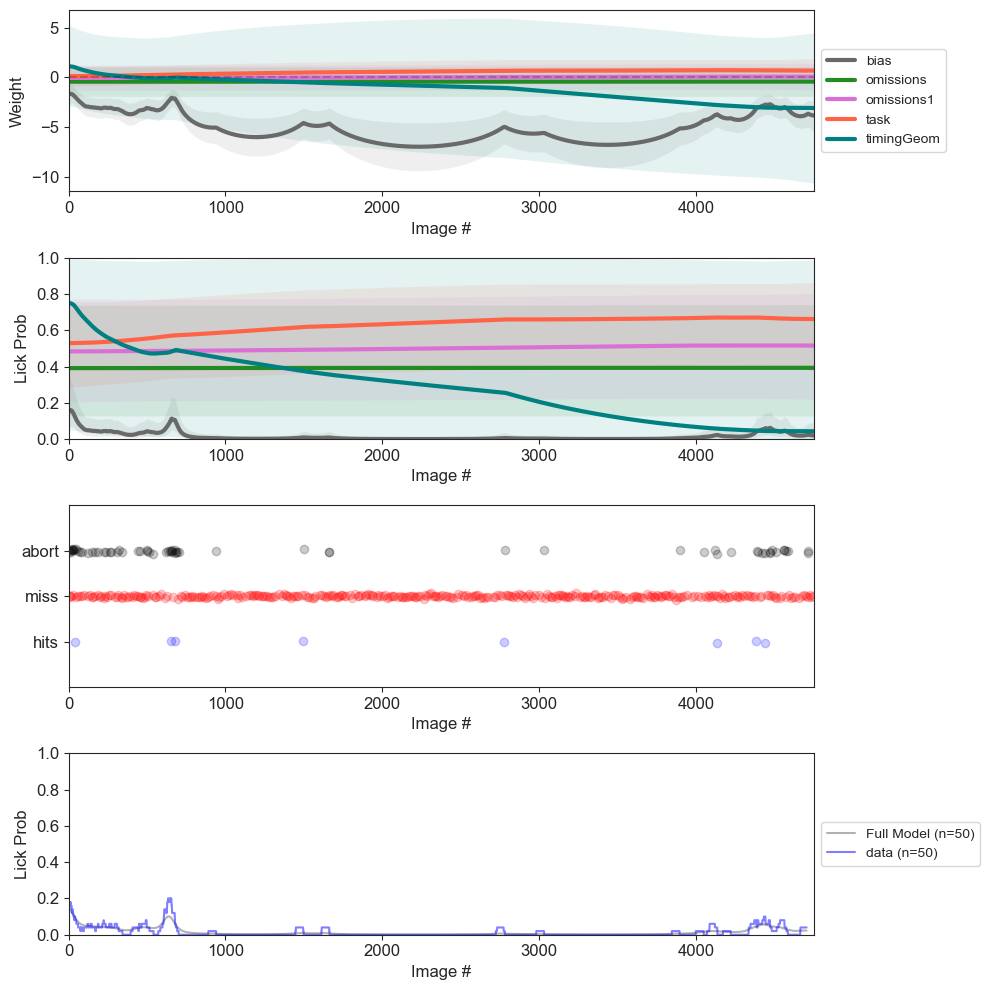

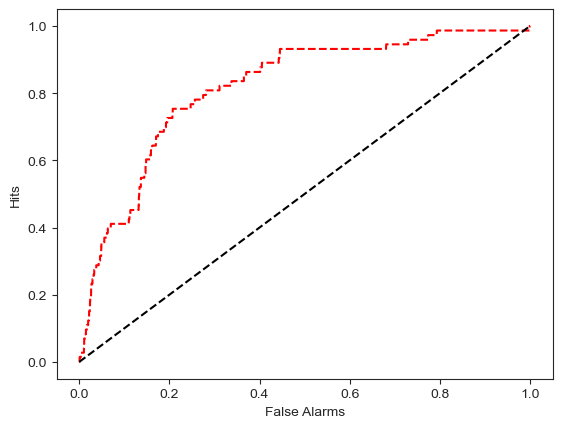

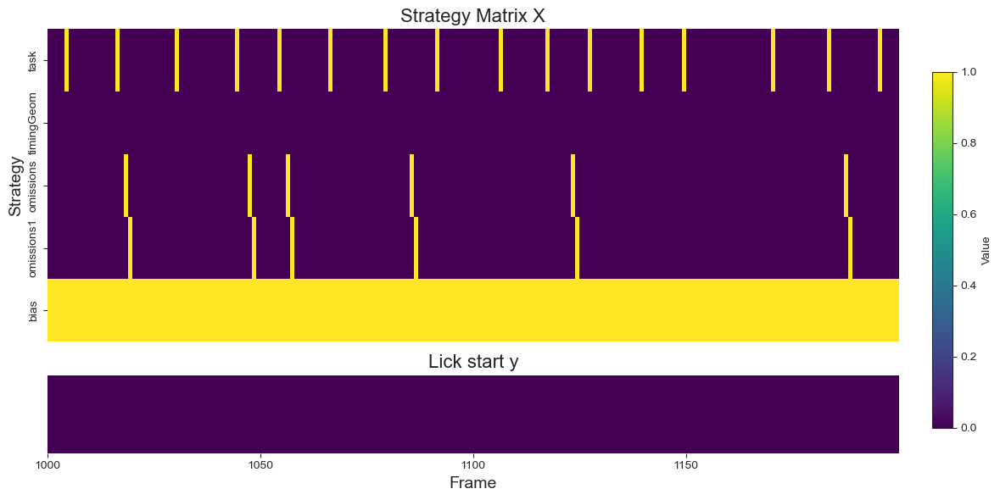

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -761.0023523821292
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 1.25%
Timing Index: 0.44%
Omission Index: 0.30%
Post-Omission Index: 0.39%
Overall Strategy Index: 0.81
Dominant Strategy: Visual

 Processing 1119976479


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


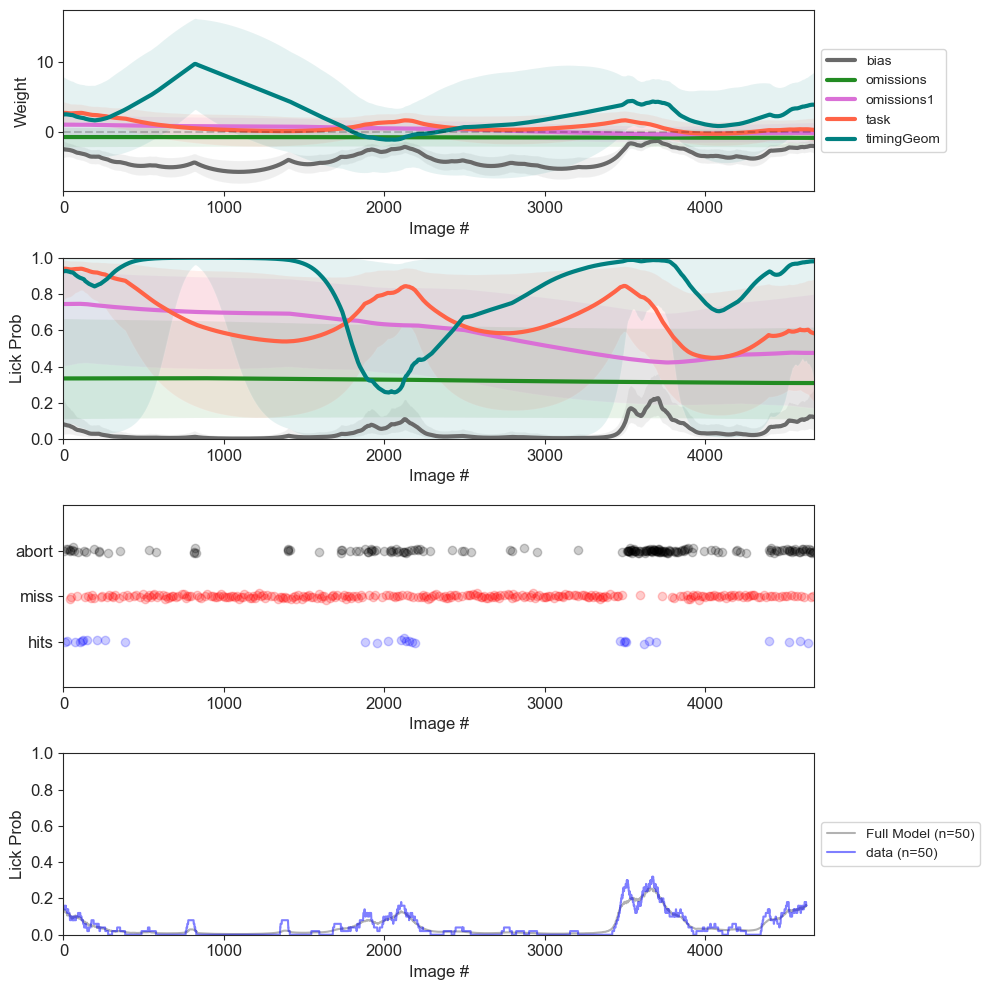

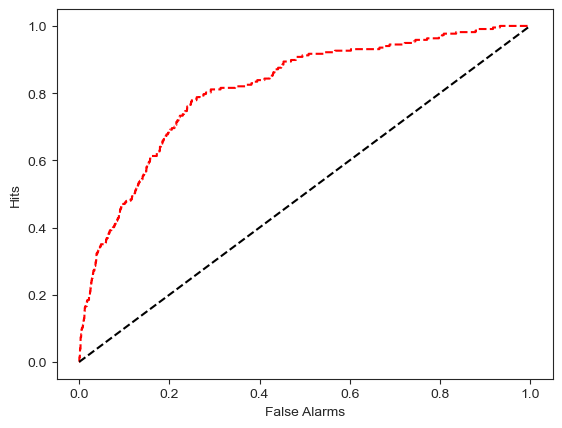

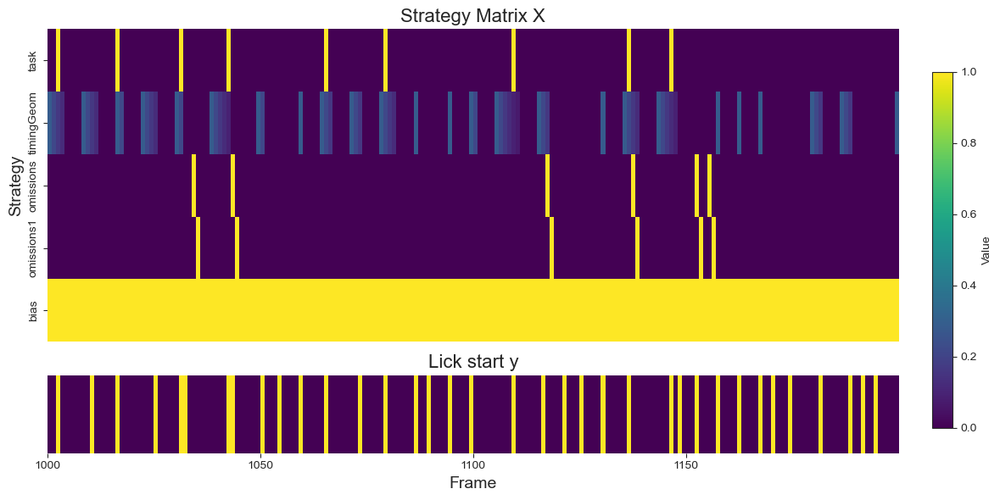

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1460.2373450284795
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 12.01%
Timing Index: 3.28%
Omission Index: 0.25%
Post-Omission Index: 1.37%
Overall Strategy Index: 8.73
Dominant Strategy: Visual

 Processing 1120272974


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


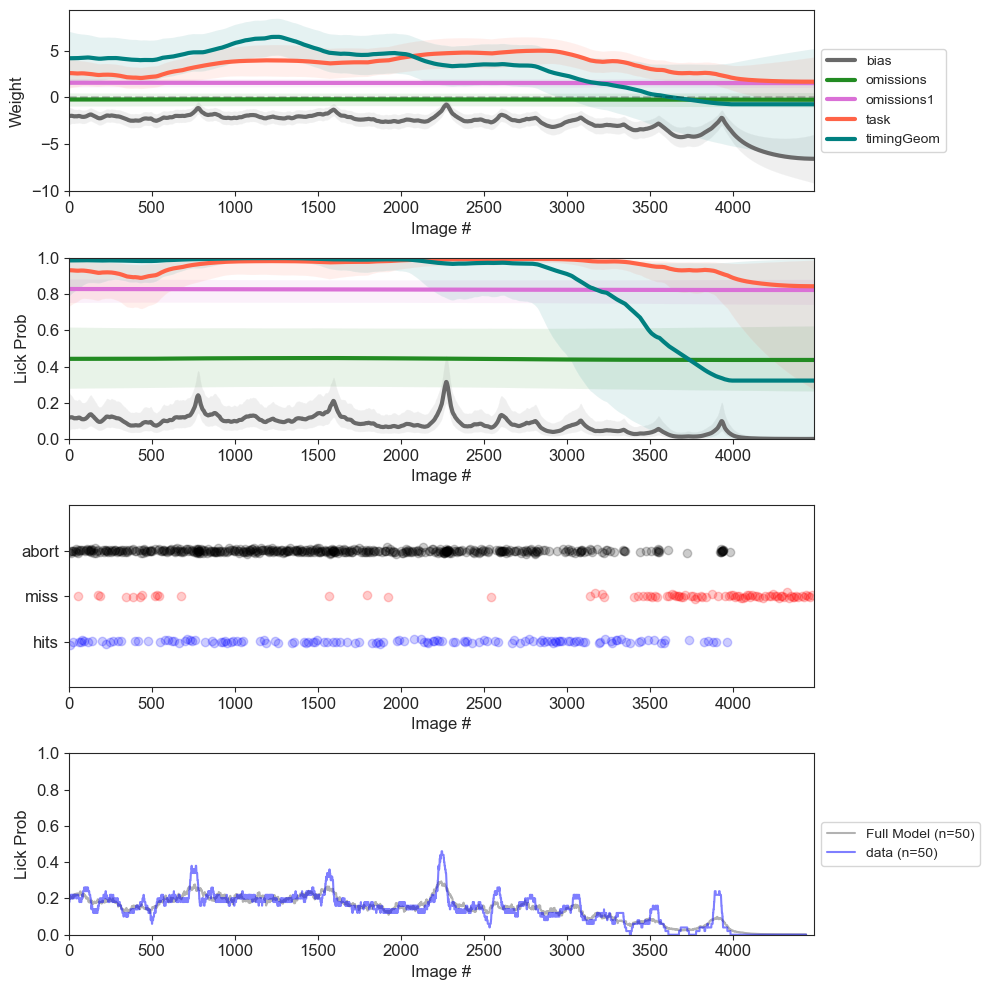

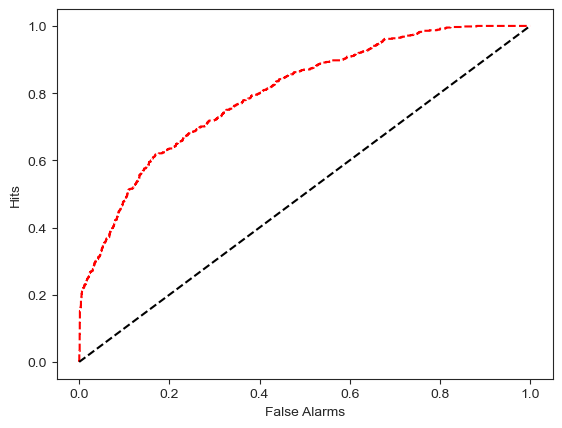

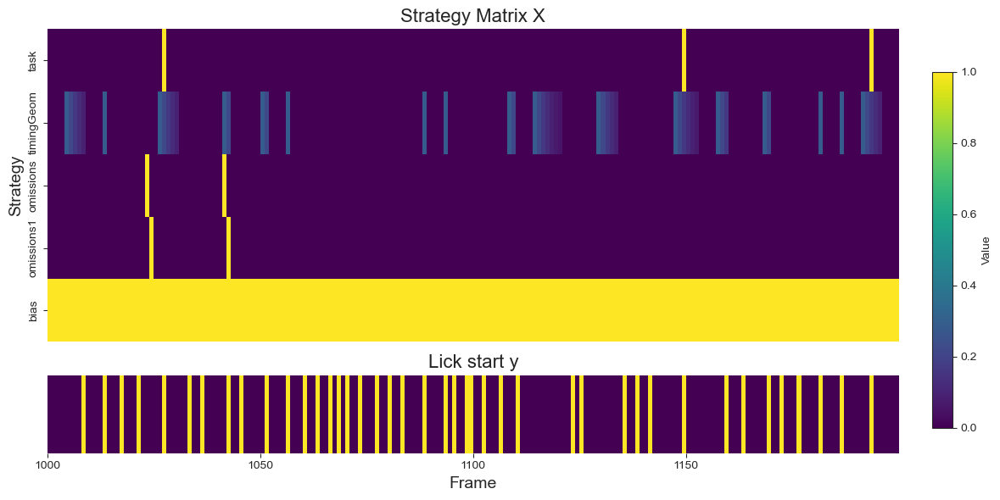

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1786.4178736666654
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 6.10%
Timing Index: 5.24%
Omission Index: 0.07%
Post-Omission Index: 1.51%
Overall Strategy Index: 0.86
Dominant Strategy: Visual

 Processing 1130191879


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


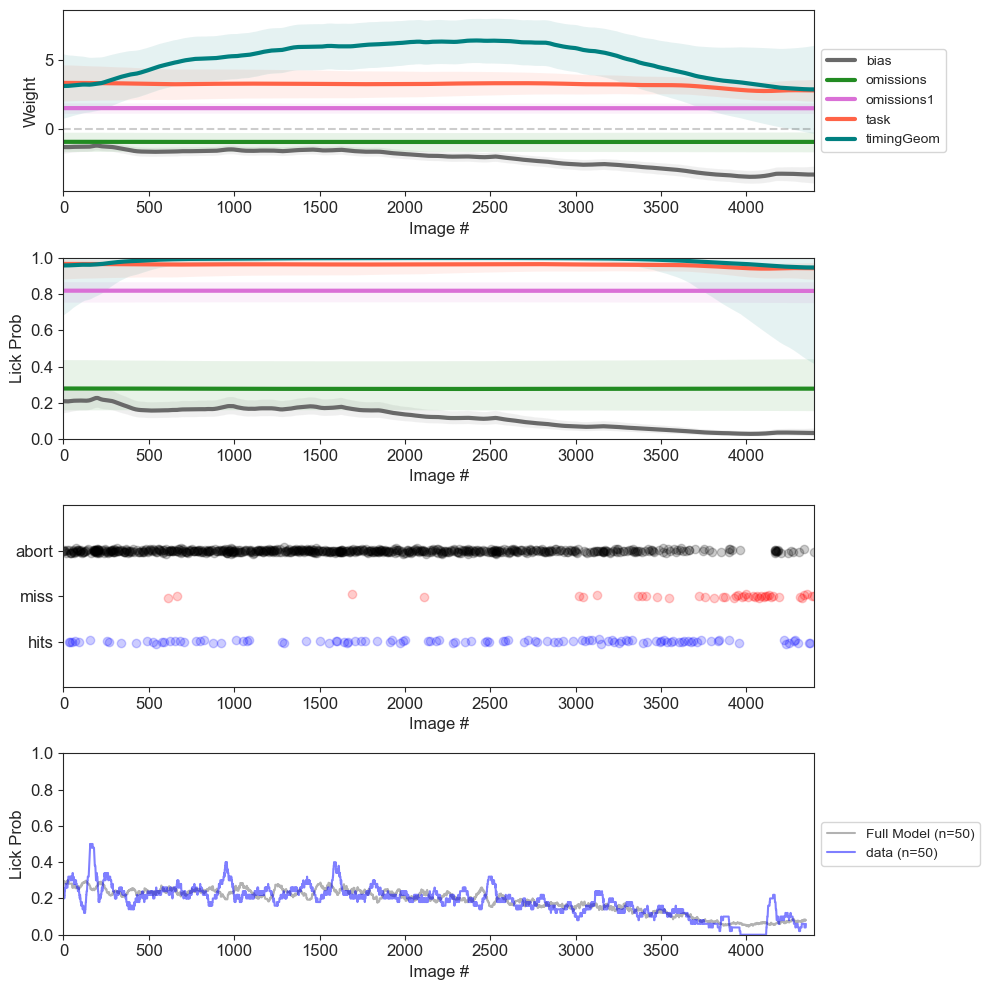

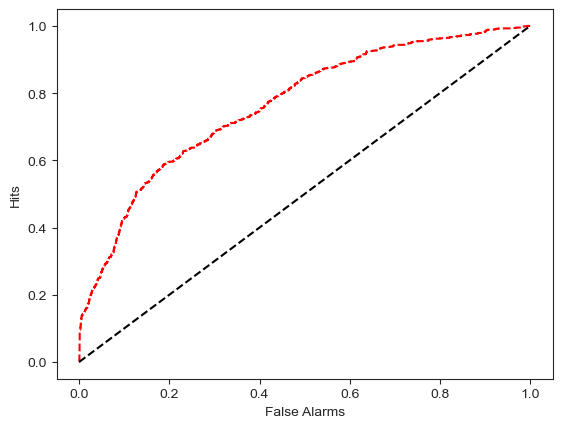

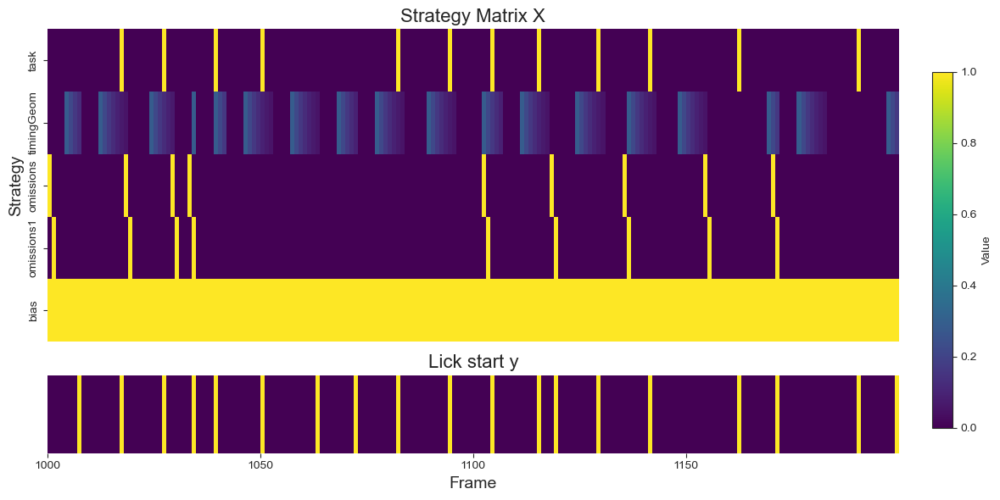

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1037.8694502003636
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 45.86%
Timing Index: 0.30%
Omission Index: 0.13%
Post-Omission Index: 10.11%
Overall Strategy Index: 45.56
Dominant Strategy: Visual

 Processing 1130378962


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


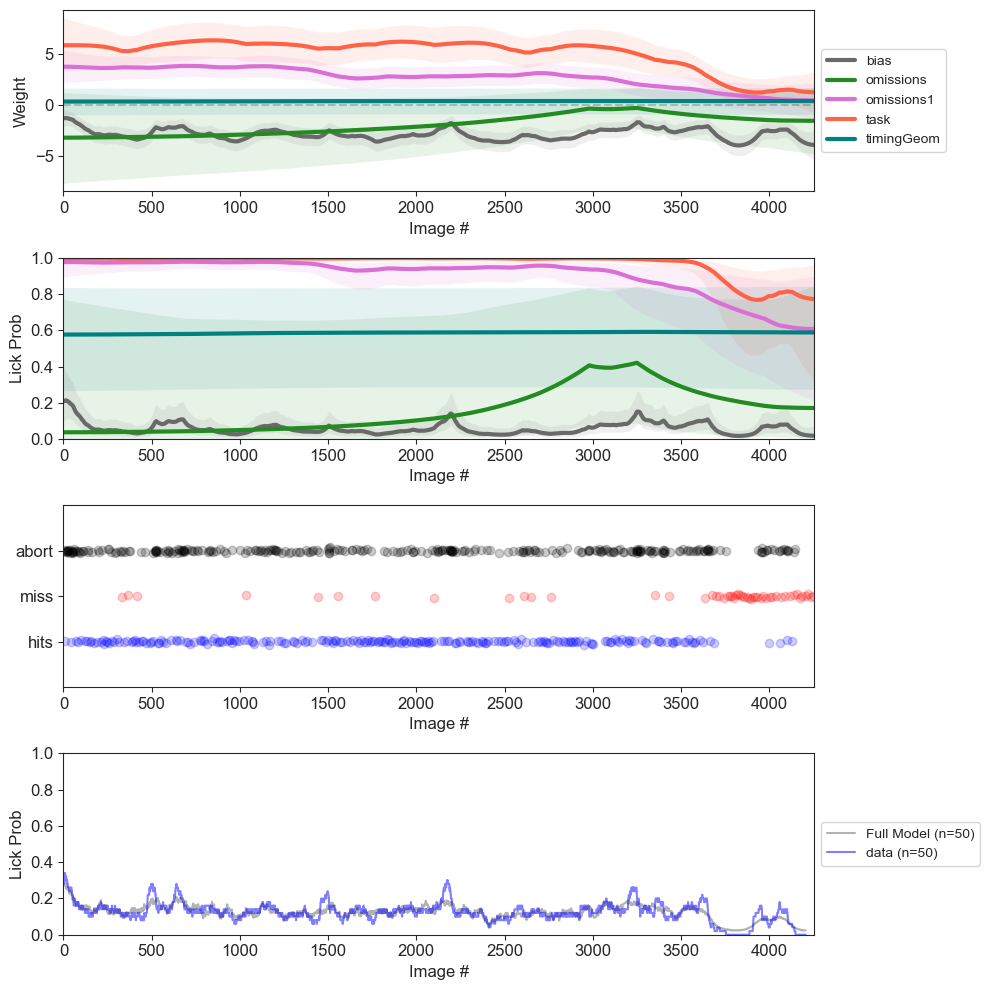

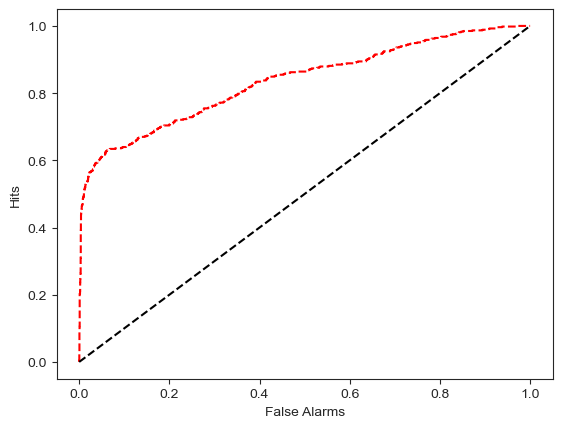

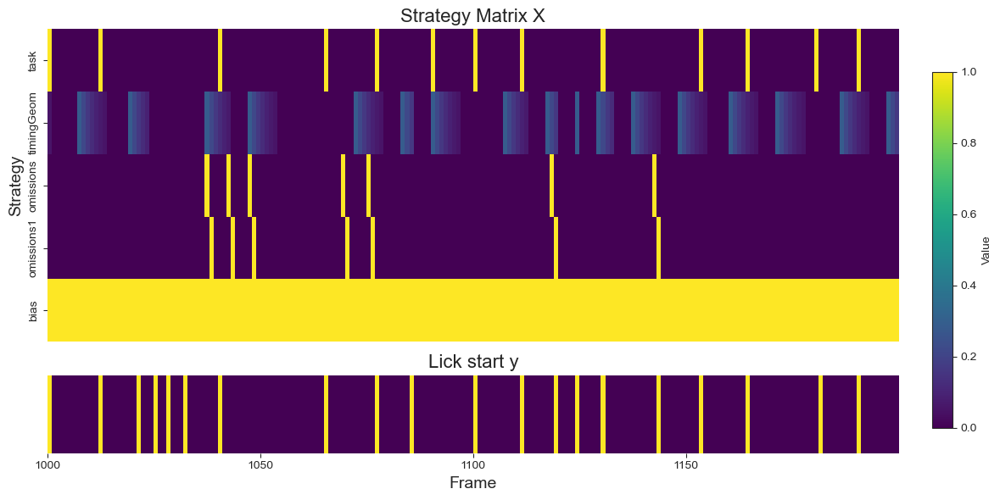

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1182.8806808042427
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 23.83%
Timing Index: 0.05%
Omission Index: 0.30%
Post-Omission Index: 3.93%
Overall Strategy Index: 23.78
Dominant Strategy: Visual

 Processing 1128557546


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


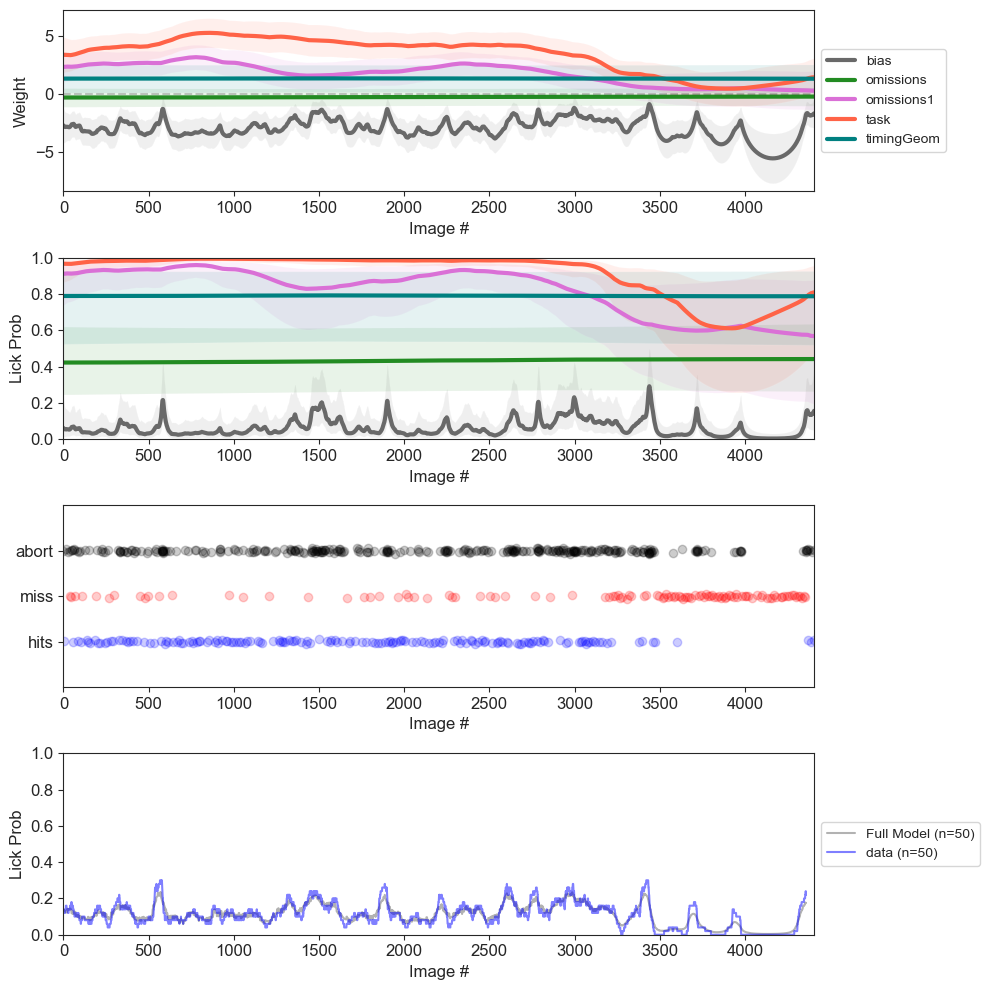

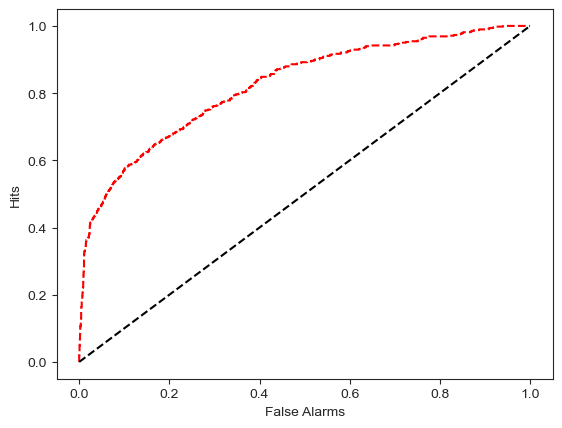

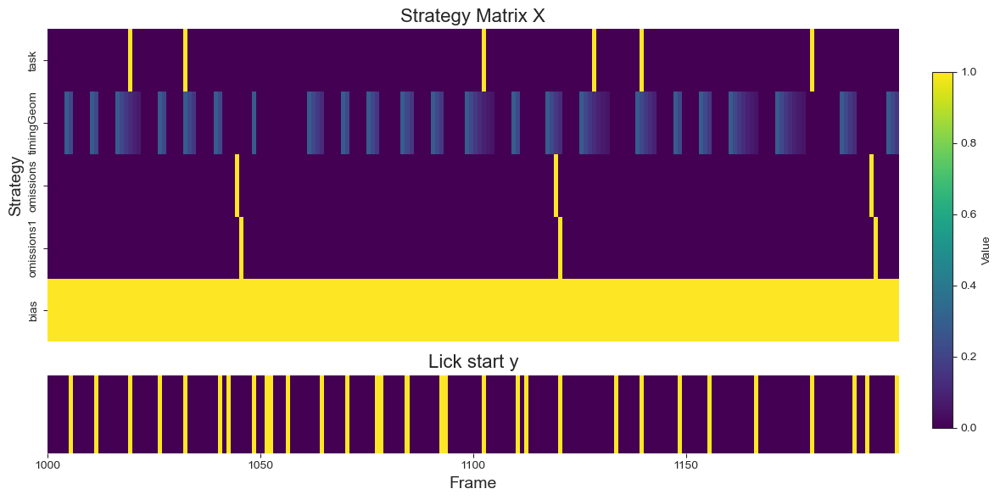

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1662.8589072478062
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 10.55%
Timing Index: 4.36%
Omission Index: 0.20%
Post-Omission Index: 0.96%
Overall Strategy Index: 6.20
Dominant Strategy: Visual

 Processing 1128774624


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


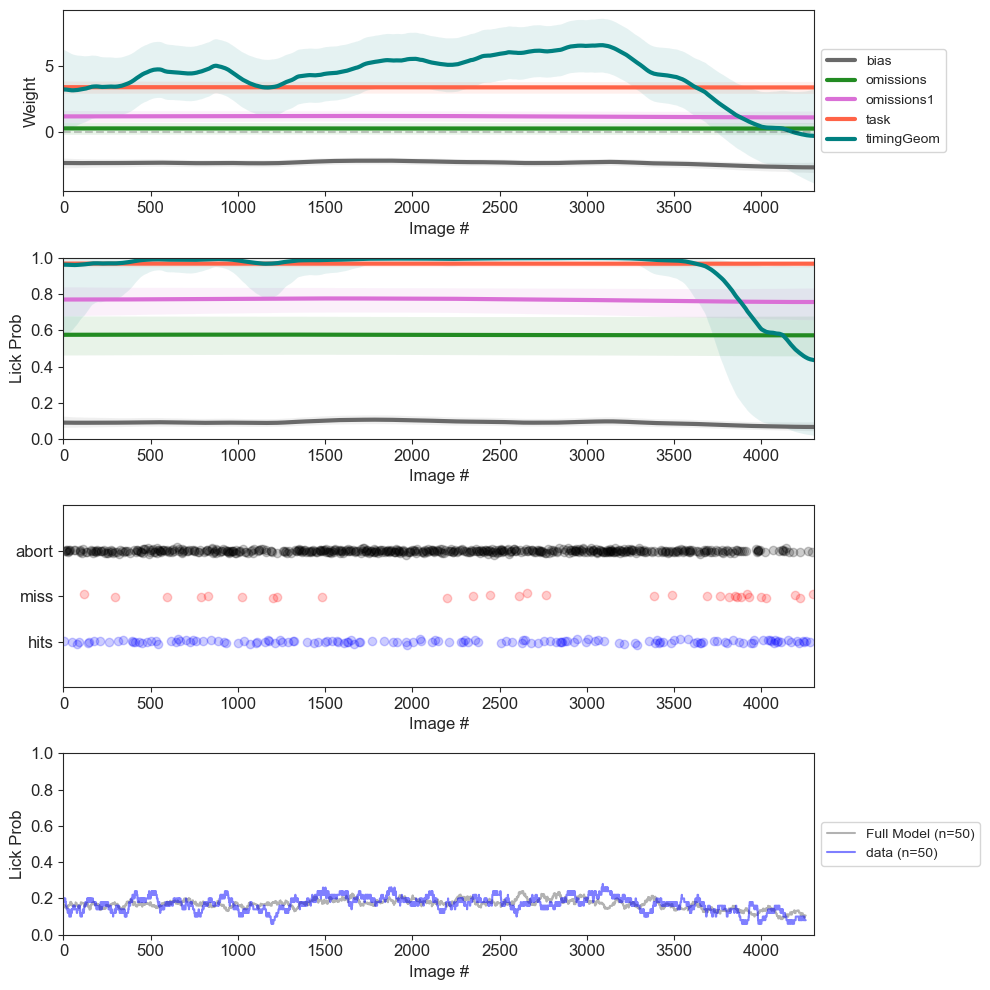

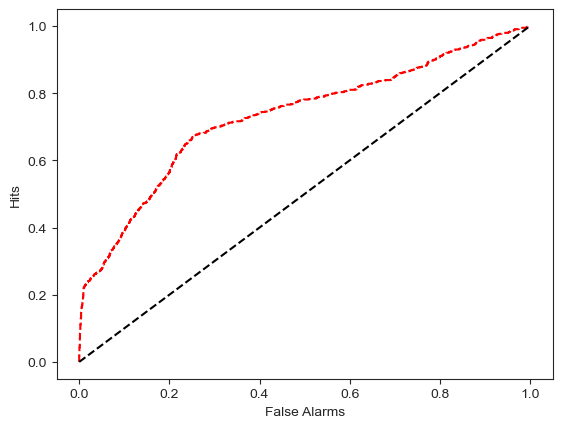

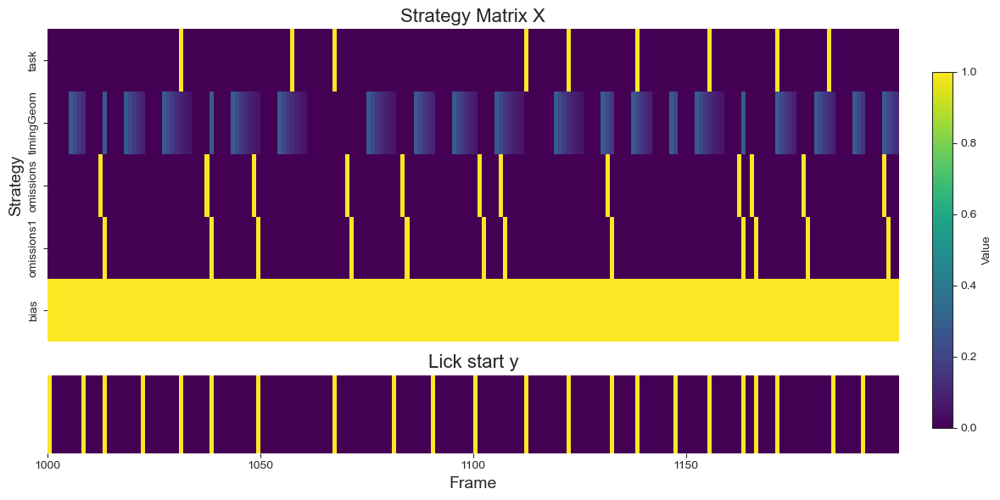

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1352.0103958839609
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 16.32%
Timing Index: 6.03%
Omission Index: 0.21%
Post-Omission Index: 2.27%
Overall Strategy Index: 10.29
Dominant Strategy: Visual

 Processing 1139969640


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


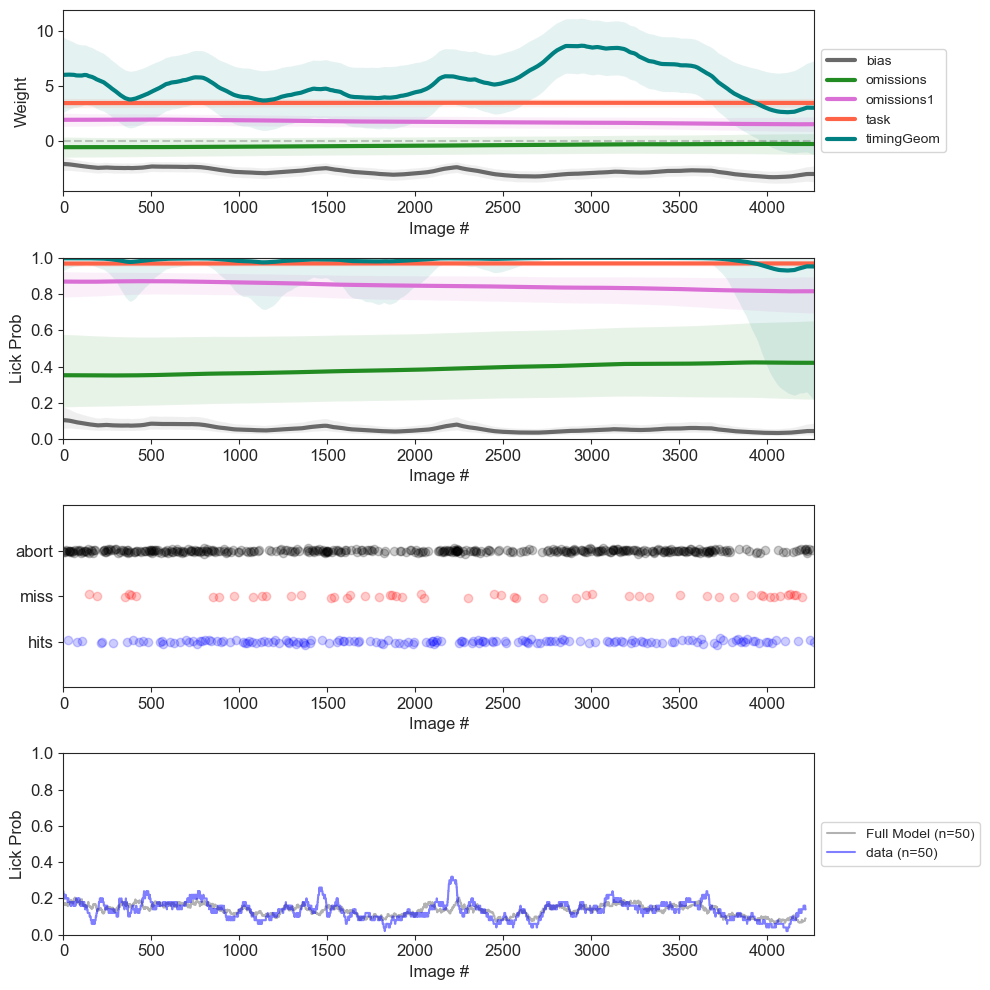

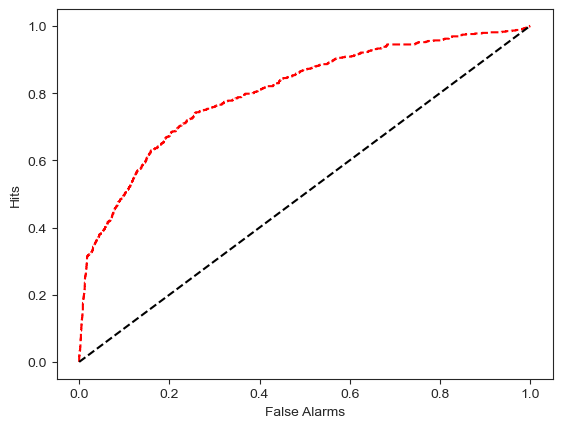

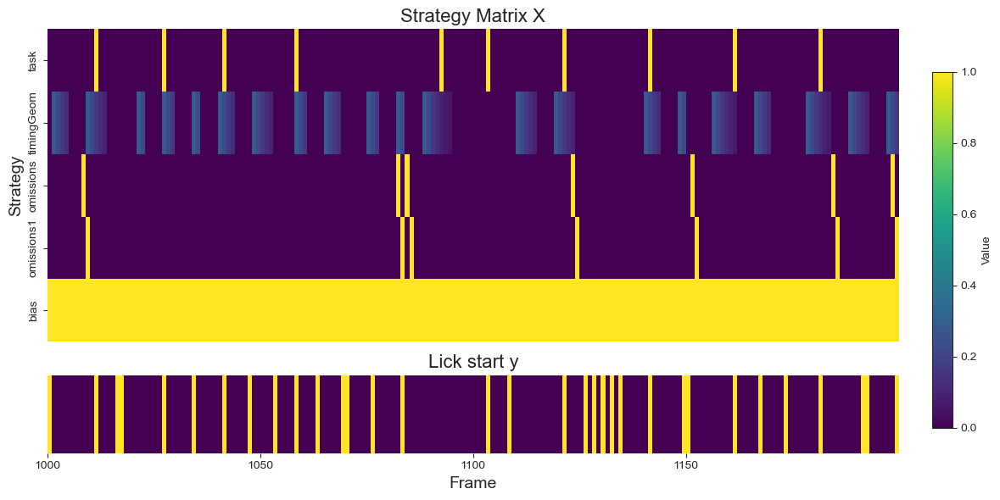

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1015.093294828097
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 21.76%
Timing Index: 0.29%
Omission Index: 0.22%
Post-Omission Index: 0.72%
Overall Strategy Index: 21.47
Dominant Strategy: Visual

 Processing 1153972744


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)
/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')
/Users/xinzheng/Repos/swdb_2024_project/src_local/format_Xy.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


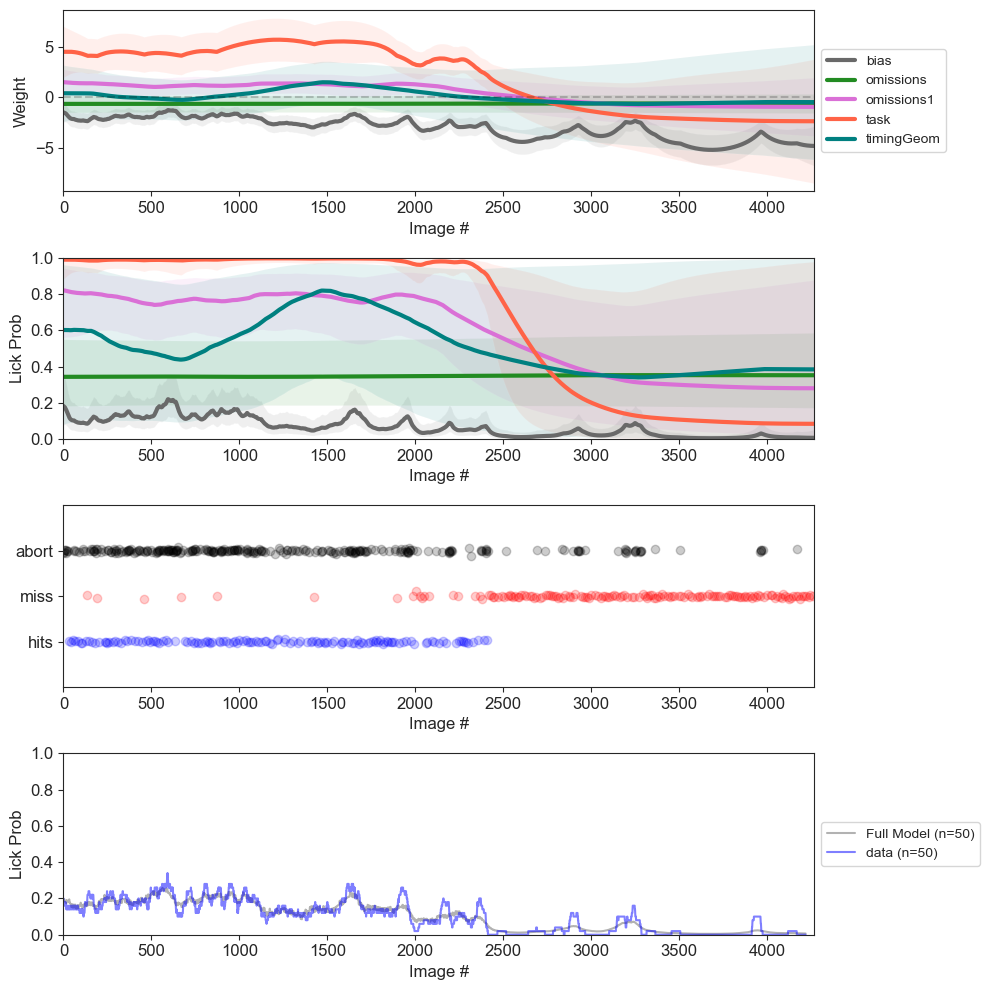

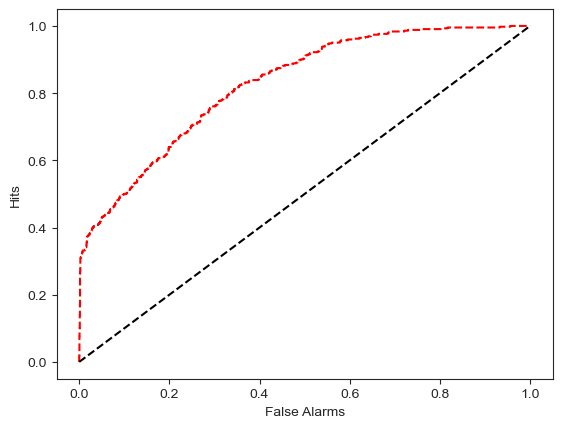

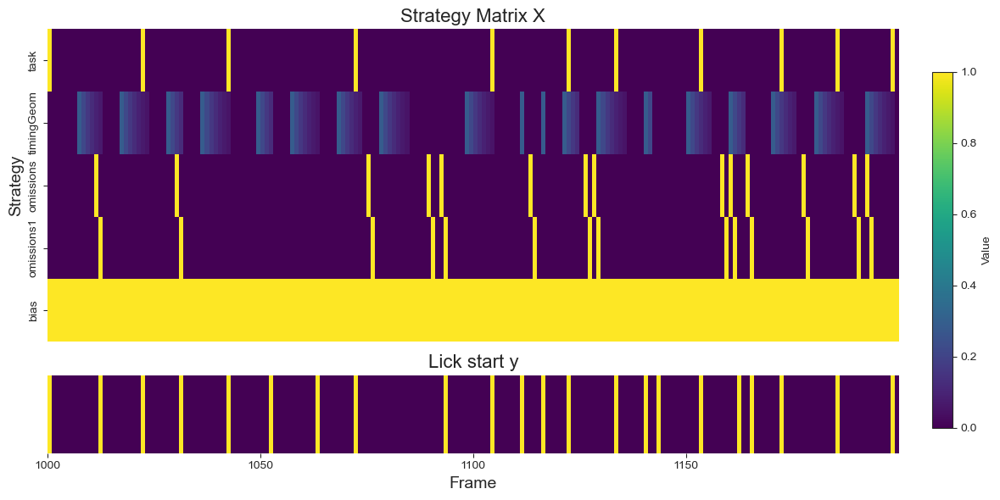

{'task': 1, 'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
Model Evidence: -1017.2498079241268
Cross Validation Analysis
running fold 9
Lesion Analysis
{'timingGeom': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'omissions': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions1': 1, 'bias': 1}
{'task': 1, 'timingGeom': 1, 'omissions': 1, 'bias': 1}
Visual Index: 25.64%
Timing Index: 0.19%
Omission Index: 0.01%
Post-Omission Index: 2.74%
Overall Strategy Index: 25.45
Dominant Strategy: Visual


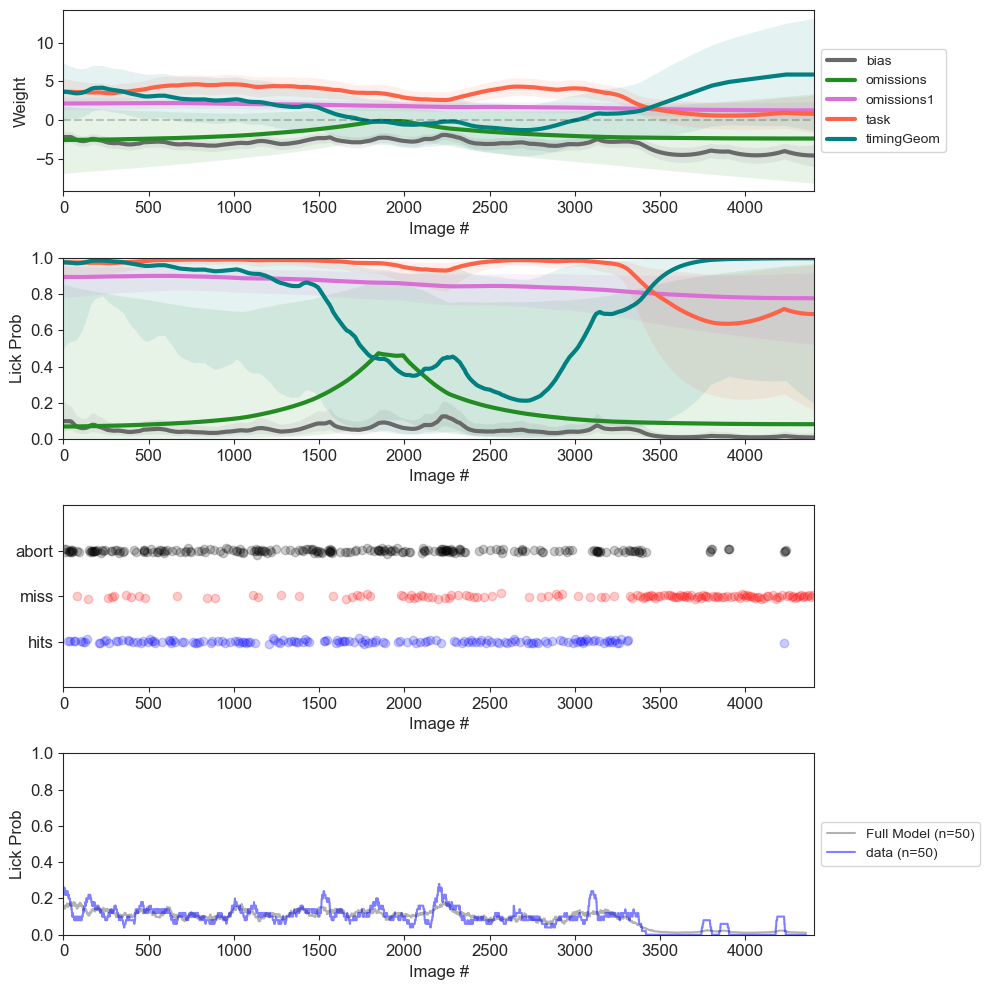

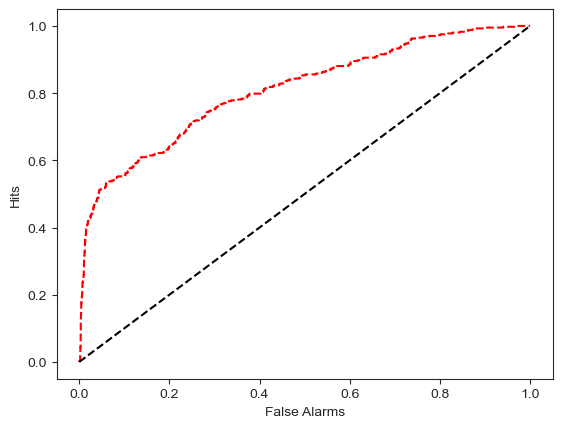

In [20]:
for bsid in subset_sessions.index:

    print(f'\n Processing {bsid}')

    dir = f'local_modelfit/ephys/geom/{bsid}'
    os.makedirs(dir, exist_ok=True)

    plot_dir = f'plots/modelfit/ephys/geom/{bsid}'
    os.makedirs(plot_dir, exist_ok=True)
    
    behavior_session = cache.get_behavior_session(bsid)
    licks = behavior_session.licks
    licks_annot = get_metrics.annotate_licks(licks, behavior_session)
    stimulus_presentations = behavior_session.stimulus_presentations
    stimulus_presentations = stimulus_presentations[stimulus_presentations['active']]
    stim_table = get_metrics.annotate_bouts(licks_annot, stimulus_presentations)

    format_options = {
                    'preprocess': 2, 
                    'timing_params': [-5,4],
                    'num_cv_folds': 10}

    psydata = format_Xy.build_regressor(stim_table, format_options, behavior_session)

    strategy_list = ['task', 'timingGeom', 'omissions','omissions1', 'bias']


    format_Xy.visualize_design(psydata['full_df'], strategy_list, f'{plot_dir}/weight_mat', t_start = 1000)

    # For other non-recording sessions
    if np.sum(stimulus_presentations.omitted) == 0:
        strategy_list.remove('omissions')
        strategy_list.remove('omissions1')
    hyp, evd, wMode, credibleInt,weights = psy_funcs.fit_weights(psydata,strategy_list)
    # Save to .npy file
    np.save(f'{dir}/wMode.npy', wMode)
    ypred,ypred_each = psy_funcs.compute_ypred(psydata, wMode,weights)
    psy_funcs.plot_weights(wMode, weights,psydata,errorbar=credibleInt, ypred=ypred,
        filename=f"{plot_dir}/fit")
    print('Model Evidence:', evd)

    print("Cross Validation Analysis")
    cross_psydata = psy.trim(psydata, 
    END=int(np.floor(len(psydata['y'])/format_options['num_cv_folds'])\
    *format_options['num_cv_folds'])) 
    cross_results = psy_funcs.compute_cross_validation(cross_psydata, hyp, weights,
    folds=format_options['num_cv_folds'])
    cv_pred = psy_funcs.compute_cross_validation_ypred(cross_psydata, cross_results,ypred)
    auc = psy_funcs.compute_model_roc(psydata['y'],cv_pred,plot_this=True)

    print("Lesion Analysis")
    minus_task = strategy_list.copy()
    minus_task.remove('task')
    _, evd_minus_task, _, _, _ = psy_funcs.fit_weights(psydata,minus_task)
    minus_timing =  [s for s in strategy_list if 'timing' not in s]
    _, evd_minus_timing, _, _, _ = psy_funcs.fit_weights(psydata,minus_timing)
    minus_omit = strategy_list.copy()
    minus_omit.remove('omissions')
    _, evd_minus_omit, _, _, _ = psy_funcs.fit_weights(psydata,minus_omit)
    minus_omit1 = strategy_list.copy()
    minus_omit1.remove('omissions1')
    _, evd_minus_omit1, _, _, _ = psy_funcs.fit_weights(psydata,minus_omit1)

    # Calculate indices
    visual_index = utils.calculate_index(evd, evd_minus_task)
    timing_index = utils.calculate_index(evd, evd_minus_timing)
    omission_index = utils.calculate_index(evd, evd_minus_omit)
    post_omission_index = utils.calculate_index(evd, evd_minus_omit1)

    # Calculate overall strategy index
    strategy_index = visual_index - timing_index

    print(f"Visual Index: {visual_index:.2f}%")
    print(f"Timing Index: {timing_index:.2f}%")
    print(f"Omission Index: {omission_index:.2f}%")
    print(f"Post-Omission Index: {post_omission_index:.2f}%")
    print(f"Overall Strategy Index: {strategy_index:.2f}")

    # Determine dominant strategy
    dominant_strategy = "Visual" if strategy_index > 0 else "Timing"
    print(f"Dominant Strategy: {dominant_strategy}")

    # Create a new row with the calculated values
    new_row = pd.DataFrame({
        'auc': [auc],
        'evd': [evd],
        'visual_index': [visual_index],
        'timing_index': [timing_index],
        'omission_index': [omission_index],
        'post_omission_index': [post_omission_index],
        'strategy_index': [strategy_index]
    }, index=[bsid])

    # Append the new row to session_df
    session_df = pd.concat([session_df, new_row])
    
session_df.to_csv('local_modelfit/ephys/strategy_summary_geom.csv')

----
### Cont. with the analysis




In [86]:
session_df = pd.read_csv('local_modelfit/ephys/strategy_summary_geom.csv', index_col= 0)

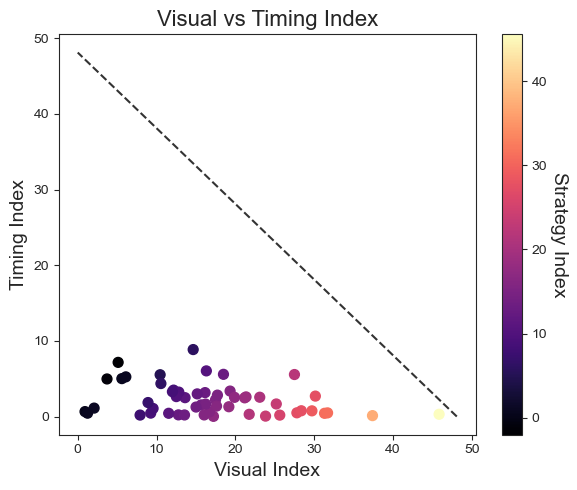

In [87]:
# Index plot

sns.set_style('ticks')
fig, ax = plt.subplots(figsize=(6, 5))

# Scatter plot with points colored by strategy_index
scatter = ax.scatter(x=session_df.visual_index, 
                     y=session_df.timing_index, 
                     c=session_df.strategy_index, 
                     cmap='magma', 
                     s=50, 
                     alpha=1) 

cbar = plt.colorbar(scatter)
cbar.set_label('Strategy Index', rotation=270, labelpad=15, fontsize = 14)

ax.set_xlabel('Visual Index', fontsize = 14)
ax.set_ylabel('Timing Index', fontsize = 14)
ax.set_title('Visual vs Timing Index', fontsize = 16)

max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
ax.plot([max_val, 0], [0, max_val], 'k--', alpha=0.8)

plt.tight_layout()
plt.show()

fig.savefig('plots/modelfit/ephys/geom/index.pdf')

/var/folders/45/vxs3qxtn0ql1mmj2dm1w3zxw0000gp/T/ipykernel_4635/3372557516.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.stripplot(x='Strategy', y='Reduction in Model Evidence', data=plot_data,
/var/folders/45/vxs3qxtn0ql1mmj2dm1w3zxw0000gp/T/ipykernel_4635/3372557516.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Strategy', y='Reduction in Model Evidence', data=plot_data,


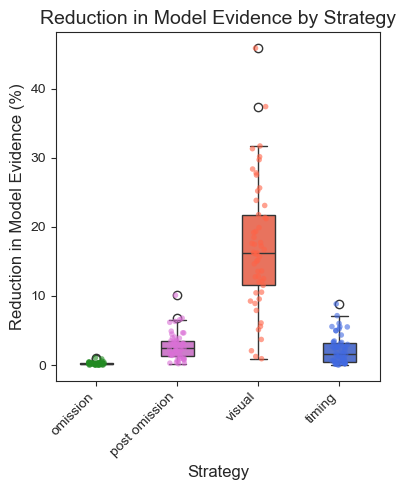

In [88]:
# from statannot import add_stat_annotation

# Lesion plot

# A new DataFrame in long format for easier plotting
plot_data = pd.melt(session_df, 
                    value_vars=['omission_index', 'post_omission_index', 'visual_index', 'timing_index'],
                    var_name='Strategy', value_name='Reduction in Model Evidence')

# Define the color map
colors = {
    'omission_index': 'forestgreen',
    'post_omission_index': 'orchid',
    'visual_index': 'tomato',
    'timing_index': 'royalblue',
}

fig = plt.figure(figsize=(4, 5))

# Create stripplot with colors from the colormap
ax = sns.stripplot(x='Strategy', y='Reduction in Model Evidence', data=plot_data,
                   palette=colors, size=4, jitter=True, alpha=0.6)

# Create boxplot with colors from the colormap
sns.boxplot(x='Strategy', y='Reduction in Model Evidence', data=plot_data,
            palette=colors, width=0.4)

# Customize the plot
plt.title('Reduction in Model Evidence by Strategy', fontsize=14)
plt.xlabel('Strategy', fontsize=12)
plt.ylabel('Reduction in Model Evidence (%)', fontsize=12)
plt.xticks(range(4), ['omission', 'post omission', 'visual', 'timing'], rotation=45, ha='right')

# Adjust layout and display
plt.tight_layout()
plt.show()

fig.savefig('plots/modelfit/ephys/geom/lesion.pdf')


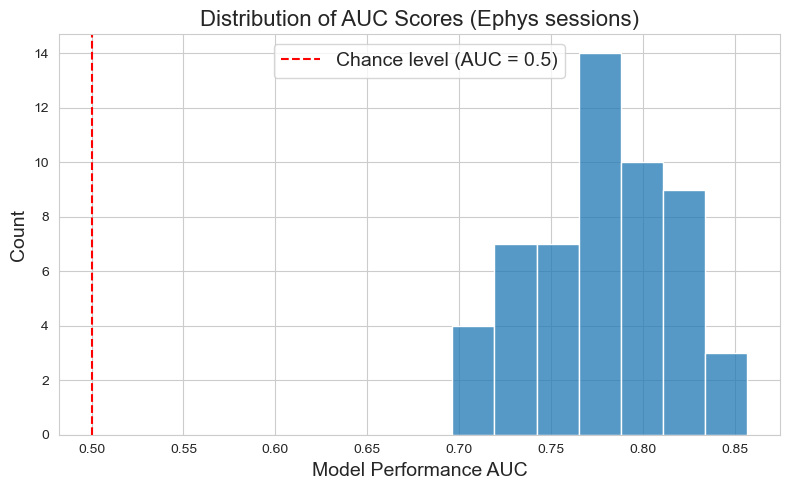

In [89]:
# AUC plot

sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize = [8, 5])
sns.histplot(session_df.auc)
ax.axvline(x=0.5, color='red', linestyle='--', label='Chance level (AUC = 0.5)')

plt.title('Distribution of AUC Scores (Ephys sessions)', fontsize=16)
plt.xlabel('Model Performance AUC', fontsize=14)
plt.ylabel('Count', fontsize=14)

plt.legend(fontsize = 14)

plt.tight_layout()
plt.show()

fig.savefig('plots/modelfit/ephys/geom/auc.pdf')


#### Grab extreme sessions:

In [95]:
session_df.columns[0]

'Unnamed: 0'

In [97]:
session_df.columns =['bsid'] + session_df.columns.to_list()[1:]

In [98]:
# Sort the DataFrame by strategy_index
session_df_sorted = session_df.sort_values('strategy_index', ascending=False)

In [100]:
# Print top 5 visual strategy sessions
print("Top 5 Visual Strategy Sessions:")
session_df_sorted.head()[['bsid','strategy_index']]

Top 5 Visual Strategy Sessions:


,bsid,strategy_index
48,1130191879,45.557255
14,1062781531,37.285345
36,1104106044,31.221340
18,1067611872,30.891277
23,1069251052,28.965833


In [101]:
print("\nTop 5 Timing Strategy Sessions:")
session_df_sorted.tail()[['bsid','strategy_index']]


Top 5 Timing Strategy Sessions:


,bsid,strategy_index
45,1118600316,0.805965
8,1056528863,0.589711
44,1118353478,0.272865
1,1071409009,-1.249269
17,1063068179,-2.029157


In [102]:
behavior_session.list_data_attributes_and_methods()

['behavior_session_id',
 'eye_tracking',
 'eye_tracking_rig_geometry',
 'get_performance_metrics',
 'get_reward_rate',
 'get_rolling_performance_df',
 'licks',
 'metadata',
 'raw_running_speed',
 'rewards',
 'running_speed',
 'stimulus_presentations',
 'stimulus_templates',
 'stimulus_timestamps',
 'task_parameters',
 'trials']

In [104]:
behavior_session.get_performance_metrics()

{'trial_count': 545,
 'go_trial_count': 293,
 'catch_trial_count': 41,
 'hit_trial_count': 147,
 'miss_trial_count': 146,
 'false_alarm_trial_count': 2,
 'correct_reject_trial_count': 39,
 'auto_reward_count': 3,
 'earned_reward_count': 147,
 'total_reward_count': 150,
 'total_reward_volume': 0.45599999999999996,
 'maximum_reward_rate': 4.205886156794096,
 'engaged_trial_count': 430,
 'mean_hit_rate': 0.6139013338030722,
 'mean_hit_rate_uncorrected': 0.6153983397910961,
 'mean_hit_rate_engaged': 0.7019998065324163,
 'mean_false_alarm_rate': 0.07970934768373099,
 'mean_false_alarm_rate_uncorrected': 0.03254057770186802,
 'mean_false_alarm_rate_engaged': 0.09079628597528518,
 'mean_dprime': 1.790583217157565,
 'mean_dprime_engaged': 1.9941593657719958,
 'max_dprime': 2.714039824349285,
 'max_dprime_engaged': 2.714039824349285}

In [105]:
rewards = []
aborted = []
false_alarms = []
max_dprimes = []

for bsid in subset_sessions.index:
    print('\n Processing:', bsid)
    behavior_session = cache.get_behavior_session(bsid)
    # session_df.loc[bsid]['rewards'] = behavior_session.get_performance_metrics()['earned_reward_count']
    performace_metrics = behavior_session.get_performance_metrics()
    rewards.append(performace_metrics['earned_reward_count'])
    false_alarms.append(performace_metrics['false_alarm_trial_count'])
    max_dprimes.append(performace_metrics['max_dprime'])
    aborted.append(np.sum(behavior_session.trials['aborted']))



 Processing: 1050987699


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1071409009


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1071005395


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1077916733


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1084963019


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1044408432


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1044624428


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1052162536


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1056528863


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1056746264


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1055253879


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1055431030


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1055260435


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1055434752


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1062781531


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1063068136


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1062787784


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1063068179


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1067611872


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1067817036


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1065491938


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1065927708


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1070995428


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1069251052


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1069520080


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1071409007


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1077733165


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1081118392


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1081474898


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1084451488


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1079337334


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1079049704


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1081125370


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1081469485


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1099625106


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1099904879


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1104106044


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1104327579


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1109709062


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1109924339


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1108365127


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1108565586


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1116979796


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1117166453


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1118353478


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1118600316


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1119976479


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1120272974


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1130191879


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1130378962


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1128557546


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1128774624


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1139969640


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)



 Processing: 1153972744


/opt/anaconda3/envs/swdb2024/lib/python3.9/site-packages/hdmf/utils.py:668: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  return func(args[0], **pargs)


In [106]:
session_df.to_csv('local_modelfit/ephys/strategy_summary_geom.csv')

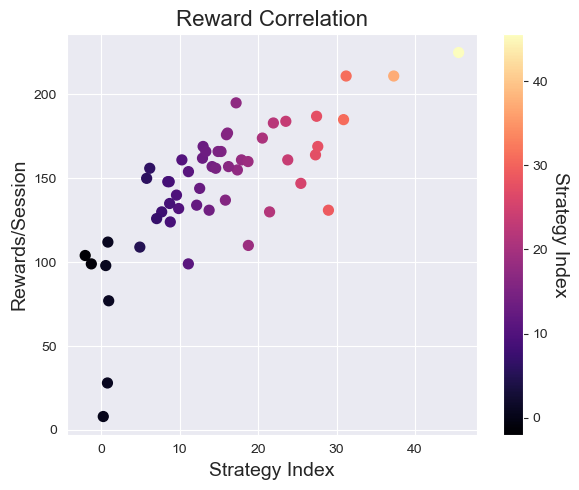

In [107]:
# Reward plot
session_df['rewards'] = rewards

sns.set_style('darkgrid')
fig, ax = plt.subplots(figsize=(6, 5))

# Scatter plot with points colored by strategy_index
scatter = ax.scatter(x=session_df.strategy_index, 
                     y=session_df.rewards, 
                     c=session_df.strategy_index, 
                     cmap='magma', 
                     s=50, 
                     alpha=1) 

cbar = plt.colorbar(scatter)
cbar.set_label('Strategy Index', rotation=270, labelpad=15, fontsize = 14)

ax.set_xlabel('Strategy Index', fontsize = 14)
ax.set_ylabel('Rewards/Session', fontsize = 14)
ax.set_title('Reward Correlation', fontsize = 16)

# max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
# ax.plot([max_val, 0], [0, max_val], 'k--', alpha=0.8)

plt.tight_layout()
plt.show()

fig.savefig('plots/modelfit/ephys/geom/reward.pdf')

In [108]:
session_df['aborted'] = aborted
session_df['false_alarms'] = false_alarms
session_df['max_dprimes'] = max_dprimes


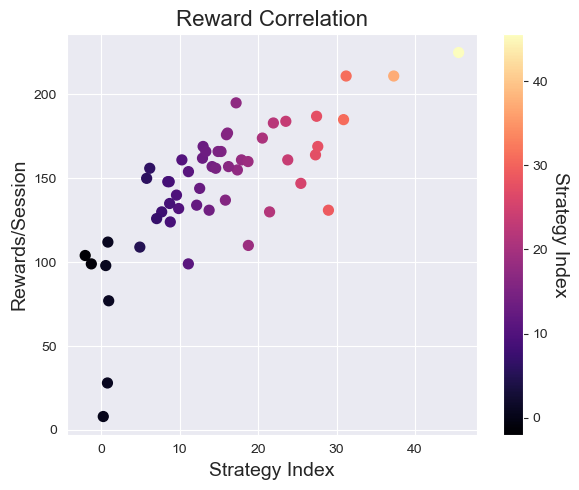

In [109]:
sns.set_style('darkgrid')
fig, ax = plt.subplots(figsize=(6, 5))

# Scatter plot with points colored by strategy_index
scatter = ax.scatter(x=session_df.strategy_index, 
                     y=session_df.rewards, 
                     c=session_df.strategy_index, 
                     cmap='magma', 
                     s=50, 
                     alpha=1) 

cbar = plt.colorbar(scatter)
cbar.set_label('Strategy Index', rotation=270, labelpad=15, fontsize = 14)

ax.set_xlabel('Strategy Index', fontsize = 14)
ax.set_ylabel('Rewards/Session', fontsize = 14)
ax.set_title('Reward Correlation', fontsize = 16)

# max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
# ax.plot([max_val, 0], [0, max_val], 'k--', alpha=0.8)

plt.tight_layout()
plt.show()
fig.savefig('plots/modelfit/ephys/geom/rewards.pdf')

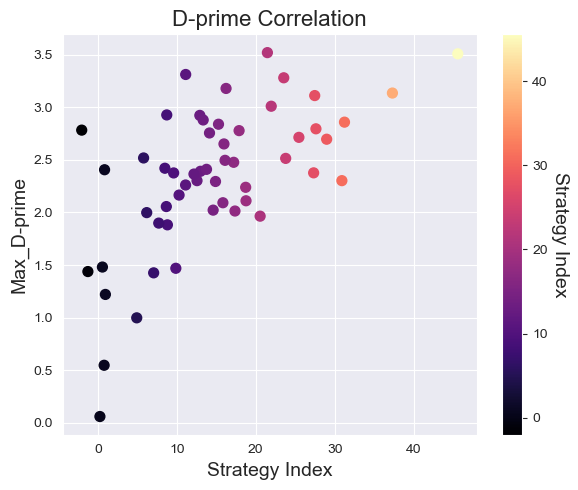

In [113]:
sns.set_style('darkgrid')
fig, ax = plt.subplots(figsize=(6, 5))

# Scatter plot with points colored by strategy_index
scatter = ax.scatter(x=session_df.strategy_index, 
                     y=session_df.max_dprimes, 
                     c=session_df.strategy_index, 
                     cmap='magma', 
                     s=50, 
                     alpha=1) 

cbar = plt.colorbar(scatter)
cbar.set_label('Strategy Index', rotation=270, labelpad=15, fontsize = 14)

ax.set_xlabel('Strategy Index', fontsize = 14)
ax.set_ylabel('Max_D-prime', fontsize = 14)
ax.set_title('D-prime Correlation', fontsize = 16)

# max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
# ax.plot([max_val, 0], [0, max_val], 'k--', alpha=0.8)

plt.tight_layout()
plt.show()
fig.savefig('plots/modelfit/ephys/geom/max_dprimes.pdf')

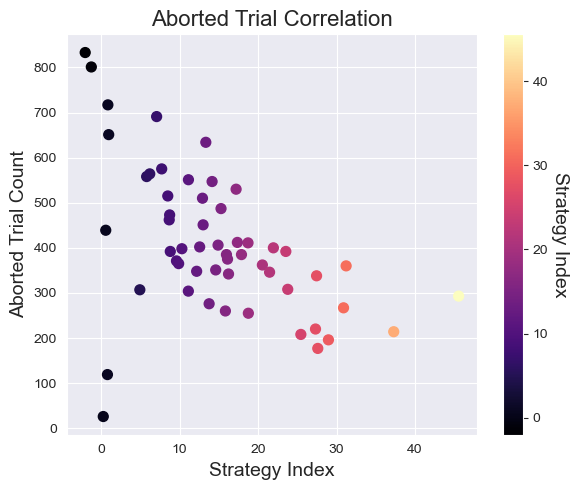

In [114]:
sns.set_style('darkgrid')
fig, ax = plt.subplots(figsize=(6, 5))

# Scatter plot with points colored by strategy_index
scatter = ax.scatter(x=session_df.strategy_index, 
                     y=session_df.aborted, 
                     c=session_df.strategy_index, 
                     cmap='magma', 
                     s=50, 
                     alpha=1) 

cbar = plt.colorbar(scatter)
cbar.set_label('Strategy Index', rotation=270, labelpad=15, fontsize = 14)

ax.set_xlabel('Strategy Index', fontsize = 14)
ax.set_ylabel('Aborted Trial Count', fontsize = 14)
ax.set_title('Aborted Trial Correlation', fontsize = 16)

# max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
# ax.plot([max_val, 0], [0, max_val], 'k--', alpha=0.8)

plt.tight_layout()
plt.show()
fig.savefig('plots/modelfit/ephys/geom/aborted.pdf')

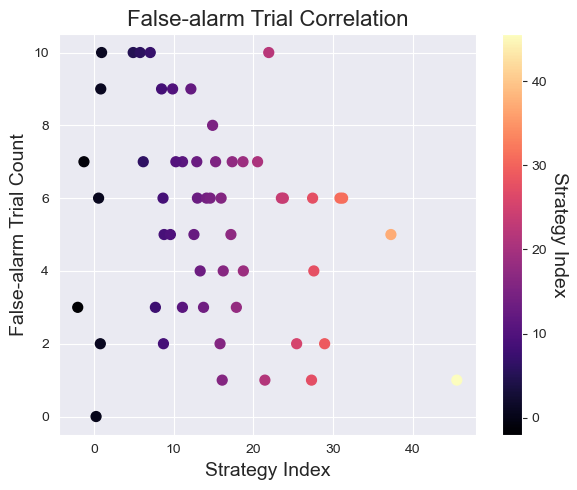

In [115]:
sns.set_style('darkgrid')
fig, ax = plt.subplots(figsize=(6, 5))

# Scatter plot with points colored by strategy_index
scatter = ax.scatter(x=session_df.strategy_index, 
                     y=session_df.false_alarms, 
                     c=session_df.strategy_index, 
                     cmap='magma', 
                     s=50, 
                     alpha=1) 

cbar = plt.colorbar(scatter)
cbar.set_label('Strategy Index', rotation=270, labelpad=15, fontsize = 14)

ax.set_xlabel('Strategy Index', fontsize = 14)
ax.set_ylabel('False-alarm Trial Count', fontsize = 14)
ax.set_title('False-alarm Trial Correlation', fontsize = 16)

# max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
# ax.plot([max_val, 0], [0, max_val], 'k--', alpha=0.8)

plt.tight_layout()
plt.show()
fig.savefig('plots/modelfit/ephys/geom/false_alarms.pdf')

### Correlation between to ways of setting up the strategies

In [117]:
session_df_1D = pd.read_csv('local_modelfit/ephys/strategy_summary.csv')

In [119]:
session_df_1D.columns = ['bsid'] + session_df_1D.columns.to_list()[1:]

In [126]:
r = np.corrcoef(session_df.strategy_index, session_df_1D.strategy_index)
r[0, 1]

0.8755618197692863

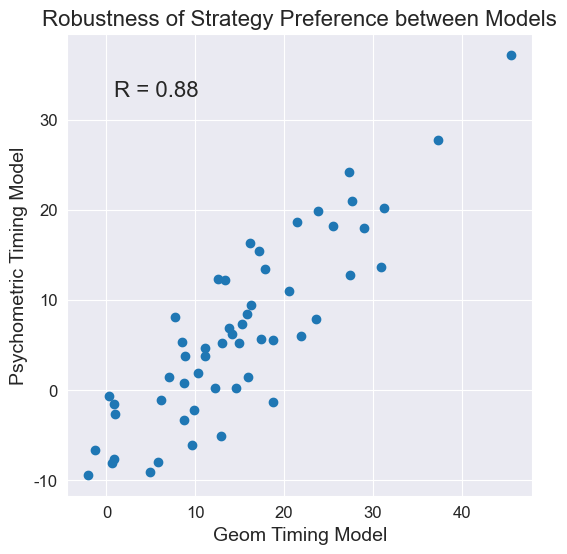

In [152]:
fig, ax = plt.subplots(figsize = (6, 6))
plt.scatter(session_df.strategy_index, session_df_1D.strategy_index)
ax.set_xlabel('Geom Timing Model', fontsize = 14)
ax.set_ylabel('Psychometric Timing Model', fontsize = 14)
ax.set_xticks(np.arange(0, 41, 10))
ax.set_xticklabels(np.arange(0, 41, 10), fontsize = 12)
ax.set_yticks(np.arange(-10, 31, 10))
ax.set_yticklabels(np.arange(-10, 31, 10), fontsize = 12)
# Move text to top-left corner
ax.text(0.10, 0.90, f'R = {r[0, 1]:.2f}', fontsize=16, 
        transform=ax.transAxes, verticalalignment='top')
ax.set_title('Robustness of Strategy Preference between Models', fontsize = 16)
plt.show()

fig.savefig('plots/modelfit/between_timing_models.pdf')